<a href="https://colab.research.google.com/github/ahmedengu/feature_importance/blob/master/Stocks/Germany/adidas/adidas_1D_Close.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from IPython.display import clear_output
import pandas as pd

if pd.__version__ != '0.25.0' or False:
  # install
  !apt-get install default-jre build-essential swig
  !pip  install h2o==3.24.0.5 yfinance==0.1.43
  !pip  install git+https://github.com/ahmedengu/findatapy.git pandas==0.25.0
  clear_output(wait=True)

  !wget http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz
  !tar -xzvf ta-lib-0.4.0-src.tar.gz
  %cd ta-lib
  !./configure --prefix=/usr
  clear_output(wait=True)
  !make
  clear_output(wait=True)
  !make install
  clear_output(wait=True)
  !pip install Ta-Lib==0.4.17
  clear_output(wait=True)
  print('RESTARTING')
  %cd /content
  
  # force restart
  import os
  os.kill(os.getpid(), 9)

In [0]:
# Experiment Config
import pandas as pd
from IPython.display import display
from IPython.core.debugger import set_trace

data_ticker = "ADS.DE"
data_resample = '1D'
data_label = 'Close'
data_label_name = 'y'
start_date = '1 Jan 2009'
finish_date = '1 Jan 2019'
is_duka = False
is_yahoo = True
kaggle_file = 'bitstamp' # default None
kaggle_folder = '1 Day/Stocks'

models_summary = {}
for metric in ['accuracy','F1','auc','logloss','mean_per_class_error','rmse','mse']:
  models_summary.update({metric:pd.DataFrame()})

# feature elimination config
model_selected_features = 50
PCA_k = 50
HCF_threshold = 0.90
LVF_threshold = 0.1
GLRM_k = 20
select_k = 50
select_percentile = 10
select_alpha = 0.1
select_rfe = 50

features_to_include = ['All', 'DLF', 'XGBF', 'RFE', 'Fwe'] # True for all , ['All','Fwe','RFE','Percentile','KBest','LVF','HCF','PCA','XGBF','GLMF','DLF','GLRM'] 
is_EDA = True
max_models_num = 10

# pandas options
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [4]:
# random seed
from numpy.random import seed
seed(1)
from tensorflow import set_random_seed
set_random_seed(1)
import pandas as pd
import gc
import os

resample_how= {'Open': 'first', 'High': 'max', 'Low': 'min', 'Close': 'last',
                             'Volume': 'sum', 'Date': 'first'}

if is_duka:
  from findatapy.util import DataConstants

  DataConstants.market_thread_no.update({'dukascopy': 64})

  # Download dataset
  from findatapy.market import Market, MarketDataRequest, MarketDataGenerator

  market = Market(market_data_generator=MarketDataGenerator(log_every_day=30))

  md_request = MarketDataRequest(start_date=start_date, finish_date=finish_date,
                                       fields=['temp', 'ask', 'bid', 'askv', 'bidv'], vendor_fields=['temp', 'ask', 'bid', 'askv', 'bidv'],
                                       freq='tick', data_source='dukascopy',
                                       tickers=[data_ticker], vendor_tickers=[data_ticker])

  temp_dataset = market.fetch_market(md_request)
  full_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bid'].resample(data_resample).ohlc())
  full_dataset.columns = ['Open', 'High', 'Low', 'Close']
  temp_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bidv'].resample(data_resample).sum())
  temp_dataset.columns = ['Volume']
  full_dataset['Volume'] = temp_dataset['Volume']

  del temp_dataset, md_request, market, DataConstants, Market, MarketDataRequest, MarketDataGenerator

  gc.collect()

elif is_yahoo:
  import yfinance as yf
  from datetime import datetime

  full_dataset = yf.download(data_ticker, start=str(datetime.strptime(start_date, '%d %b %Y')).split(' ')[0], end=str(datetime.strptime(finish_date, '%d %b %Y')).split(' ')[0])
  full_dataset['Date']=full_dataset.index
  del yf,datetime

elif data_ticker == 'EURUSD':
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2014.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2015.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2016.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2017.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2018.zip
  !unzip -qq -o \*.zip
  full_dataset = pd.read_csv('DAT_ASCII_EURUSD_M1_2014.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';')
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2015.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2016.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2017.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2018.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset['Date'] = pd.to_datetime(full_dataset['Date'])
  full_dataset.index = full_dataset['Date']
  full_dataset = full_dataset.dropna()
  full_dataset = full_dataset.sort_index()
  full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]


    
elif data_ticker == 'APPLUSUSD':
  full_dataset=pd.read_csv('https://github.com/kyleconroy/apple-stock/raw/master/apple_stock_data.csv',index_col =0,parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > '2007-04-01']


elif data_ticker == 'COMI':
  full_dataset=pd.read_csv('https://static.mubasher.info/File.MubasherCharts/File.Historical_Stock_Charts_Dir/44507230b2b03e2da37352abf1a659545b44.csv',index_col =0,names =['Open', 'High', 'Low', 'Close','Volume'],parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Volume'] = full_dataset['Volume'] * full_dataset['Close'] 
  full_dataset = full_dataset.drop_duplicates()
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]
  
elif kaggle_file is not None:
  if not os.path.isfile('kaggle.json'):
    from google.colab import files
    files.upload()
    
    import time
    time.sleep(10)
    !ls
    !mkdir -p ~/.kaggle
    !cp kaggle.json ~/.kaggle/
    !ls ~/.kaggle

    !chmod 600 /root/.kaggle/kaggle.json
    del files
    
  !kaggle datasets download $data_ticker
  !unzip -qq -o \*.zip
  !unzip -qq -o \*.zip

  if data_ticker == 'mczielinski/bitcoin-historical-data':
    
    full_dataset = pd.read_csv([file for file in os.listdir() if kaggle_file in file][0])
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Volume_(Currency)','Weighted_Price']
    full_dataset.index=pd.to_datetime(full_dataset['Date'], unit='s')

    resample_how.update({'Volume_(Currency)': 'sum', 'Weighted_Price': 'last'})

    full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()[1:-1]
    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]
  
  elif data_ticker == 'borismarjanovic/daily-and-intraday-stock-price-data':
    
    full_dataset = pd.read_csv(kaggle_folder + '/' + [file for file in os.listdir(kaggle_folder) if kaggle_file in file][0])
    if 'Time' in full_dataset.columns:
      full_dataset['Date'] = pd.to_datetime(full_dataset['Date'] + ' ' + full_dataset['Time'])
      full_dataset = full_dataset.drop('Time',axis=1)
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'OpenInt']
    full_dataset.index=pd.to_datetime(full_dataset['Date'])

    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]

  
gc.collect()
full_dataset = full_dataset.dropna()

full_dataset = full_dataset.drop('Date',axis=1, errors='ignore')
full_dataset = full_dataset.sort_index()
full_dataset = full_dataset[-100000:]
display(full_dataset)
display(full_dataset.describe())
full_dataset.to_pickle('full_dataset')
del full_dataset, set_random_seed, seed
gc.collect()

[*********************100%***********************]  1 of 1 downloaded


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2009-01-02,26.60,28.05,26.50,27.81,23.17,580197
2009-01-05,27.96,28.01,27.49,27.88,23.23,801686
2009-01-06,27.99,29.22,27.80,29.20,24.33,1400155
2009-01-07,29.01,29.12,28.45,28.84,24.03,1097019
2009-01-08,28.57,29.25,28.13,28.48,23.73,1065001
2009-01-09,28.49,28.71,27.51,27.60,22.99,1020722
2009-01-12,27.37,27.54,26.69,26.85,22.37,891874
2009-01-13,26.83,27.14,26.00,27.08,22.56,1247146
2009-01-14,27.34,27.40,25.16,25.40,21.16,2138942


,Open,High,Low,Close,Adj Close,Volume
count,2539.000000,2539.000000,2539.000000,2539.000000,2539.000000,2.539000e+03
mean,90.178283,91.067464,89.240146,90.166467,83.793045,1.031188e+06
std,54.668609,55.106098,54.208416,54.625001,54.582102,6.376025e+05
min,22.410000,23.330000,22.100000,22.730000,18.940000,0.000000e+00
25%,49.425000,50.060000,48.790000,49.430000,42.735000,6.668925e+05
50%,70.550000,71.330000,70.000000,70.620000,65.290000,8.940170e+05
75%,125.975000,127.825000,124.400000,126.725000,120.275000,1.197236e+06
max,217.600000,218.000000,215.600000,216.000000,213.100000,1.198483e+07


7

In [5]:
# OHLC EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('full_dataset')))
  del pp

/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:102: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/pandas_profiling/describe.py:392: FutureWarning: The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.
  variable_stats = pd.concat(ldesc, join_axes=pd.Index([names]), axis=1)


Number of variables,7
Number of observations,2539
Total Missing (%),0.0%
Total size in memory,139.0 KiB
Average record size in memory,56.1 B
Numeric,2
Categorical,0
Boolean,0
Date,1
Text (Unique),0
Rejected,4


In [6]:
# features
from talib._ta_lib import *
import talib
import numpy as np
import uuid
import os


features_dataset = pd.read_pickle('full_dataset').sort_index()


periods = np.resize([2, 3, 3, 2], len(features_dataset['Close'])).astype(float)
timeperiods = [8, 12, 14, 20, 24, 30]
matypes = range(9)
nbdevs = [2, 3, 4, 5]

# date features
features_dataset['day'] = features_dataset.index.day
features_dataset['dayofweek'] = features_dataset.index.dayofweek
features_dataset['dayofyear'] = features_dataset.index.dayofyear
features_dataset['days_in_month'] = features_dataset.index.days_in_month
features_dataset['hour'] = features_dataset.index.hour
features_dataset['is_month_end'] = pd.factorize(features_dataset.index.is_month_end)[0]
features_dataset['is_month_start'] = pd.factorize(features_dataset.index.is_month_start)[0]
features_dataset['is_quarter_end'] = pd.factorize(features_dataset.index.is_quarter_end)[0]
features_dataset['is_quarter_start'] = pd.factorize(features_dataset.index.is_quarter_start)[0]
features_dataset['minute'] = features_dataset.index.minute
features_dataset['month'] = features_dataset.index.month
features_dataset['quarter'] = features_dataset.index.quarter
features_dataset['second'] = features_dataset.index.second
features_dataset['week'] = features_dataset.index.week
features_dataset['weekday'] = features_dataset.index.weekday
features_dataset['weekday_name'] = pd.factorize(features_dataset.index.weekday_name)[0]
features_dataset['weekofyear'] = features_dataset.index.weekofyear

# Overlap Studies
features_dataset['HT_TRENDLINE'] = HT_TRENDLINE(features_dataset['Close'])
features_dataset['mama'], features_dataset['fama'] = MAMA(features_dataset['Close'])
features_dataset['SAREXT'] = SAREXT(features_dataset['High'], features_dataset['Low'], startvalue=-4e37,
                                    offsetonreverse=-4e37, accelerationinitlong=-4e37,
                                    accelerationlong=-4e37, accelerationmaxlong=-4e37, accelerationinitshort=-4e37,
                                    accelerationshort=-4e37, accelerationmaxshort=-4e37)

for timeperiod in timeperiods:
    features_dataset['DEMA_' + str(timeperiod)] = DEMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['EMA_' + str(timeperiod)] = EMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['KAMA_' + str(timeperiod)] = KAMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIDPOINT_' + str(timeperiod)] = MIDPOINT(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIDPRICE_' + str(timeperiod)] = MIDPRICE(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['SAR_' + str(timeperiod / 100)] = SAR(features_dataset['High'], features_dataset['Low'],
                                                           acceleration=timeperiod / 100,
                                                           maximum=timeperiod / 100)
    features_dataset['SMA_' + str(timeperiod)] = SMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TEMA_' + str(timeperiod)] = TEMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TRIMA_' + str(timeperiod)] = TRIMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['WMA_' + str(timeperiod)] = WMA(features_dataset['Close'], timeperiod=timeperiod)

    for matype in matypes:
        features_dataset['MA_' + str(timeperiod) + '_' + str(matype)] = MA(features_dataset['Close'],
                                                                           timeperiod=timeperiod, matype=matype)
        features_dataset['MAVP_' + str(timeperiod) + '_' + str(matype)] = MAVP(features_dataset['Close'], periods,
                                                                               minperiod=2,
                                                                               maxperiod=timeperiod, matype=matype)
        features_dataset['T3_' + str(timeperiod) + '_' + str(matype)] = T3(features_dataset['Close'],
                                                                           timeperiod=timeperiod,
                                                                           vfactor=matype / 10)

        for nbdev in nbdevs:
            features_dataset['BBANDS_upperband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
            features_dataset['BBANDS_middleband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
            features_dataset['BBANDS_lowerband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)] = BBANDS(
                features_dataset['Close'], timeperiod=timeperiod, nbdevup=nbdev, nbdevdn=nbdev, matype=matype)

            
gc.collect()
# Momentum Indicators
features_dataset['BOP'] = BOP(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                              features_dataset['Close'])

for timeperiod in timeperiods:
    features_dataset['ADX_' + str(timeperiod)] = ADX(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ADXR_' + str(timeperiod)] = ADXR(features_dataset['High'], features_dataset['Low'],
                                                       features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['aroondown_' + str(timeperiod)], features_dataset['aroonup_' + str(timeperiod)] = AROON(
        features_dataset['High'],
        features_dataset['Low'],
        timeperiod=timeperiod)
    features_dataset['AROONOSC_' + str(timeperiod)] = AROONOSC(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['CCI_' + str(timeperiod)] = CCI(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['CMO_' + str(timeperiod)] = CMO(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['DX_' + str(timeperiod)] = DX(features_dataset['High'], features_dataset['Low'],
                                                   features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MACDFIX_' + str(timeperiod)], features_dataset['MACDFIX_signal_' + str(timeperiod)], features_dataset[
        'MACDFIX_hist_' + str(timeperiod)] = MACDFIX(features_dataset['Close'], signalperiod=timeperiod)
    features_dataset['MFI_' + str(timeperiod)] = MFI(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], features_dataset['Volume'],
                                                     timeperiod=timeperiod)
    features_dataset['MINUS_DI_' + str(timeperiod)] = MINUS_DI(features_dataset['High'], features_dataset['Low'],
                                                               features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MINUS_DM_' + str(timeperiod)] = MINUS_DM(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['MOM_' + str(timeperiod)] = MOM(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['PLUS_DI_' + str(timeperiod)] = PLUS_DI(features_dataset['High'], features_dataset['Low'],
                                                             features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['PLUS_DM_' + str(timeperiod)] = PLUS_DM(features_dataset['High'], features_dataset['Low'],
                                                             timeperiod=timeperiod)
    features_dataset['ROC_' + str(timeperiod)] = ROC(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCP_' + str(timeperiod)] = ROCP(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCR_' + str(timeperiod)] = ROCR(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCR100_' + str(timeperiod)] = ROCR100(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['RSI_' + str(timeperiod)] = RSI(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TRIX_' + str(timeperiod)] = TRIX(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['WILLR_' + str(timeperiod)] = WILLR(features_dataset['High'], features_dataset['Low'],
                                                         features_dataset['Close'], timeperiod=timeperiod)

    
gc.collect()
features_dataset['APO'] = APO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

features_dataset['MACD'], features_dataset['MACD_signal'], features_dataset['MACD_hist'] = MACD(
    features_dataset['Close'], fastperiod=12,
    slowperiod=26,
    signalperiod=9)
features_dataset['MACDEXT'], features_dataset['MACDEXT_signal'], features_dataset['MACDEXT_hist'] = MACDEXT(
    features_dataset['Close'],
    fastperiod=12,
    fastmatype=0,
    slowperiod=26,
    slowmatype=0,
    signalperiod=9,
    signalmatype=0)

features_dataset['PPO'] = PPO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

features_dataset['STOCH_slowk'], features_dataset['STOCH_slowd'] = STOCH(features_dataset['High'],
                                                                         features_dataset['Low'],
                                                                         features_dataset['Close'], fastk_period=5,
                                                                         slowk_period=3, slowk_matype=0,
                                                                         slowd_period=3, slowd_matype=0)
features_dataset['STOCHF_fastk'], features_dataset['STOCHF_fastd'] = STOCHF(features_dataset['High'],
                                                                            features_dataset['Low'],
                                                                            features_dataset['Close'], fastk_period=5,
                                                                            fastd_period=3, fastd_matype=0)
features_dataset['STOCHRSI_fastk'], features_dataset['STOCHRSI_fastd'] = STOCHRSI(features_dataset['Close'],
                                                                                  timeperiod=14,
                                                                                  fastk_period=5, fastd_period=3,
                                                                                  fastd_matype=0)
features_dataset['ULTOSC'] = ULTOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                    timeperiod1=7, timeperiod2=14, timeperiod3=28)

# Volume Indicators
features_dataset['AD'] = AD(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                            features_dataset['Volume'])
features_dataset['ADOSC'] = ADOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                  features_dataset['Volume'], fastperiod=3, slowperiod=10)
features_dataset['OBV'] = OBV(features_dataset['Close'], features_dataset['Volume'])

gc.collect()
# Volatility Indicators
for timeperiod in timeperiods:
    features_dataset['ATR_' + str(timeperiod)] = ATR(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['NATR_' + str(timeperiod)] = NATR(features_dataset['High'], features_dataset['Low'],
                                                       features_dataset['Close'], timeperiod=timeperiod)

features_dataset['TRANGE'] = TRANGE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

# Price Transform
features_dataset['AVGPRICE'] = AVGPRICE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                        features_dataset['Close'])
features_dataset['MEDPRICE'] = MEDPRICE(features_dataset['High'], features_dataset['Low'])
features_dataset['TYPPRICE'] = TYPPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])
features_dataset['WCLPRICE'] = WCLPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

gc.collect()
# Cycle Indicators
features_dataset['HT_DCPERIOD'] = HT_DCPERIOD(features_dataset['Close'])
features_dataset['HT_DCPHASE'] = HT_DCPHASE(features_dataset['Close'])
features_dataset['HT_PHASOR_inphase'], features_dataset['HT_PHASOR_quadrature'] = HT_PHASOR(features_dataset['Close'])
features_dataset['HT_SINE_sine'], features_dataset['HT_SINE_leadsine'] = HT_SINE(features_dataset['Close'])
features_dataset['HT_TRENDMODE'] = HT_TRENDMODE(features_dataset['Close'])

# Pattern Recognition
features_dataset['CDL2CROWS'] = CDL2CROWS(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDL3BLACKCROWS'] = CDL3BLACKCROWS(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3INSIDE'] = CDL3INSIDE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDL3LINESTRIKE'] = CDL3LINESTRIKE(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3OUTSIDE'] = CDL3OUTSIDE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3STARSINSOUTH'] = CDL3STARSINSOUTH(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3WHITESOLDIERS'] = CDL3WHITESOLDIERS(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLABANDONEDBABY'] = CDLABANDONEDBABY(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'],
                                                        penetration=0)
features_dataset['CDLADVANCEBLOCK'] = CDLADVANCEBLOCK(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLBELTHOLD'] = CDLBELTHOLD(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLBREAKAWAY'] = CDLBREAKAWAY(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCLOSINGMARUBOZU'] = CDLCLOSINGMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCONCEALBABYSWALL'] = CDLCONCEALBABYSWALL(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCOUNTERATTACK'] = CDLCOUNTERATTACK(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLDARKCLOUDCOVER'] = CDLDARKCLOUDCOVER(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'],
                                                          penetration=0)
features_dataset['CDLDOJI'] = CDLDOJI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                      features_dataset['Close'])
features_dataset['CDLDOJISTAR'] = CDLDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLDRAGONFLYDOJI'] = CDLDRAGONFLYDOJI(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLENGULFING'] = CDLENGULFING(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLEVENINGDOJISTAR'] = CDLEVENINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'],
                                                            penetration=0)
features_dataset['CDLEVENINGSTAR'] = CDLEVENINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'], penetration=0)
features_dataset['CDLGAPSIDESIDEWHITE'] = CDLGAPSIDESIDEWHITE(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLGRAVESTONEDOJI'] = CDLGRAVESTONEDOJI(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHAMMER'] = CDLHAMMER(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLHANGINGMAN'] = CDLHANGINGMAN(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHARAMI'] = CDLHARAMI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLHARAMICROSS'] = CDLHARAMICROSS(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHIGHWAVE'] = CDLHIGHWAVE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHIKKAKE'] = CDLHIKKAKE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDLHIKKAKEMOD'] = CDLHIKKAKEMOD(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHOMINGPIGEON'] = CDLHOMINGPIGEON(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLIDENTICAL3CROWS'] = CDLIDENTICAL3CROWS(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLINNECK'] = CDLINNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLINVERTEDHAMMER'] = CDLINVERTEDHAMMER(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLKICKING'] = CDLKICKING(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDLKICKINGBYLENGTH'] = CDLKICKINGBYLENGTH(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLADDERBOTTOM'] = CDLLADDERBOTTOM(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLONGLEGGEDDOJI'] = CDLLONGLEGGEDDOJI(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLONGLINE'] = CDLLONGLINE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMARUBOZU'] = CDLMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMATCHINGLOW'] = CDLMATCHINGLOW(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMATHOLD'] = CDLMATHOLD(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'], penetration=0)
features_dataset['CDLMORNINGDOJISTAR'] = CDLMORNINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'],
                                                            penetration=0)
features_dataset['CDLMORNINGSTAR'] = CDLMORNINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'], penetration=0)
features_dataset['CDLONNECK'] = CDLONNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLPIERCING'] = CDLPIERCING(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLRICKSHAWMAN'] = CDLRICKSHAWMAN(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLRISEFALL3METHODS'] = CDLRISEFALL3METHODS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSEPARATINGLINES'] = CDLSEPARATINGLINES(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSHOOTINGSTAR'] = CDLSHOOTINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSHORTLINE'] = CDLSHORTLINE(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSPINNINGTOP'] = CDLSPINNINGTOP(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSTALLEDPATTERN'] = CDLSTALLEDPATTERN(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSTICKSANDWICH'] = CDLSTICKSANDWICH(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLTAKURI'] = CDLTAKURI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLTASUKIGAP'] = CDLTASUKIGAP(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLTHRUSTING'] = CDLTHRUSTING(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLUNIQUE3RIVER'] = CDLUNIQUE3RIVER(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLUPSIDEGAP2CROWS'] = CDLUPSIDEGAP2CROWS(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLXSIDEGAP3METHODS'] = CDLXSIDEGAP3METHODS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
gc.collect()

# Statistic Functions
for timeperiod in timeperiods:
    features_dataset['BETA_' + str(timeperiod)] = BETA(features_dataset['High'], features_dataset['Low'],
                                                       timeperiod=timeperiod)
    features_dataset['CORREL_' + str(timeperiod)] = CORREL(features_dataset['High'], features_dataset['Low'],
                                                           timeperiod=timeperiod)
    features_dataset['LINEARREG_' + str(timeperiod)] = LINEARREG(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['LINEARREG_ANGLE_' + str(timeperiod)] = LINEARREG_ANGLE(features_dataset['Close'],
                                                                             timeperiod=timeperiod)
    features_dataset['LINEARREG_INTERCEPT_' + str(timeperiod)] = LINEARREG_INTERCEPT(features_dataset['Close'],
                                                                                     timeperiod=timeperiod)
    features_dataset['LINEARREG_SLOPE_' + str(timeperiod)] = LINEARREG_SLOPE(features_dataset['Close'],
                                                                             timeperiod=timeperiod)
    features_dataset['STDDEV_' + str(timeperiod)] = STDDEV(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)
    features_dataset['TSF_' + str(timeperiod)] = TSF(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['VAR_' + str(timeperiod)] = VAR(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)

    
gc.collect()
# Math Transform
features_dataset['ACOS'] = ACOS(features_dataset['Close'])
features_dataset['ASIN'] = ASIN(features_dataset['Close'])
features_dataset['ATAN'] = ATAN(features_dataset['Close'])
features_dataset['CEIL'] = CEIL(features_dataset['Close'])
features_dataset['COS'] = COS(features_dataset['Close'])
features_dataset['COSH'] = COSH(features_dataset['Close'])
features_dataset['EXP'] = EXP(features_dataset['Close'])
features_dataset['FLOOR'] = FLOOR(features_dataset['Close'])
features_dataset['LN'] = LN(features_dataset['Close'])
features_dataset['LOG10'] = LOG10(features_dataset['Close'])
features_dataset['SIN'] = SIN(features_dataset['Close'])
features_dataset['SINH'] = SINH(features_dataset['Close'])
features_dataset['SQRT'] = SQRT(features_dataset['Close'])
features_dataset['TAN'] = TAN(features_dataset['Close'])
features_dataset['TANH'] = TANH(features_dataset['Close'])

gc.collect()
# Math Operator
features_dataset['ADD'] = ADD(features_dataset['High'], features_dataset['Low'])
features_dataset['DIV'] = DIV(features_dataset['High'], features_dataset['Low'])
features_dataset['MULT'] = MULT(features_dataset['High'], features_dataset['Low'])
features_dataset['SUB'] = SUB(features_dataset['High'], features_dataset['Low'])

for timeperiod in timeperiods:
    features_dataset['MAX_' + str(timeperiod)] = MAX(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIN_' + str(timeperiod)] = MIN(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MINMAX_min_' + str(timeperiod)], features_dataset['MINMAX_max_' + str(timeperiod)] = MINMAX(
        features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['SUM_' + str(timeperiod)] = SUM(features_dataset['Close'], timeperiod=timeperiod)
    
gc.collect()


features_dataset = features_dataset.drop(features_dataset.std()[(features_dataset.std() == 0)].index, axis=1)
features_dataset = features_dataset[50:].replace([np.inf, -np.inf], np.nan).dropna(axis=1)
features_dataset.to_pickle('features_dataset')
display(features_dataset)
display(features_dataset.describe())

for name in dir():
  if any( n in name for n in talib.get_functions()):
    del globals()[name]

del periods, timeperiods, matypes, nbdevs, features_dataset, talib
gc.collect()

,Open,High,Low,Close,Adj Close,Volume,day,dayofweek,dayofyear,days_in_month,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_

,Open,High,Low,Close,Adj Close,Volume,day,dayofweek,dayofyear,days_in_month,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_

36

In [7]:
# features EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('features_dataset')))
  del pp

Output hidden; open in https://colab.research.google.com to view.

In [8]:
# label and scale
import numpy as np
from sklearn.preprocessing import minmax_scale
import os
import pandas as pd

features_dataset = pd.read_pickle('features_dataset')
label_df = features_dataset[[data_label]][:-1]
label_df[data_label_name] = pd.DataFrame(features_dataset[data_label][1:].values / features_dataset[data_label][:-1].values,
                             index=label_df.index).clip(0,1).astype(int)

scaled_df = features_dataset
scaled_df = pd.DataFrame(minmax_scale(scaled_df, axis=0, feature_range=(0, 1)), columns=scaled_df.columns,
                         index=scaled_df.index)
categorical_columns = features_dataset.select_dtypes(exclude=['float64', 'float32', 'float16', 'float_']).columns

scaled_df[categorical_columns] = features_dataset[categorical_columns]
scaled_df = scaled_df[:-1]
scaled_df[data_label_name] = label_df[data_label_name]

display(scaled_df)
scaled_df.to_pickle('scaled_df') 

label_df[-50:].to_pickle('predict_df')
del features_dataset, categorical_columns, scaled_df, label_df, minmax_scale
gc.collect()

,Open,High,Low,Close,Adj Close,Volume,day,dayofweek,dayofyear,days_in_month,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_

140082

In [9]:
# load data into h2o
import h2o
import pandas as pd
from h2o.automl import H2OAutoML
import uuid
import matplotlib.pyplot as plt
import matplotlib as mpl
import time
import gc
import numpy as np

def load_h2o():
  global train_hf, index_splits
  try:
    h2o.cluster().shutdown()
    time.sleep(5)
  except:
    pass

  h2o.init(min_mem_size="9g",nthreads=-1)
  h2o.remove_all()
  train_hf = h2o.H2OFrame(pd.read_pickle('scaled_df'))
  
  gc.collect()
  train_hf[data_label_name] = train_hf[data_label_name].ascharacter().asfactor()
  index_splits = [int(len(train_hf)*0.7),int(len(train_hf)*0.9)]
  gc.collect()


try:
  load_h2o()
except:
  pass

Checking whether there is an H2O instance running at http://localhost:54321 . connected.


H2O cluster uptime:,7 hours 0 mins
H2O cluster timezone:,Etc/UTC
H2O data parsing timezone:,UTC
H2O cluster version:,3.24.0.5
H2O cluster version age:,2 months and 8 days
H2O cluster name:,H2O_from_python_unknownUser_1t03yt
H2O cluster total nodes:,1
H2O cluster free memory:,8.36 Gb
H2O cluster total cores:,2
H2O cluster allowed cores:,2
H2O cluster status:,"locked, healthy"


Parse progress: |█████████████████████████████████████████████████████████| 100%


In [0]:
# define the model
%matplotlib inline

def model_train(feature_name='All', model_algo = None,features_list=None,training_frame=None, 
                nfolds=0,max_models=None):
  
  global train_hf, models_summary, features_to_include, max_models_num
  if features_to_include is not True and feature_name not in features_to_include:
    return []
  
  gc.collect()
  model_algo = [model_algo] if isinstance(model_algo,str) else model_algo
  for _ in range(3):
    try:
      aml = H2OAutoML(seed=1, nfolds=nfolds, max_models=(max_models or max_models_num),
                      include_algos=model_algo,project_name=str(uuid.uuid4()))
      t_hf = (training_frame or train_hf)

      aml.train(x=(features_list or list(t_hf.columns[:-1])), y=data_label_name, training_frame=t_hf[:index_splits[0],:], validation_frame=t_hf[index_splits[0]:index_splits[1],:], leaderboard_frame=t_hf[index_splits[1]:,:])
      if aml.leader is None:
        return None
      break
    except KeyboardInterrupt:
      return None
    except Exception as e:
      print(e)
      load_h2o()
      
  
  important_features = None
  try:
    display(aml.leaderboard.as_data_frame())
    important_features = aml.leader.varimp(use_pandas=True)
    display(important_features)
    important_features = list(important_features['variable'].values)
    aml.leader.varimp_plot()
    display(aml.leader)
    model_performance = aml.leader.model_performance(test_data=t_hf[index_splits[1]:,:])
    for k in models_summary:
      result = getattr(model_performance, k)()
      result = result[0][1] if isinstance(result,list) else result
      models_summary[k] = models_summary[k].append(pd.DataFrame({(model_algo[0] if model_algo is not None else 'All'):[result]},index=[feature_name]))
      display((k,result))
  except Exception as e:
    print(e)
  
  try:
    start_idx = max(-index_splits[1],-20)
    predicted = aml.leader.predict(t_hf[start_idx:,:])
    predicted = predicted.as_data_frame()[['predict']]
    predict_df = pd.read_pickle('predict_df')[start_idx:]
    predicted.index = predict_df.index
    predicted[data_label] = predict_df[data_label]

    up_mask = predicted['predict'] == 1
    down_mask = predicted['predict'] == 0

    plt.plot(predicted[data_label], color='tab:blue', label='Actual')
    plt.scatter(predicted.index[up_mask], predicted[data_label][up_mask], marker=mpl.markers.CARETUPBASE, color='tab:green', s=100, label='Up')
    plt.scatter(predicted.index[down_mask], predicted[data_label][down_mask],marker=mpl.markers.CARETDOWNBASE, color='tab:red', s=100, label='Down')
    plt.xticks(rotation = '60')
    
    plt.legend(loc='upper left')
    plt.show()
  except Exception as e:
    print(e)
  
  try:
    display(model_performance)
    model_performance.plot()
  except Exception as e:
    print(e)

  try:
    aml.leader.std_coef_plot()
  except Exception as e:
    print(e)
  
  try:
    aml.leader.plot()
  except Exception as e:
    print(e)
  
  import json
  from PIL import Image
  try:
    model_path = aml.leader.download_mojo(get_genmodel_jar=True)
    h2o.remove([h2o_key for h2o_key in list(h2o.ls()['key'].values) if (train_hf.frame_id != h2o_key and t_hf.frame_id != h2o_key)])
    gc.collect()

    try:
      !wget -c https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip && unzip -n h2o-3.24.0.5.zip 

      !java -Xmx6g -cp h2o-3.24.0.5/h2o.jar hex.genmodel.tools.PrintMojo --tree 0 -i $model_path -o model.gv --levels 3 -f 9
      !dot -Tpng model.gv -o model.png

      display(Image.open('model.png'))
    except Exception as e:
      pass

    try:
      !unzip -o -qq $model_path

      with open('experimental/modelDetails.json') as f:
          display(json.load(f)['parameters'])
    except:
      pass
  
  except Exception as e:
    print(e)

  try:
    del aml, predicted, Image, json, model_performance
  except Exception as e:
    print(e)

  h2o.remove([h2o_key for h2o_key in list(h2o.ls()['key'].values) if (train_hf.frame_id != h2o_key and t_hf.frame_id != h2o_key)])
  gc.collect()

  return important_features

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190827_205004_mod...,0.5,17.200033,0.5,0.705685,0.497992
1,DeepLearning_grid_1_AutoML_20190827_205004_mod...,0.5,17.200033,0.5,0.705685,0.497992
2,DeepLearning_grid_1_AutoML_20190827_205004_mod...,0.5,17.200033,0.5,0.705685,0.497992
3,DeepLearning_grid_1_AutoML_20190827_205004_mod...,0.5,0.696348,0.5,0.501592,0.251594
4,DeepLearning_grid_1_AutoML_20190827_205004_mod...,0.5,0.694785,0.5,0.500817,0.250817
5,DeepLearning_grid_1_AutoML_20190827_205004_mod...,0.5,17.200033,0.5,0.705685,0.497992
6,DeepLearning_1_AutoML_20190827_205004,0.5,17.200033,0.5,0.705685,0.497992
7,DeepLearning_grid_1_AutoML_20190827_205004_mod...,0.5,0.697840,0.5,0.502329,0.252334
8,DeepLearning_grid_1_AutoML_20190827_205004_mod...,0.5,17.200033,0.5,0.705685,0.497992
9,DeepLearning_grid_1_AutoML_20190827_205004_mod...,0.5,0.695680,0.5,0.501261,0.251262


,variable,relative_importance,scaled_importance,percentage
0,BBANDS_lowerband_20_6_2,1.000000,1.000000,0.001058
1,CDLSHOOTINGSTAR,0.997204,0.997204,0.001055
2,BBANDS_upperband_24_0_2,0.995383,0.995383,0.001053
3,MINMAX_max_30,0.986133,0.986133,0.001043
4,SIN,0.985873,0.985873,0.001043
5,SMA_8,0.983163,0.983163,0.001040
6,CDLONNECK,0.978829,0.978829,0.001035
7,MACDFIX_hist_20,0.976930,0.976930,0.001033
8,MAVP_12_7,0.974992,0.974992,0.001031
9,CDLTHRUSTING,0.974968,0.974968,0.001031


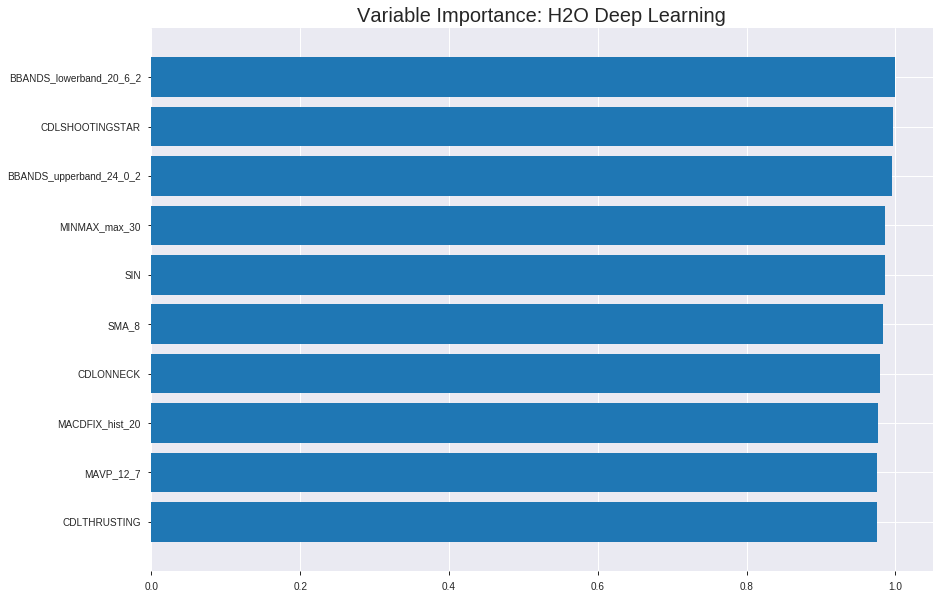

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190827_205004_model_3


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.44010766094417214
RMSE: 0.6634061055975986
LogLoss: 4.374497787733509
Mean Per-Class Error: 0.4725186759232374
AUC: 0.522430905683288
pr_auc: 0.30225800452681717
Gini: 0.044861811366575965
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.004324119002837204: 


,0,1,Error,Rate
0,11.0,849.0,0.9872,(849.0/860.0)
1,3.0,878.0,0.0034,(3.0/881.0)
Total,14.0,1727.0,0.4894,(852.0/1741.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0043241,0.6733129,394.0
max f2,0.0008025,0.8371342,398.0
max f0point5,0.3365845,0.5684864,275.0
max accuracy,0.9637823,0.5301551,62.0
max precision,0.9999040,0.5257596,1.0
max recall,0.0008025,1.0,398.0
max specificity,0.9999933,0.6093023,0.0
max absolute_mcc,0.1490344,0.0763802,330.0
max min_per_class_accuracy,0.9995778,0.5081395,3.0
max mean_per_class_accuracy,0.9637823,0.5274813,62.0


Gains/Lift Table: Avg response rate: 50.60 %, avg score: 85.94 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103389,1.0000000,1.5370160,1.5370160,0.7777778,1.0000000,0.7777778,1.0000000,0.0158910,0.0158910,53.7016017,53.7016017
,2,0.0201034,1.0000000,0.9299593,1.2421599,0.4705882,1.0000000,0.6285714,1.0000000,0.0090806,0.0249716,-7.0040729,24.2159883
,3,0.0304423,1.0000000,0.8782949,1.1185831,0.4444444,1.0000000,0.5660377,1.0000000,0.0090806,0.0340522,-12.1705133,11.8583085
,4,0.0402068,1.0000000,0.9299593,1.0727744,0.4705882,1.0000000,0.5428571,1.0000000,0.0090806,0.0431328,-7.0040729,7.2774445
,5,0.0505457,1.0000000,1.0978686,1.0779073,0.5555556,1.0000000,0.5454545,1.0000000,0.0113507,0.0544835,9.7868584,7.7907337
,6,0.1005169,1.0000000,1.0902971,1.0840668,0.5517241,1.0000000,0.5485714,1.0000000,0.0544835,0.1089671,9.0297076,8.4066807
,7,0.1504882,0.9999999,0.9312954,1.0333374,0.4712644,1.0000000,0.5229008,1.0000000,0.0465380,0.1555051,-6.8704581,3.3337377
,8,0.2004595,0.9999996,0.8631519,0.9909129,0.4367816,0.9999998,0.5014327,0.9999999,0.0431328,0.1986379,-13.6848148,-0.9087095
,9,0.3004021,0.9999959,1.1925124,1.0579843,0.6034483,0.9999984,0.5353728,0.9999994,0.1191827,0.3178207,19.2512427,5.7984257
,10,0.4003446,0.9999428,0.9653672,1.0348632,0.4885057,0.9999767,0.5236729,0.9999937,0.0964813,0.4143019,-3.4632797,3.4863213




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.46586345246161576
RMSE: 0.682541905278801
LogLoss: 15.955681552207889
Mean Per-Class Error: 0.5
AUC: 0.48920793362717135
pr_auc: 0.015966711203108646
Gini: -0.021584132745657292
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.9994599730659401: 


,0,1,Error,Rate
0,0.0,232.0,1.0,(232.0/232.0)
1,0.0,266.0,0.0,(0.0/266.0)
Total,0.0,498.0,0.4659,(232.0/498.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.9994600,0.6963351,10.0
max f2,0.9994600,0.8514725,10.0
max f0point5,0.9994600,0.5890168,10.0
max accuracy,0.9994600,0.5341365,10.0
max precision,0.9994600,0.5341365,10.0
max recall,0.9994600,1.0,10.0
max specificity,1.0000000,0.0086207,0.0
max absolute_mcc,0.9999997,0.1031327,4.0
max min_per_class_accuracy,1.0000000,0.0086207,0.0
max mean_per_class_accuracy,0.9994600,0.5,10.0


Gains/Lift Table: Avg response rate: 53.41 %, avg score: 100.00 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.9698795,1.0,0.9884183,0.9884183,0.5279503,1.0,0.5279503,1.0,0.9586466,0.9586466,-1.1581749,-1.1581749
,2,1.0,0.9994600,1.3729323,1.0,0.7333333,0.9999621,0.5341365,0.9999989,0.0413534,1.0,37.2932331,0.0



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-27 20:52:04,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-27 20:52:06,1 min 59.242 sec,533 obs/sec,0.6082711,1,1059.0,0.6634061,4.3744978,-0.7606868,0.5224309,0.3022580,1.5370160,0.4893739,0.6825419,15.9556816,-0.8721804,0.4892079,0.0159667,0.9884183,0.4658635
,2019-08-27 20:52:16,2 min 9.986 sec,545 obs/sec,3.7070649,6,6454.0,0.6632828,3.4397055,-0.7600324,0.5444500,0.5499409,1.2076554,0.4939690,0.6912891,16.0953427,-0.9204745,0.4900587,0.0219740,0.9904689,0.4658635
,2019-08-27 20:52:27,2 min 20.410 sec,553 obs/sec,6.7949454,11,11830.0,0.6143889,2.7750346,-0.5101145,0.5592271,0.5657639,1.2076554,0.4939690,0.6970883,16.2805569,-0.9528312,0.4805872,0.0337267,0.9834872,0.4658635
,2019-08-27 20:52:37,2 min 30.596 sec,561 obs/sec,9.8834003,16,17207.0,0.5517762,0.9569489,-0.2180049,0.5835428,0.5626801,1.0978686,0.4577829,0.7226200,17.6767255,-1.0985005,0.5169497,0.6294258,1.1233083,0.4658635
,2019-08-27 20:52:47,2 min 40.848 sec,565 obs/sec,12.9793222,21,22597.0,0.5637368,0.9464913,-0.2713818,0.5870668,0.5698866,1.5370160,0.4411258,0.7220310,17.6251955,-1.0950806,0.5166499,0.6200411,0.7488722,0.4658635
,2019-08-27 20:52:57,2 min 51.090 sec,569 obs/sec,16.1137277,26,28054.0,0.5300880,0.7840753,-0.1241368,0.5481944,0.5542315,1.2076554,0.4882252,0.7230072,17.5827013,-1.1007497,0.5169416,0.6281988,1.8721805,0.4658635
,2019-08-27 20:52:58,2 min 52.047 sec,568 obs/sec,16.1137277,26,28054.0,0.6634061,4.3744978,-0.7606868,0.5224309,0.3022580,1.5370160,0.4893739,0.6825419,15.9556816,-0.8721804,0.4892079,0.0159667,0.9884183,0.4658635


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BBANDS_lowerband_20_6_2,1.0,1.0,0.0010578
CDLSHOOTINGSTAR,0.9972043,0.9972043,0.0010549
BBANDS_upperband_24_0_2,0.9953826,0.9953826,0.0010529
MINMAX_max_30,0.9861326,0.9861326,0.0010431
SIN,0.9858725,0.9858725,0.0010429
---,---,---,---
BBANDS_middleband_8_0_3,0.8434514,0.8434514,0.0008922
BBANDS_middleband_24_5_4,0.8405393,0.8405393,0.0008891
BBANDS_upperband_20_3_4,0.8364064,0.8364064,0.0008848
MAVP_12_3,0.8305418,0.8305418,0.0008786



See the whole table with table.as_data_frame()


('accuracy', 0.5020080321285141)

('F1', 0.6684491978609626)

('auc', 0.5)

('logloss', 17.20003322477479)

('mean_per_class_error', 0.5)

('rmse', 0.7056854595862706)

('mse', 0.4979919678714859)

deeplearning prediction progress: |███████████████████████████████████████| 100%


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:102: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


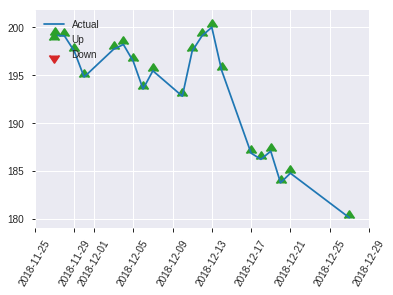


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.4979919678714859
RMSE: 0.7056854595862706
LogLoss: 17.20003322477479
Mean Per-Class Error: 0.5
AUC: 0.5
pr_auc: 0.0
Gini: 0.0
Confusion Matrix (Act/Pred) for max f1 @ threshold = 1.0: 


,0,1,Error,Rate
0,0.0,124.0,1.0,(124.0/124.0)
1,0.0,125.0,0.0,(0.0/125.0)
Total,0.0,249.0,0.498,(124.0/249.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,1.0,0.6684492,0.0
max f2,1.0,0.8344459,0.0
max f0point5,1.0,0.5575379,0.0
max accuracy,1.0,0.5020080,0.0
max precision,1.0,0.5020080,0.0
max recall,1.0,1.0,0.0
max specificity,1.0,0.0,0.0
max absolute_mcc,1.0,0.0,0.0
max min_per_class_accuracy,1.0,0.0,0.0
max mean_per_class_accuracy,1.0,0.5,0.0


Gains/Lift Table: Avg response rate: 50.20 %, avg score: 100.00 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,1.0,1.0,1.0,1.0,0.5020080,1.0,0.5020080,1.0,1.0,1.0,0.0,0.0


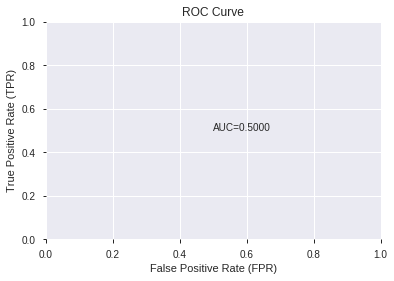

This function is available for GLM models only


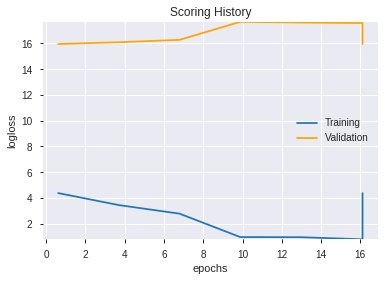

--2019-08-27 21:13:24--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 54.231.40.155
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|54.231.40.155|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


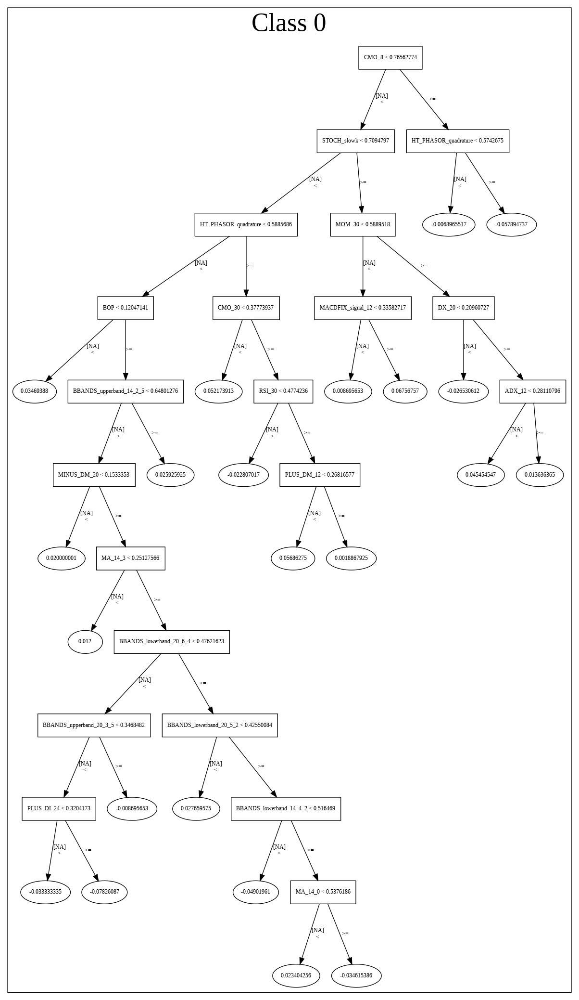

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190827_205004_model_3',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190827_205004_model_3',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_2_sid_8014',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl

In [11]:
# DeepLearning
features_list = model_train(feature_name='All',model_algo="DeepLearning")

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190827_211333_model_3,0.5,17.338743,0.5,0.708525,0.502008
1,DeepLearning_grid_1_AutoML_20190827_211333_model_1,0.5,17.338743,0.5,0.708525,0.502008
2,DeepLearning_grid_1_AutoML_20190827_211333_model_6,0.5,17.338743,0.5,0.708525,0.502008
3,DeepLearning_grid_1_AutoML_20190827_211333_model_7,0.5,17.200033,0.5,0.705685,0.497992
4,DeepLearning_grid_1_AutoML_20190827_211333_model_5,0.5,17.338743,0.5,0.708525,0.502008
5,DeepLearning_grid_1_AutoML_20190827_211333_model_8,0.5,0.694818,0.5,0.500833,0.250834
6,DeepLearning_grid_1_AutoML_20190827_211333_model_9,0.5,0.696529,0.5,0.501681,0.251684
7,DeepLearning_grid_1_AutoML_20190827_211333_model_2,0.5,17.338743,0.5,0.708525,0.502008
8,DeepLearning_1_AutoML_20190827_211333,0.5,17.338743,0.5,0.708525,0.502008
9,DeepLearning_grid_1_AutoML_20190827_211333_model_4,0.5,17.338743,0.5,0.708525,0.502008


,variable,relative_importance,scaled_importance,percentage
0,CDLONNECK,1.000000,1.000000,0.052543
1,CDLPIERCING,0.987559,0.987559,0.051889
2,SINH,0.891332,0.891332,0.046833
3,CDLTHRUSTING,0.888317,0.888317,0.046675
4,CDLSHOOTINGSTAR,0.782810,0.782810,0.041131
5,STOCHRSI_fastk,0.541658,0.541658,0.028460
6,SIN,0.496284,0.496284,0.026076
7,weekday,0.484232,0.484232,0.025443
8,BOP,0.460846,0.460846,0.024214
9,HT_DCPERIOD,0.423744,0.423744,0.022265


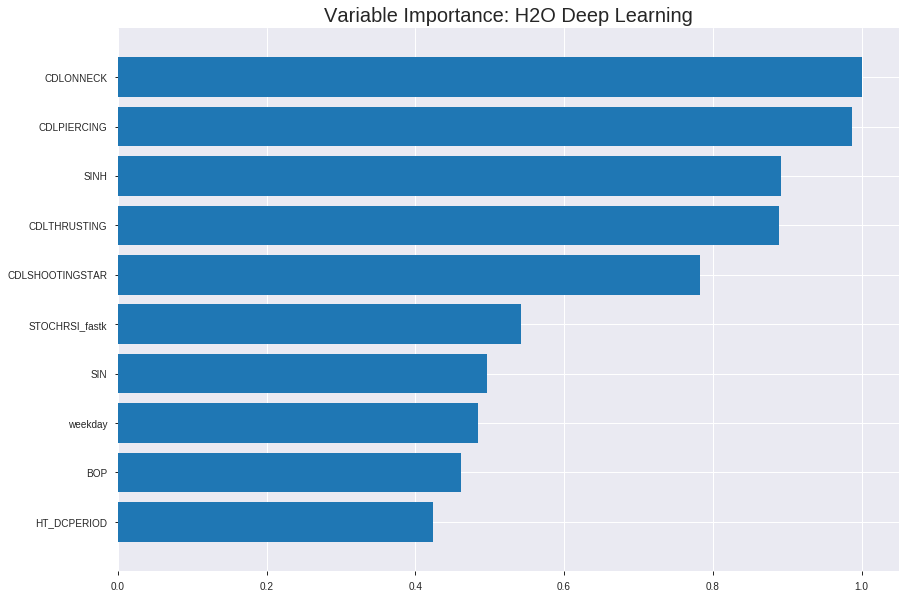

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190827_211333_model_3


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.27699681841262475
RMSE: 0.5263048721156064
LogLoss: 0.7669034447741658
Mean Per-Class Error: 0.4641039516405776
AUC: 0.525353720666262
pr_auc: 0.5109080126457342
Gini: 0.05070744133252392
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.25397289737389167: 


,0,1,Error,Rate
0,19.0,841.0,0.9779,(841.0/860.0)
1,8.0,873.0,0.0091,(8.0/881.0)
Total,27.0,1714.0,0.4877,(849.0/1741.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2539729,0.6728324,377.0
max f2,0.0123777,0.8368161,398.0
max f0point5,0.4662050,0.5727693,293.0
max accuracy,0.4689554,0.5399196,291.0
max precision,0.6498383,0.5305832,159.0
max recall,0.0123777,1.0,398.0
max specificity,0.9227066,0.9988372,0.0
max absolute_mcc,0.4662050,0.0971714,293.0
max min_per_class_accuracy,0.6141237,0.5151163,187.0
max mean_per_class_accuracy,0.4689554,0.5358960,291.0


Gains/Lift Table: Avg response rate: 50.60 %, avg score: 61.04 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103389,0.8929641,0.7685080,0.7685080,0.3888889,0.9043296,0.3888889,0.9043296,0.0079455,0.0079455,-23.1491991,-23.1491991
,2,0.0201034,0.8827465,1.0462042,0.9033890,0.5294118,0.8880761,0.4571429,0.8964350,0.0102157,0.0181612,4.6204180,-9.6610994
,3,0.0304423,0.8731166,1.2076554,1.0067248,0.6111111,0.8786863,0.5094340,0.8904072,0.0124858,0.0306470,20.7655442,0.6724777
,4,0.0402068,0.8652395,0.8137144,0.9598508,0.4117647,0.8678527,0.4857143,0.8849296,0.0079455,0.0385925,-18.6285638,-4.0149181
,5,0.0505457,0.8593588,0.9880817,0.9656253,0.5,0.8616678,0.4886364,0.8801715,0.0102157,0.0488082,-1.1918275,-3.4374678
,6,0.1005169,0.8198840,0.9085809,0.9372661,0.4597701,0.8386018,0.4742857,0.8595054,0.0454030,0.0942111,-9.1419103,-6.2733906
,7,0.1504882,0.7831494,0.9767245,0.9503687,0.4942529,0.8027825,0.4809160,0.8406699,0.0488082,0.1430193,-2.3275536,-4.9631318
,8,0.2004595,0.7526678,1.1130116,0.9909129,0.5632184,0.7672821,0.5014327,0.8223756,0.0556186,0.1986379,11.3011599,-0.9087095
,9,0.3004021,0.6942485,1.0902971,1.0239776,0.5517241,0.7197989,0.5181644,0.7882487,0.1089671,0.3076050,9.0297076,2.3977620
,10,0.4003446,0.6506577,1.1130116,1.0462042,0.5632184,0.6709065,0.5294118,0.7589552,0.1112372,0.4188422,11.3011599,4.6204180




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.5226681230292652
RMSE: 0.7229578985177942
LogLoss: 17.72333432135188
Mean Per-Class Error: 0.48446007259528134
AUC: 0.5133037334716101
pr_auc: 0.6169196289707253
Gini: 0.026607466943220137
Confusion Matrix (Act/Pred) for max f1 @ threshold = 4.994732494875603e-67: 


,0,1,Error,Rate
0,0.0,232.0,1.0,(232.0/232.0)
1,0.0,266.0,0.0,(0.0/266.0)
Total,0.0,498.0,0.4659,(232.0/498.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0000000,0.6963351,20.0
max f2,0.0000000,0.8514725,20.0
max f0point5,0.0000000,0.5890168,20.0
max accuracy,0.0000000,0.5341365,20.0
max precision,0.2576264,0.75,11.0
max recall,0.0000000,1.0,20.0
max specificity,0.9226606,0.9956897,0.0
max absolute_mcc,0.0000000,0.0809318,18.0
max min_per_class_accuracy,0.0000000,0.0526316,18.0
max mean_per_class_accuracy,0.0000000,0.5155399,18.0


Gains/Lift Table: Avg response rate: 53.41 %, avg score:  1.93 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100402,0.8750811,0.7488722,0.7488722,0.4,0.9015509,0.4,0.9015509,0.0075188,0.0075188,-25.1127820,-25.1127820
,2,0.0200803,0.5231371,1.8721805,1.3105263,1.0,0.8236975,0.7,0.8626242,0.0187970,0.0263158,87.2180451,31.0526316
,3,0.0301205,0.0002438,1.4977444,1.3729323,0.8,0.1951380,0.7333333,0.6401288,0.0150376,0.0413534,49.7744361,37.2932331
,4,0.0401606,0.0000000,1.1233083,1.3105263,0.6,0.0000005,0.7,0.4800967,0.0112782,0.0526316,12.3308271,31.0526316
,5,0.0502008,0.0000000,1.1233083,1.2730827,0.6,0.0000000,0.68,0.3840774,0.0112782,0.0639098,12.3308271,27.3082707
,6,1.0,0.0,0.9855665,1.0,0.5264271,0.0000000,0.5341365,0.0192810,0.9360902,1.0,-1.4433547,0.0



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-27 21:14:52,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-27 21:14:54,1 min 20.256 sec,6622 obs/sec,9.3233774,1,16232.0,0.5234730,0.7597906,-0.0962552,0.5244793,0.5190354,0.9880817,0.4887995,0.7258679,17.7678441,-1.1174068,0.5135387,0.6267516,0.7488722,0.4658635
,2019-08-27 21:15:00,1 min 26.137 sec,7894 obs/sec,37.3882826,4,65093.0,0.5263049,0.7669034,-0.1081485,0.5253537,0.5109080,0.7685080,0.4876508,0.7229579,17.7233343,-1.1004632,0.5133037,0.6169196,0.7488722,0.4658635
,2019-08-27 21:15:06,1 min 32.025 sec,9281 obs/sec,74.8374497,8,130292.0,0.5051880,0.7151732,-0.0210083,0.5624720,0.5432885,1.0978686,0.4847789,0.7245127,17.7454197,-1.1095075,0.5134901,0.6267203,0.7488722,0.4658635
,2019-08-27 21:15:11,1 min 37.059 sec,10293 obs/sec,112.2556002,12,195437.0,0.5009853,0.7194881,-0.0040911,0.5818349,0.5630283,1.0978686,0.4882252,0.7261379,17.7880838,-1.1189823,0.5116509,0.6185961,0.7488722,0.4658635
,2019-08-27 21:15:17,1 min 42.791 sec,11241 obs/sec,159.0384836,17,276886.0,0.5026210,0.7100501,-0.0106583,0.5935525,0.5781638,1.4272292,0.4652499,0.7254089,17.7698778,-1.1147295,0.5116995,0.6196837,1.1233083,0.4658635
,2019-08-27 21:15:22,1 min 48.314 sec,11918 obs/sec,205.8093050,22,358314.0,0.4943041,0.7074288,0.0225116,0.6367216,0.6191906,1.5370160,0.4422746,0.7262982,17.8027434,-1.1199178,0.5116509,0.6185961,0.7488722,0.4658635
,2019-08-27 21:15:23,1 min 48.405 sec,11916 obs/sec,205.8093050,22,358314.0,0.5263049,0.7669034,-0.1081485,0.5253537,0.5109080,0.7685080,0.4876508,0.7229579,17.7233343,-1.1004632,0.5133037,0.6169196,0.7488722,0.4658635


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLONNECK,1.0,1.0,0.0525426
CDLPIERCING,0.9875587,0.9875587,0.0518889
SINH,0.8913321,0.8913321,0.0468329
CDLTHRUSTING,0.8883168,0.8883168,0.0466745
CDLSHOOTINGSTAR,0.7828103,0.7828103,0.0411309
---,---,---,---
BBANDS_middleband_30_7_3,0.2695421,0.2695421,0.0141625
MAVP_8_8,0.2673503,0.2673503,0.0140473
BBANDS_middleband_14_3_3,0.2646275,0.2646275,0.0139042
BBANDS_lowerband_14_2_2,0.2624870,0.2624870,0.0137918



See the whole table with table.as_data_frame()


Could not find exact threshold 0.0; using closest threshold found 0.0.


('accuracy', 0.5020080321285141)

Could not find exact threshold 0.0; using closest threshold found 0.0.


('F1', 0.6684491978609626)

('auc', 0.5)

('logloss', 17.338743170135874)

Could not find exact threshold 0.0; using closest threshold found 0.0.


('mean_per_class_error', 0.5)

('rmse', 0.7085252515814197)

('mse', 0.5020080321285141)

deeplearning prediction progress: |███████████████████████████████████████| 100%


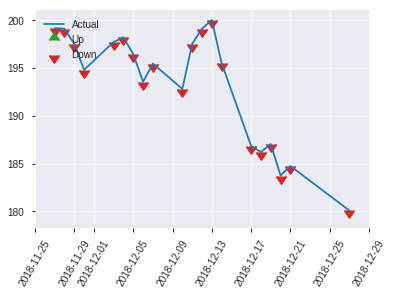


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.5020080321285141
RMSE: 0.7085252515814197
LogLoss: 17.338743170135874
Could not find exact threshold 0.0; using closest threshold found 0.0.
Mean Per-Class Error: 0.5
AUC: 0.5
pr_auc: 0.0
Gini: 0.0
Could not find exact threshold 0.0; using closest threshold found 0.0.
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.0: 


,0,1,Error,Rate
0,0.0,124.0,1.0,(124.0/124.0)
1,0.0,125.0,0.0,(0.0/125.0)
Total,0.0,249.0,0.498,(124.0/249.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0,0.6684492,0.0
max f2,0.0,0.8344459,0.0
max f0point5,0.0,0.5575379,0.0
max accuracy,0.0,0.5020080,0.0
max precision,0.0,0.5020080,0.0
max recall,0.0,1.0,0.0
max specificity,0.0,0.0,0.0
max absolute_mcc,0.0,0.0,0.0
max min_per_class_accuracy,0.0,0.0,0.0
max mean_per_class_accuracy,0.0,0.5,0.0


Gains/Lift Table: Avg response rate: 50.20 %, avg score:  0.00 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,1.0,0.0,1.0,1.0,0.5020080,0.0,0.5020080,0.0,1.0,1.0,0.0,0.0


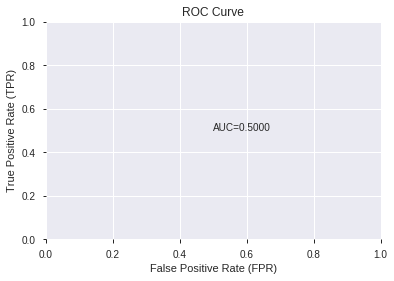

This function is available for GLM models only


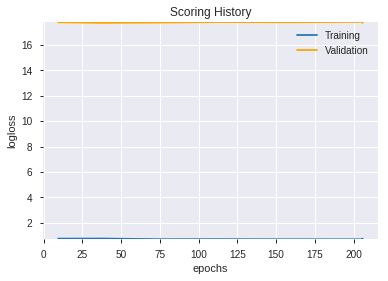

--2019-08-27 21:20:21--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 54.231.32.115
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|54.231.32.115|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


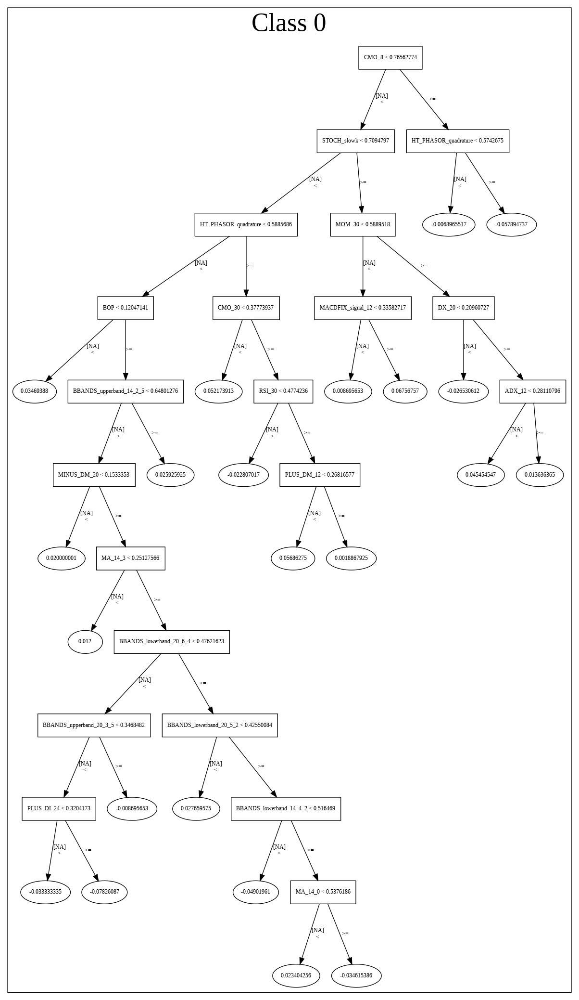

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190827_211333_model_3',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190827_211333_model_3',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_10_sid_8014',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['CDLONNECK',
 'CDLPIERCING',
 'SINH',
 'CDLTHRUSTING',
 'CDLSHOOTINGSTAR',
 'STOCHRSI_fastk',
 'SIN',
 'weekday',
 'BOP',
 'HT_DCPERIOD',
 'CORREL_12',
 'ADX_24',
 'DX_30',
 'LINEARREG_ANGLE_14',
 'WILLR_20',
 'MACDFIX_hist_20',
 'MACD',
 'BBANDS_lowerband_20_6_2',
 'TRIMA_8',
 'BBANDS_upperband_20_0_2',
 'BBANDS_upperband_8_2_3',
 'BBANDS_upperband_14_4_5',
 'BBANDS_lowerband_30_1_3',
 'BBANDS_upperband_20_2_5',
 'BBANDS_upperband_8_8_3',
 'MINMAX_max_30',
 'BBANDS_upperband_14_0_5',
 'BBANDS_middleband_14_4_5',
 'BBANDS_upperband_8_2_4',
 'BBANDS_middleband_12_3_2',
 'SMA_8',
 'BBANDS_lowerband_12_0_3',
 'MA_8_3',
 'BBANDS_upperband_24_0_2',
 'WMA_8',
 'BBANDS_middleband_14_6_2',
 'Adj Close',
 'BBANDS_middleband_8_7_4',
 'BBANDS_middleband_24_6_2',
 'MAVP_8_0',
 'BBANDS_lowerband_14_0_4',
 'MAVP_20_6',
 'BBANDS_middleband_30_6_3',
 'MAVP_12_7',
 'BBANDS_upperband_30_6_2',
 'BBANDS_middleband_30_7_3',
 'MAVP_8_8',
 'BBANDS_middleband_14_3_3',
 'BBANDS_lowerband_14_2_2',
 'BBANDS_mid

In [12]:
# DeepLearning with top DeepLearning features
model_train(feature_name='DLF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190827_212027_model_1,0.5,17.338743,0.5,0.708525,0.502008


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.008132,1.000000,0.061971
1,SINH,0.007245,0.890910,0.055211
2,HT_DCPERIOD,0.007106,0.873780,0.054149
3,CDLTHRUSTING,0.005891,0.724361,0.044889
4,MACDFIX_hist_20,0.005479,0.673725,0.041751
5,WILLR_20,0.005478,0.673640,0.041746
6,SIN,0.005409,0.665078,0.041216
7,CDLONNECK,0.005225,0.642470,0.039815
8,LINEARREG_ANGLE_14,0.004885,0.600654,0.037223
9,CDLSHOOTINGSTAR,0.004775,0.587177,0.036388


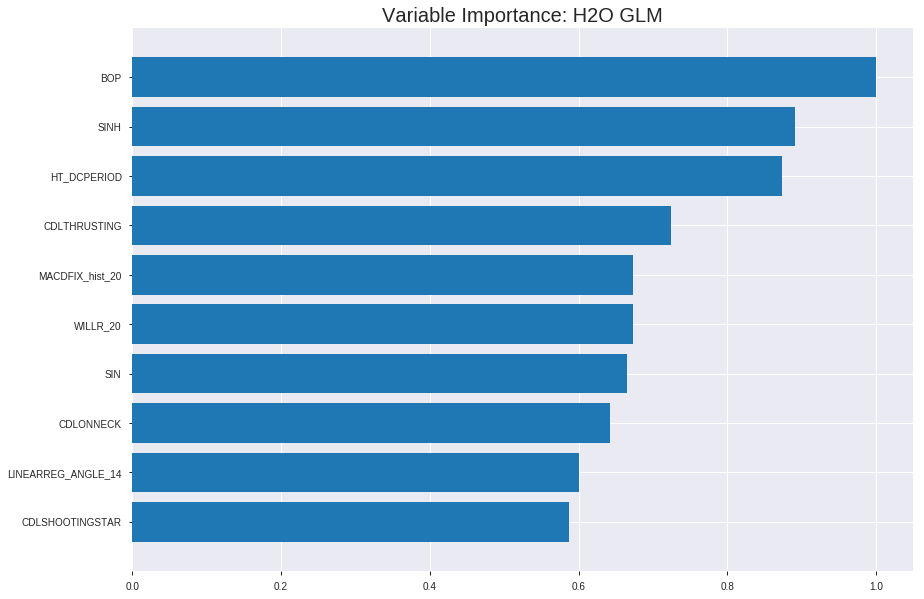

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190827_212027_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.24930124262299372
RMSE: 0.4993007536775743
LogLoss: 0.6917480523950881
Null degrees of freedom: 1740
Residual degrees of freedom: 1690
Null deviance: 2413.285173867487
Residual deviance: 2408.6667184396965
AIC: 2510.6667184396965
AUC: 0.5316322624924109
pr_auc: 0.5366357087816326
Gini: 0.06326452498482182
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4778405855669704: 


,0,1,Error,Rate
0,18.0,842.0,0.9791,(842.0/860.0)
1,8.0,873.0,0.0091,(8.0/881.0)
Total,26.0,1715.0,0.4882,(850.0/1741.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4778406,0.6725732,380.0
max f2,0.4520294,0.8368161,398.0
max f0point5,0.4833204,0.5644623,359.0
max accuracy,0.4978318,0.5295807,262.0
max precision,0.5404312,0.8,3.0
max recall,0.4520294,1.0,398.0
max specificity,0.5443664,0.9988372,0.0
max absolute_mcc,0.4957191,0.0610030,278.0
max min_per_class_accuracy,0.5065241,0.5220930,198.0
max mean_per_class_accuracy,0.4978318,0.5272325,262.0


Gains/Lift Table: Avg response rate: 50.60 %, avg score: 50.60 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103389,0.5359641,1.3174423,1.3174423,0.6666667,0.5392188,0.6666667,0.5392188,0.0136209,0.0136209,31.7442300,31.7442300
,2,0.0201034,0.5315419,1.2786940,1.2986217,0.6470588,0.5332286,0.6571429,0.5363093,0.0124858,0.0261067,27.8693997,29.8621696
,3,0.0304423,0.5304506,1.0978686,1.2304414,0.5555556,0.5309228,0.6226415,0.5344799,0.0113507,0.0374574,9.7868584,23.0441394
,4,0.0402068,0.5295555,1.3949389,1.2703908,0.7058824,0.5299471,0.6428571,0.5333791,0.0136209,0.0510783,39.4938906,27.0390790
,5,0.0505457,0.5284788,0.8782949,1.1901894,0.4444444,0.5289906,0.6022727,0.5324814,0.0090806,0.0601589,-12.1705133,19.0189351
,6,0.1005169,0.5240394,1.0675826,1.1292363,0.5402299,0.5261972,0.5714286,0.5293572,0.0533485,0.1135074,6.7582554,12.9236257
,7,0.1504882,0.5213107,0.9085809,1.0559652,0.4597701,0.5225158,0.5343511,0.5270855,0.0454030,0.1589103,-9.1419103,5.5965203
,8,0.2004595,0.5190822,1.0675826,1.0588612,0.5402299,0.5202401,0.5358166,0.5253790,0.0533485,0.2122588,6.7582554,5.8861219
,9,0.3004021,0.5149828,1.0675826,1.0617628,0.5402299,0.5171625,0.5372849,0.5226454,0.1066969,0.3189557,6.7582554,6.1762772
,10,0.4003446,0.5107148,1.0221535,1.0518747,0.5172414,0.5127359,0.5322812,0.5201716,0.1021566,0.4211124,2.2153509,5.1874663




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.5179007298243433
RMSE: 0.7196532010797585
LogLoss: 17.27367503244317
Null degrees of freedom: 497
Residual degrees of freedom: 447
Null deviance: 689.626794400202
Residual deviance: 343285.8330854662
AIC: 343387.8330854662
AUC: 0.5139519056261344
pr_auc: 0.5901643381640145
Gini: 0.027903811252268707
Confusion Matrix (Act/Pred) for max f1 @ threshold = 1.8741413835458242e-68: 


,0,1,Error,Rate
0,0.0,232.0,1.0,(232.0/232.0)
1,0.0,266.0,0.0,(0.0/266.0)
Total,0.0,498.0,0.4659,(232.0/498.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0000000,0.6963351,35.0
max f2,0.0000000,0.8514725,35.0
max f0point5,0.0000000,0.5890168,35.0
max accuracy,0.0000000,0.5341365,35.0
max precision,0.4938993,1.0,0.0
max recall,0.0000000,1.0,35.0
max specificity,0.4938993,1.0,0.0
max absolute_mcc,0.0022368,0.0904279,22.0
max min_per_class_accuracy,0.0000000,0.0827068,34.0
max mean_per_class_accuracy,0.0000000,0.5200771,29.0


Gains/Lift Table: Avg response rate: 53.41 %, avg score:  1.67 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100402,0.4872862,1.4977444,1.4977444,0.8,0.4916068,0.8,0.4916068,0.0150376,0.0150376,49.7744361,49.7744361
,2,0.0200803,0.4647384,1.1233083,1.3105263,0.6,0.4779360,0.7,0.4847714,0.0112782,0.0263158,12.3308271,31.0526316
,3,0.0301205,0.3906213,1.4977444,1.3729323,0.8,0.4517658,0.7333333,0.4737695,0.0150376,0.0413534,49.7744361,37.2932331
,4,0.0401606,0.0434083,1.1233083,1.3105263,0.6,0.2357727,0.7,0.4142703,0.0112782,0.0526316,12.3308271,31.0526316
,5,0.0502008,0.0000095,1.1233083,1.2730827,0.6,0.0093985,0.68,0.3332960,0.0112782,0.0639098,12.3308271,27.3082707
,6,1.0,0.0,0.9855665,1.0,0.5264271,0.0000000,0.5341365,0.0167317,0.9360902,1.0,-1.4433547,0.0



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-27 21:20:28,0.000 sec,2,.17E1,51,1.3834961,689.3289821
,2019-08-27 21:20:28,0.011 sec,4,.11E1,51,1.3827552,691.7662428
,2019-08-27 21:20:28,0.022 sec,6,.67E0,51,1.3818527,693.2095326
,2019-08-27 21:20:28,0.033 sec,8,.42E0,51,1.3808385,695.0688071
,2019-08-27 21:20:28,0.043 sec,10,.26E0,51,1.3798053,697.2711742


Could not find exact threshold 0.0; using closest threshold found 0.0.


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5020080321285141)

Could not find exact threshold 0.0; using closest threshold found 0.0.


('F1', 0.6684491978609626)

('auc', 0.5)

('logloss', 17.338743170135874)

Could not find exact threshold 0.0; using closest threshold found 0.0.


('mean_per_class_error', 0.5)

('rmse', 0.7085252515814197)

('mse', 0.5020080321285141)

glm prediction progress: |████████████████████████████████████████████████| 100%


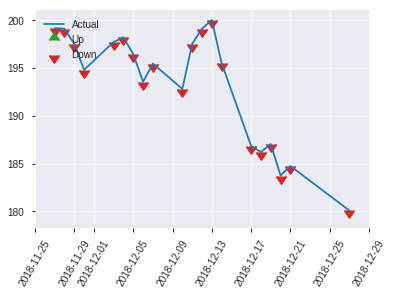


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.5020080321285141
RMSE: 0.7085252515814197
LogLoss: 17.338743170135874
Null degrees of freedom: 248
Residual degrees of freedom: 198
Null deviance: 345.1994009871195
Residual deviance: 177099.10463306593
AIC: 177201.10463306593
AUC: 0.5
pr_auc: 0.0
Gini: 0.0
Could not find exact threshold 0.0; using closest threshold found 0.0.
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.0: 


,0,1,Error,Rate
0,0.0,124.0,1.0,(124.0/124.0)
1,0.0,125.0,0.0,(0.0/125.0)
Total,0.0,249.0,0.498,(124.0/249.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0,0.6684492,0.0
max f2,0.0,0.8344459,0.0
max f0point5,0.0,0.5575379,0.0
max accuracy,0.0,0.5020080,0.0
max precision,0.0,0.5020080,0.0
max recall,0.0,1.0,0.0
max specificity,0.0,0.0,0.0
max absolute_mcc,0.0,0.0,0.0
max min_per_class_accuracy,0.0,0.0,0.0
max mean_per_class_accuracy,0.0,0.5,0.0


Gains/Lift Table: Avg response rate: 50.20 %, avg score:  0.00 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,1.0,0.0,1.0,1.0,0.5020080,0.0,0.5020080,0.0,1.0,1.0,0.0,0.0


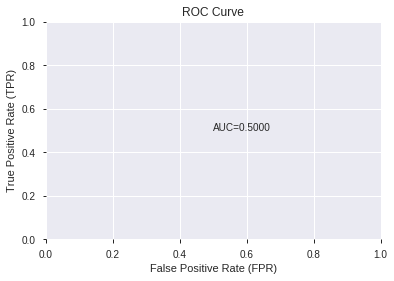

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


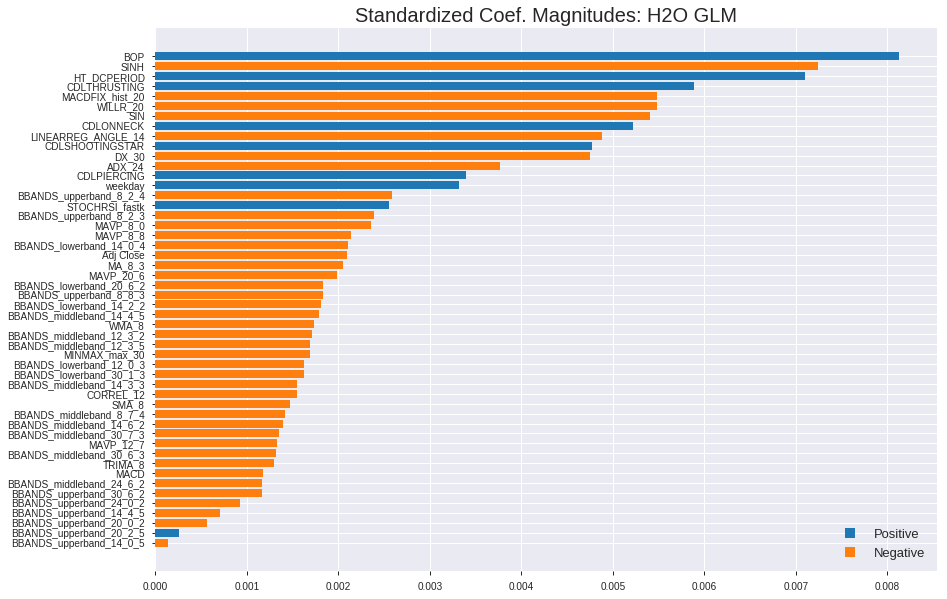

'log_likelihood'
--2019-08-27 21:20:33--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.171.75
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.171.75|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


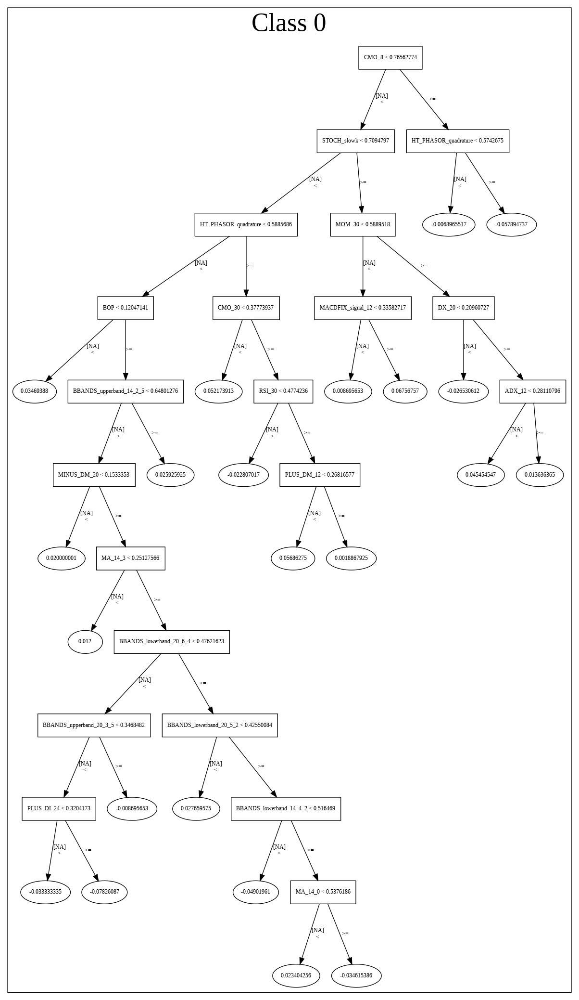

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190827_212027_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190827_212027_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_18_sid_8014',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_18_s

['BOP',
 'SINH',
 'HT_DCPERIOD',
 'CDLTHRUSTING',
 'MACDFIX_hist_20',
 'WILLR_20',
 'SIN',
 'CDLONNECK',
 'LINEARREG_ANGLE_14',
 'CDLSHOOTINGSTAR',
 'DX_30',
 'ADX_24',
 'CDLPIERCING',
 'weekday',
 'BBANDS_upperband_8_2_4',
 'STOCHRSI_fastk',
 'BBANDS_upperband_8_2_3',
 'MAVP_8_0',
 'MAVP_8_8',
 'BBANDS_lowerband_14_0_4',
 'Adj Close',
 'MA_8_3',
 'MAVP_20_6',
 'BBANDS_lowerband_20_6_2',
 'BBANDS_upperband_8_8_3',
 'BBANDS_lowerband_14_2_2',
 'BBANDS_middleband_14_4_5',
 'WMA_8',
 'BBANDS_middleband_12_3_2',
 'BBANDS_middleband_12_3_5',
 'MINMAX_max_30',
 'BBANDS_lowerband_12_0_3',
 'BBANDS_lowerband_30_1_3',
 'BBANDS_middleband_14_3_3',
 'CORREL_12',
 'SMA_8',
 'BBANDS_middleband_8_7_4',
 'BBANDS_middleband_14_6_2',
 'BBANDS_middleband_30_7_3',
 'MAVP_12_7',
 'BBANDS_middleband_30_6_3',
 'TRIMA_8',
 'MACD',
 'BBANDS_middleband_24_6_2',
 'BBANDS_upperband_30_6_2',
 'BBANDS_upperband_24_0_2',
 'BBANDS_upperband_14_4_5',
 'BBANDS_upperband_20_0_2',
 'BBANDS_upperband_20_2_5',
 'BBANDS_up

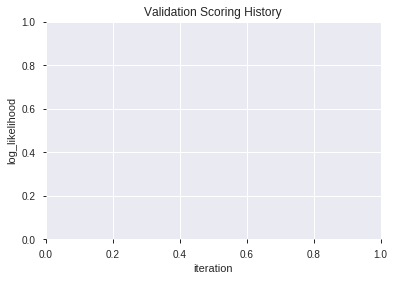

In [13]:
# GLM with top DeepLearning features
model_train(feature_name='DLF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_1_AutoML_20190827_212039,0.525226,0.721621,0.487903,0.513326,0.263503
1,XGBoost_grid_1_AutoML_20190827_212039_model_1,0.508742,0.764573,0.495968,0.531472,0.282462
2,XGBoost_grid_1_AutoML_20190827_212039_model_2,0.508065,0.698103,0.491935,0.502448,0.252454
3,XGBoost_grid_1_AutoML_20190827_212039_model_6,0.507290,0.740825,0.495968,0.521740,0.272212
4,XGBoost_grid_1_AutoML_20190827_212039_model_5,0.506645,0.782109,0.500000,0.537551,0.288961
5,XGBoost_2_AutoML_20190827_212039,0.501484,0.711522,0.495935,0.508790,0.258867
6,XGBoost_grid_1_AutoML_20190827_212039_model_3,0.488581,0.714618,0.495968,0.510166,0.260269
7,XGBoost_grid_1_AutoML_20190827_212039_model_4,0.484258,0.701465,0.475774,0.504104,0.254121
8,XGBoost_3_AutoML_20190827_212039,0.483935,0.733802,0.500000,0.518629,0.268976
9,XGBoost_grid_1_AutoML_20190827_212039_model_7,0.471935,0.775632,0.500000,0.536111,0.287415


,variable,relative_importance,scaled_importance,percentage
0,HT_DCPERIOD,467.513184,1.000000,0.074531
1,CORREL_12,436.839264,0.934389,0.069641
2,SIN,424.157745,0.907264,0.067619
3,MACDFIX_hist_20,413.997955,0.885532,0.065999
4,BOP,395.103210,0.845117,0.062987
5,WILLR_20,381.656097,0.816354,0.060843
6,DX_30,350.292694,0.749268,0.055844
7,LINEARREG_ANGLE_14,331.115204,0.708248,0.052786
8,STOCHRSI_fastk,314.436005,0.672571,0.050127
9,MACD,283.317230,0.606009,0.045166


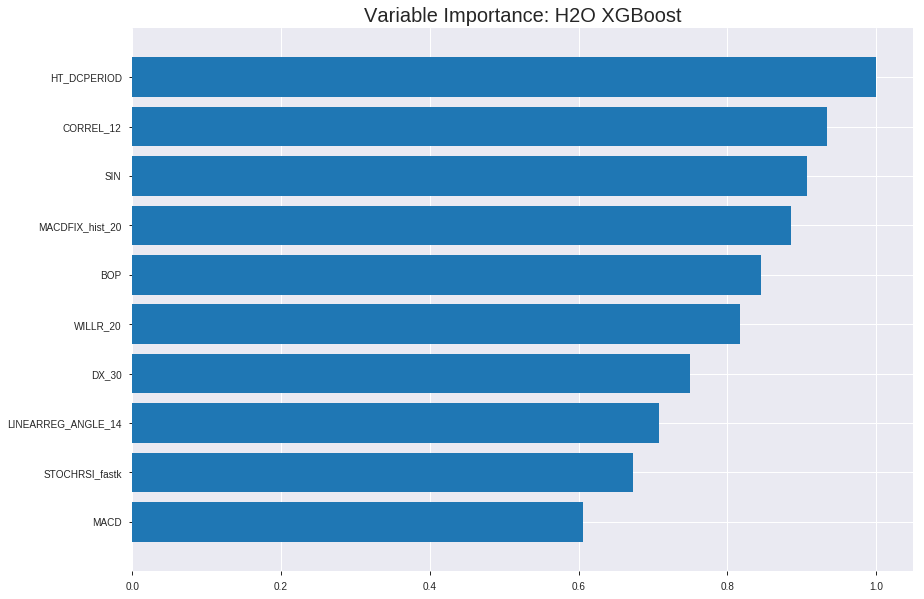

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_1_AutoML_20190827_212039


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.17069130504177446
RMSE: 0.41314804252443754
LogLoss: 0.5289466943655724
Mean Per-Class Error: 0.129067787662012
AUC: 0.94211981627643
pr_auc: 0.9408111887323011
Gini: 0.8842396325528601
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4918169130881627: 


,0,1,Error,Rate
0,717.0,143.0,0.1663,(143.0/860.0)
1,87.0,794.0,0.0988,(87.0/881.0)
Total,804.0,937.0,0.1321,(230.0/1741.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4918169,0.8734873,210.0
max f2,0.4399316,0.9171471,252.0
max f0point5,0.5387077,0.8863223,170.0
max accuracy,0.5099789,0.8707639,195.0
max precision,0.8092169,1.0,0.0
max recall,0.2984940,1.0,360.0
max specificity,0.8092169,1.0,0.0
max absolute_mcc,0.5099789,0.7419437,195.0
max min_per_class_accuracy,0.5071499,0.8671964,198.0
max mean_per_class_accuracy,0.5099789,0.8709322,195.0


Gains/Lift Table: Avg response rate: 50.60 %, avg score: 50.40 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103389,0.7495232,1.9761635,1.9761635,1.0,0.7735041,1.0,0.7735041,0.0204313,0.0204313,97.6163451,97.6163451
,2,0.0201034,0.7349508,1.9761635,1.9761635,1.0,0.7410185,1.0,0.7577254,0.0192963,0.0397276,97.6163451,97.6163451
,3,0.0304423,0.7242276,1.9761635,1.9761635,1.0,0.7292916,1.0,0.7480686,0.0204313,0.0601589,97.6163451,97.6163451
,4,0.0402068,0.7121892,1.9761635,1.9761635,1.0,0.7164218,1.0,0.7403830,0.0192963,0.0794552,97.6163451,97.6163451
,5,0.0505457,0.7020588,1.9761635,1.9761635,1.0,0.7078185,1.0,0.7337221,0.0204313,0.0998865,97.6163451,97.6163451
,6,0.1005169,0.6691208,1.9307344,1.9535787,0.9770115,0.6843410,0.9885714,0.7091726,0.0964813,0.1963678,93.0734406,95.3578725
,7,0.1504882,0.6450418,1.9307344,1.9459930,0.9770115,0.6565999,0.9847328,0.6917153,0.0964813,0.2928490,93.0734406,94.5993016
,8,0.2004595,0.6251515,1.8853054,1.9308646,0.9540230,0.6359794,0.9770774,0.6778212,0.0942111,0.3870602,88.5305361,93.0864575
,9,0.3004021,0.5858297,1.8398763,1.9005931,0.9310345,0.6057794,0.9617591,0.6538532,0.1838820,0.5709421,83.9876316,90.0593147
,10,0.4003446,0.5497437,1.6354456,1.8344014,0.8275862,0.5662886,0.9282640,0.6319934,0.1634506,0.7343927,63.5445614,83.4401367




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.27566027867628784
RMSE: 0.5250335976642713
LogLoss: 0.7475745039290512
Mean Per-Class Error: 0.44226406533575313
AUC: 0.5300508815141302
pr_auc: 0.5605899064247039
Gini: 0.06010176302826031
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2736492455005646: 


,0,1,Error,Rate
0,10.0,222.0,0.9569,(222.0/232.0)
1,3.0,263.0,0.0113,(3.0/266.0)
Total,13.0,485.0,0.4518,(225.0/498.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2736492,0.7003995,387.0
max f2,0.2385670,0.8520179,398.0
max f0point5,0.2736492,0.5961015,387.0
max accuracy,0.3740831,0.5522088,184.0
max precision,0.5289281,0.875,7.0
max recall,0.2385670,1.0,398.0
max specificity,0.5611503,0.9956897,0.0
max absolute_mcc,0.3856974,0.1179043,161.0
max min_per_class_accuracy,0.3660684,0.5301724,203.0
max mean_per_class_accuracy,0.3856974,0.5577359,161.0


Gains/Lift Table: Avg response rate: 53.41 %, avg score: 37.28 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100402,0.5405846,1.4977444,1.4977444,0.8,0.5485030,0.8,0.5485030,0.0150376,0.0150376,49.7744361,49.7744361
,2,0.0200803,0.5247393,1.1233083,1.3105263,0.6,0.5316408,0.7,0.5400719,0.0112782,0.0263158,12.3308271,31.0526316
,3,0.0301205,0.5108092,0.3744361,0.9984962,0.2,0.5218857,0.5333333,0.5340098,0.0037594,0.0300752,-62.5563910,-0.1503759
,4,0.0401606,0.5030119,0.3744361,0.8424812,0.2,0.5066153,0.45,0.5271612,0.0037594,0.0338346,-62.5563910,-15.7518797
,5,0.0502008,0.4939577,1.8721805,1.0484211,1.0,0.4976555,0.56,0.5212601,0.0187970,0.0526316,87.2180451,4.8421053
,6,0.1004016,0.4632738,0.9735338,1.0109774,0.52,0.4772261,0.54,0.4992431,0.0488722,0.1015038,-2.6466165,1.0977444
,7,0.1506024,0.4471279,1.2730827,1.0983459,0.68,0.4548518,0.5866667,0.4844460,0.0639098,0.1654135,27.3082707,9.8345865
,8,0.2008032,0.4251012,0.8986466,1.0484211,0.48,0.4371065,0.56,0.4726111,0.0451128,0.2105263,-10.1353383,4.8421053
,9,0.3012048,0.4004412,1.1607519,1.0858647,0.62,0.4114044,0.58,0.4522089,0.1165414,0.3270677,16.0751880,8.5864662
,10,0.3995984,0.3843637,1.2226485,1.1195451,0.6530612,0.3924231,0.5979899,0.4374878,0.1203008,0.4473684,22.2648458,11.9545094



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-27 21:20:39,0.004 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4939690,0.5,0.6931472,0.5,0.0,1.0,0.4658635
,2019-08-27 21:20:40,0.159 sec,5.0,0.4892684,0.6718733,0.7610485,0.7558492,1.9761635,0.3469271,0.5001045,0.6933570,0.4986226,0.5352578,0.6240602,0.4658635
,2019-08-27 21:20:40,0.248 sec,10.0,0.4788465,0.6515363,0.8191649,0.8220956,1.9761635,0.2665135,0.5035047,0.7002243,0.5014260,0.5588196,1.4977444,0.4658635
,2019-08-27 21:20:40,0.339 sec,15.0,0.4679200,0.6305236,0.8623664,0.8670895,1.9761635,0.2263067,0.5097865,0.7132066,0.5184810,0.5635245,1.4977444,0.4658635
,2019-08-27 21:20:40,0.428 sec,20.0,0.4589297,0.6134509,0.8846382,0.8878655,1.9761635,0.2016083,0.5111891,0.7161770,0.5302777,0.5631423,1.4977444,0.4477912
,2019-08-27 21:20:40,0.527 sec,25.0,0.4496487,0.5959994,0.9040929,0.9059934,1.9761635,0.1860999,0.5142298,0.7227391,0.5279686,0.5666268,1.4977444,0.4638554
,2019-08-27 21:20:40,0.609 sec,30.0,0.4431804,0.5839082,0.9097339,0.9118530,1.9761635,0.1746123,0.5162422,0.7271820,0.5227265,0.5663424,1.4977444,0.4658635
,2019-08-27 21:20:40,0.716 sec,35.0,0.4338355,0.5665636,0.9202657,0.9224673,1.9761635,0.1671453,0.5158046,0.7263064,0.5328218,0.5637464,1.1233083,0.4357430
,2019-08-27 21:20:40,0.801 sec,40.0,0.4273357,0.5545747,0.9258421,0.9270590,1.9761635,0.1522114,0.5195271,0.7346560,0.5242740,0.5537699,1.4977444,0.4598394
,2019-08-27 21:20:40,0.898 sec,45.0,0.4206190,0.5423459,0.9338193,0.9322375,1.9761635,0.1458932,0.5211294,0.7383219,0.5269640,0.5565931,1.4977444,0.4518072


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
HT_DCPERIOD,467.5131836,1.0,0.0745308
CORREL_12,436.8392639,0.9343892,0.0696408
SIN,424.1577454,0.9072637,0.0676191
MACDFIX_hist_20,413.9979553,0.8855322,0.0659994
BOP,395.1032104,0.8451167,0.0629872
---,---,---,---
BBANDS_middleband_14_4_5,30.8120747,0.0659063,0.0049120
WMA_8,27.2480659,0.0582830,0.0043439
BBANDS_lowerband_14_2_2,23.5244865,0.0503183,0.0037503
MAVP_12_7,3.0572522,0.0065394,0.0004874



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5502008032128514)

('F1', 0.6738544474393531)

('auc', 0.5252258064516129)

('logloss', 0.7216208175610663)

('mean_per_class_error', 0.4499354838709677)

('rmse', 0.5133255719824298)

('mse', 0.26350314285108867)

xgboost prediction progress: |████████████████████████████████████████████| 100%


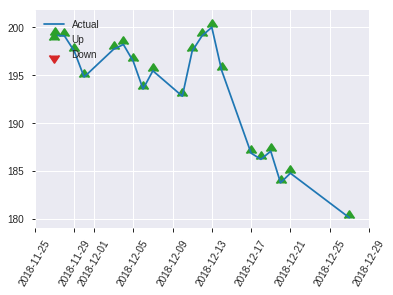


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.26350314285108867
RMSE: 0.5133255719824298
LogLoss: 0.7216208175610663
Mean Per-Class Error: 0.4499354838709677
AUC: 0.5252258064516129
pr_auc: 0.5269406483979644
Gini: 0.05045161290322575
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.26044565439224243: 


,0,1,Error,Rate
0,3.0,121.0,0.9758,(121.0/124.0)
1,0.0,125.0,0.0,(0.0/125.0)
Total,3.0,246.0,0.4859,(121.0/249.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2604457,0.6738544,245.0
max f2,0.2604457,0.8378016,245.0
max f0point5,0.3591175,0.5642257,176.0
max accuracy,0.3857927,0.5502008,132.0
max precision,0.5101424,1.0,0.0
max recall,0.2604457,1.0,245.0
max specificity,0.5101424,1.0,0.0
max absolute_mcc,0.4712377,0.1171371,14.0
max min_per_class_accuracy,0.3922455,0.544,123.0
max mean_per_class_accuracy,0.3857927,0.5500645,132.0


Gains/Lift Table: Avg response rate: 50.20 %, avg score: 38.58 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0120482,0.4964655,1.3280000,1.3280000,0.6666667,0.5026522,0.6666667,0.5026522,0.016,0.016,32.8000000,32.8000000
,2,0.0200803,0.4859640,1.992,1.5936,1.0,0.4910424,0.8,0.4980083,0.016,0.032,99.2,59.3600000
,3,0.0321285,0.4830400,0.6640000,1.2450000,0.3333333,0.4844987,0.625,0.4929422,0.008,0.04,-33.6000000,24.5000000
,4,0.0401606,0.4776829,0.996,1.1952000,0.5,0.4814156,0.6,0.4906369,0.008,0.048,-0.4000000,19.5200000
,5,0.0522088,0.4752209,1.992,1.3790769,1.0,0.4769738,0.6923077,0.4874839,0.024,0.072,99.2,37.9076923
,6,0.1004016,0.4557168,0.83,1.11552,0.4166667,0.4648549,0.56,0.4766220,0.04,0.112,-17.0000000,11.5520000
,7,0.1526104,0.4399494,0.6129231,0.9435789,0.3076923,0.4470447,0.4736842,0.4665034,0.032,0.144,-38.7076923,-5.6421053
,8,0.2008032,0.4308003,0.996,0.9561600,0.5,0.4343537,0.48,0.4587875,0.048,0.192,-0.4000000,-4.3840000
,9,0.3012048,0.4169312,1.03584,0.9827200,0.52,0.4240939,0.4933333,0.4472229,0.104,0.296,3.5840000,-1.7280000
,10,0.4016064,0.4025732,1.03584,0.996,0.52,0.4098391,0.5,0.4378770,0.104,0.4,3.5840000,-0.4000000


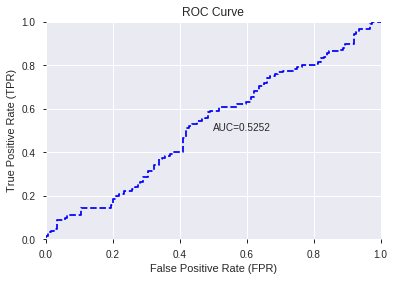

This function is available for GLM models only


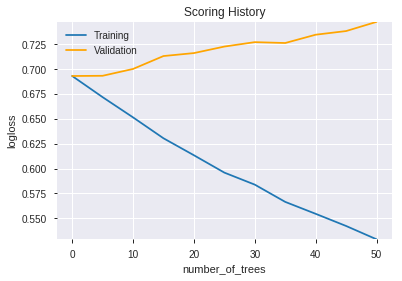

--2019-08-27 21:20:57--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.94.3
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.94.3|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.indexOf(String.java:1578)
	at java.base/java.lang.String.indexOf(String.java:1535)
	at java.base/java.lang.String.split(String.java:2274)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:

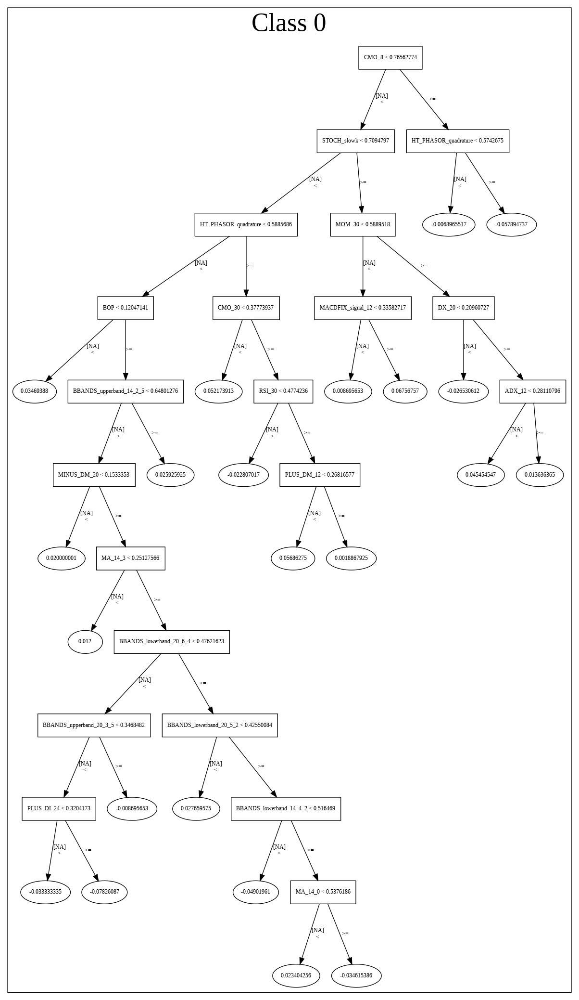

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_1_AutoML_20190827_212039',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_1_AutoML_20190827_212039',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_26_sid_8014',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_26_sid_8014',
   'type

['HT_DCPERIOD',
 'CORREL_12',
 'SIN',
 'MACDFIX_hist_20',
 'BOP',
 'WILLR_20',
 'DX_30',
 'LINEARREG_ANGLE_14',
 'STOCHRSI_fastk',
 'MACD',
 'ADX_24',
 'BBANDS_lowerband_30_1_3',
 'BBANDS_upperband_14_4_5',
 'weekday',
 'BBANDS_lowerband_14_0_4',
 'BBANDS_upperband_14_0_5',
 'BBANDS_upperband_8_2_4',
 'BBANDS_upperband_20_2_5',
 'BBANDS_upperband_30_6_2',
 'AdjClose',
 'BBANDS_middleband_14_6_2',
 'BBANDS_middleband_30_6_3',
 'BBANDS_upperband_24_0_2',
 'BBANDS_lowerband_12_0_3',
 'TRIMA_8',
 'MAVP_8_0',
 'BBANDS_lowerband_20_6_2',
 'BBANDS_upperband_8_2_3',
 'BBANDS_middleband_24_6_2',
 'MA_8_3',
 'BBANDS_upperband_8_8_3',
 'BBANDS_upperband_20_0_2',
 'BBANDS_middleband_8_7_4',
 'MAVP_20_6',
 'MINMAX_max_30',
 'BBANDS_middleband_14_3_3',
 'MAVP_8_8',
 'BBANDS_middleband_12_3_2',
 'SMA_8',
 'BBANDS_middleband_14_4_5',
 'WMA_8',
 'BBANDS_lowerband_14_2_2',
 'MAVP_12_7',
 'BBANDS_middleband_12_3_5']

In [14]:
# XGBoost with top DeepLearning features
model_train(feature_name='DLF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190827_212103_model_1,0.5,17.338743,0.5,0.708525,0.502008


,variable,relative_importance,scaled_importance,percentage
0,CDLSEPARATINGLINES,9.161442e-03,1.000000,1.310897e-02
1,CDLSHORTLINE,7.963941e-03,0.869289,1.139549e-02
2,CDLBELTHOLD,7.020694e-03,0.766331,1.004581e-02
3,CDLTASUKIGAP,6.811791e-03,0.743528,9.746893e-03
4,days_in_month,6.717513e-03,0.733237,9.611991e-03
5,COS,6.680404e-03,0.729187,9.558893e-03
6,CDLHIKKAKE,6.210018e-03,0.677843,8.885824e-03
7,BOP,5.641127e-03,0.615747,8.071806e-03
8,CDL3LINESTRIKE,5.500887e-03,0.600439,7.871139e-03
9,HT_PHASOR_inphase,5.266335e-03,0.574837,7.535522e-03


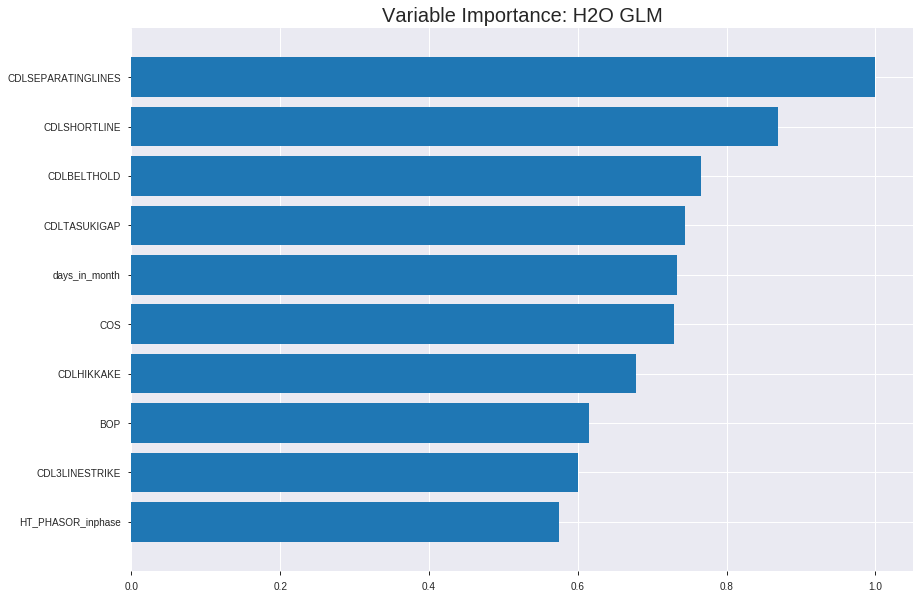

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190827_212103_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.24682373218184134
RMSE: 0.4968135789024303
LogLoss: 0.6867762883841955
Null degrees of freedom: 1740
Residual degrees of freedom: 703
Null deviance: 2413.285173867487
Residual deviance: 2391.355036153768
AIC: 4467.355036153768
AUC: 0.5828841432832669
pr_auc: 0.5825040040722278
Gini: 0.16576828656653375
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.45438143930714797: 


,0,1,Error,Rate
0,30.0,830.0,0.9651,(830.0/860.0)
1,12.0,869.0,0.0136,(12.0/881.0)
Total,42.0,1699.0,0.4836,(842.0/1741.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4543814,0.6736434,369.0
max f2,0.4068883,0.8368161,398.0
max f0point5,0.4841966,0.5767762,294.0
max accuracy,0.5053325,0.5680643,203.0
max precision,0.5884823,1.0,0.0
max recall,0.4068883,1.0,398.0
max specificity,0.5884823,1.0,0.0
max absolute_mcc,0.5053325,0.1361317,203.0
max min_per_class_accuracy,0.5053325,0.5675369,203.0
max mean_per_class_accuracy,0.5053325,0.5680708,203.0


Gains/Lift Table: Avg response rate: 50.60 %, avg score: 50.60 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103389,0.5667645,1.4272292,1.4272292,0.7222222,0.5745857,0.7222222,0.5745857,0.0147560,0.0147560,42.7229159,42.7229159
,2,0.0201034,0.5605820,1.3949389,1.4115453,0.7058824,0.5639196,0.7142857,0.5694051,0.0136209,0.0283768,39.4938906,41.1545322
,3,0.0304423,0.5555822,1.0978686,1.3050136,0.5555556,0.5584156,0.6603774,0.5656728,0.0113507,0.0397276,9.7868584,30.5013599
,4,0.0402068,0.5523725,1.5111838,1.3550835,0.7647059,0.5538109,0.6857143,0.5627921,0.0147560,0.0544835,51.1183815,35.5083509
,5,0.0505457,0.5481086,1.0978686,1.3024714,0.5555556,0.5497416,0.6590909,0.5601226,0.0113507,0.0658343,9.7868584,30.2471365
,6,0.1005169,0.5400202,1.2492987,1.2760370,0.6321839,0.5438130,0.6457143,0.5520144,0.0624291,0.1282633,24.9298733,27.6036971
,7,0.1504882,0.5341554,1.0675826,1.2068174,0.5402299,0.5365737,0.6106870,0.5468872,0.0533485,0.1816118,6.7582554,20.6817374
,8,0.2004595,0.5275717,1.2720133,1.2230696,0.6436782,0.5304805,0.6189112,0.5427973,0.0635641,0.2451759,27.2013256,22.3069643
,9,0.3004021,0.5194021,1.1243689,1.1902323,0.5689655,0.5229221,0.6022945,0.5361849,0.1123723,0.3575482,12.4368860,19.0232289
,10,0.4003446,0.5114921,1.0221535,1.1482729,0.5172414,0.5152781,0.5810617,0.5309657,0.1021566,0.4597049,2.2153509,14.8272880




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.518812302647738
RMSE: 0.7202862643753093
LogLoss: 17.304698285505637
Null degrees of freedom: 497
Residual degrees of freedom: -540
Null deviance: 689.626794400202
Residual deviance: 344342.1292087975
AIC: 346418.1292087975
AUC: 0.5120641042260824
pr_auc: 0.5821002141420386
Gini: 0.02412820845216479
Confusion Matrix (Act/Pred) for max f1 @ threshold = 2.1780733000425373e-60: 


,0,1,Error,Rate
0,0.0,232.0,1.0,(232.0/232.0)
1,0.0,266.0,0.0,(0.0/266.0)
Total,0.0,498.0,0.4659,(232.0/498.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0000000,0.6963351,34.0
max f2,0.0000000,0.8514725,34.0
max f0point5,0.0000000,0.5890168,34.0
max accuracy,0.0000000,0.5341365,34.0
max precision,0.5188764,1.0,0.0
max recall,0.0000000,1.0,34.0
max specificity,0.5188764,1.0,0.0
max absolute_mcc,0.0002777,0.0904279,22.0
max min_per_class_accuracy,0.0000000,0.0789474,29.0
max mean_per_class_accuracy,0.0000000,0.5200771,29.0


Gains/Lift Table: Avg response rate: 53.41 %, avg score:  1.61 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100402,0.4918501,1.1233083,1.1233083,0.6,0.5099940,0.6,0.5099940,0.0112782,0.0112782,12.3308271,12.3308271
,2,0.0200803,0.4504821,1.1233083,1.1233083,0.6,0.4721949,0.6,0.4910944,0.0112782,0.0225564,12.3308271,12.3308271
,3,0.0301205,0.3665485,1.8721805,1.3729323,1.0,0.4393726,0.7333333,0.4738538,0.0187970,0.0413534,87.2180451,37.2932331
,4,0.0401606,0.0193922,1.1233083,1.3105263,0.6,0.1817423,0.7,0.4008259,0.0112782,0.0526316,12.3308271,31.0526316
,5,0.0502008,0.0000002,1.1233083,1.2730827,0.6,0.0026291,0.68,0.3211866,0.0112782,0.0639098,12.3308271,27.3082707
,6,1.0,0.0,0.9855665,1.0,0.5264271,0.0000000,0.5341365,0.0161238,0.9360902,1.0,-1.4433547,0.0



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-27 21:21:07,0.000 sec,2,.29E1,1038,1.3735526,691.4500587
,2019-08-27 21:21:09,2.126 sec,4,.21E1,1040,1.3705753,692.2217845
,2019-08-27 21:21:11,4.267 sec,6,.15E1,1040,1.3670861,693.0614245
,2019-08-27 21:21:13,6.400 sec,8,.11E1,1040,1.3629971,693.9724618
,2019-08-27 21:21:16,8.515 sec,10,.81E0,1040,1.3583074,694.8986934


Could not find exact threshold 0.0; using closest threshold found 0.0.


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5020080321285141)

Could not find exact threshold 0.0; using closest threshold found 0.0.


('F1', 0.6684491978609626)

('auc', 0.5)

('logloss', 17.338743170135874)

Could not find exact threshold 0.0; using closest threshold found 0.0.


('mean_per_class_error', 0.5)

('rmse', 0.7085252515814197)

('mse', 0.5020080321285141)

glm prediction progress: |████████████████████████████████████████████████| 100%


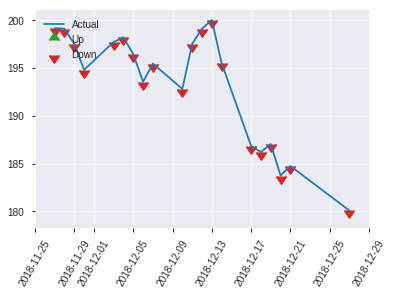


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.5020080321285141
RMSE: 0.7085252515814197
LogLoss: 17.338743170135874
Null degrees of freedom: 248
Residual degrees of freedom: -789
Null deviance: 345.1994009871195
Residual deviance: 177099.10463306593
AIC: 179175.10463306593
AUC: 0.5
pr_auc: 0.0
Gini: 0.0
Could not find exact threshold 0.0; using closest threshold found 0.0.
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.0: 


,0,1,Error,Rate
0,0.0,124.0,1.0,(124.0/124.0)
1,0.0,125.0,0.0,(0.0/125.0)
Total,0.0,249.0,0.498,(124.0/249.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0,0.6684492,0.0
max f2,0.0,0.8344459,0.0
max f0point5,0.0,0.5575379,0.0
max accuracy,0.0,0.5020080,0.0
max precision,0.0,0.5020080,0.0
max recall,0.0,1.0,0.0
max specificity,0.0,0.0,0.0
max absolute_mcc,0.0,0.0,0.0
max min_per_class_accuracy,0.0,0.0,0.0
max mean_per_class_accuracy,0.0,0.5,0.0


Gains/Lift Table: Avg response rate: 50.20 %, avg score:  0.00 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,1.0,0.0,1.0,1.0,0.5020080,0.0,0.5020080,0.0,1.0,1.0,0.0,0.0


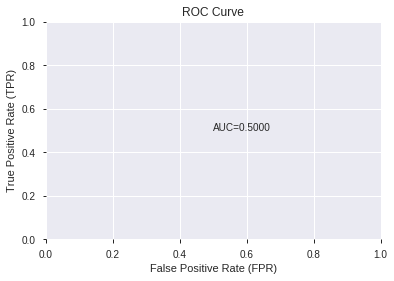

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


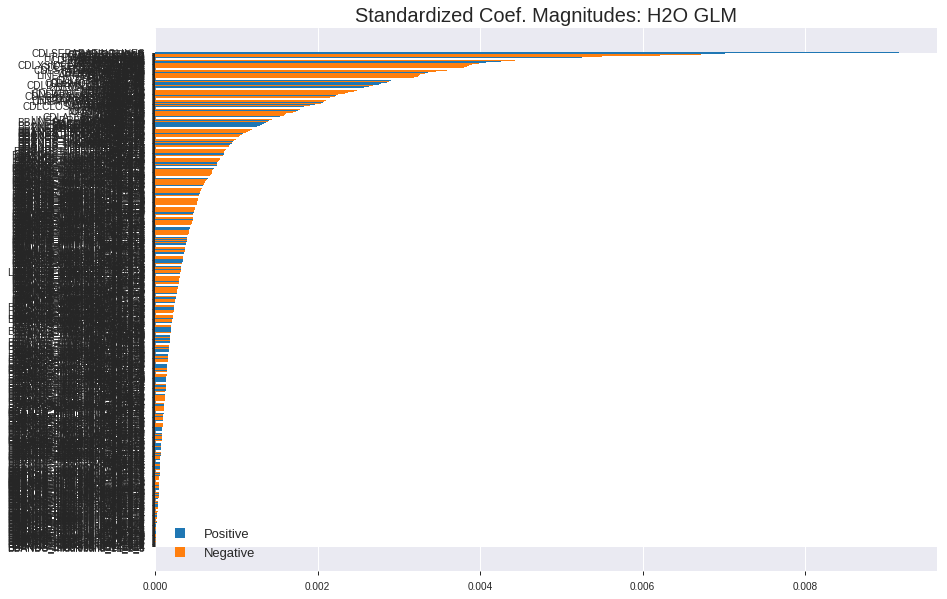

'log_likelihood'
--2019-08-27 21:21:39--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.160.203
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.160.203|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


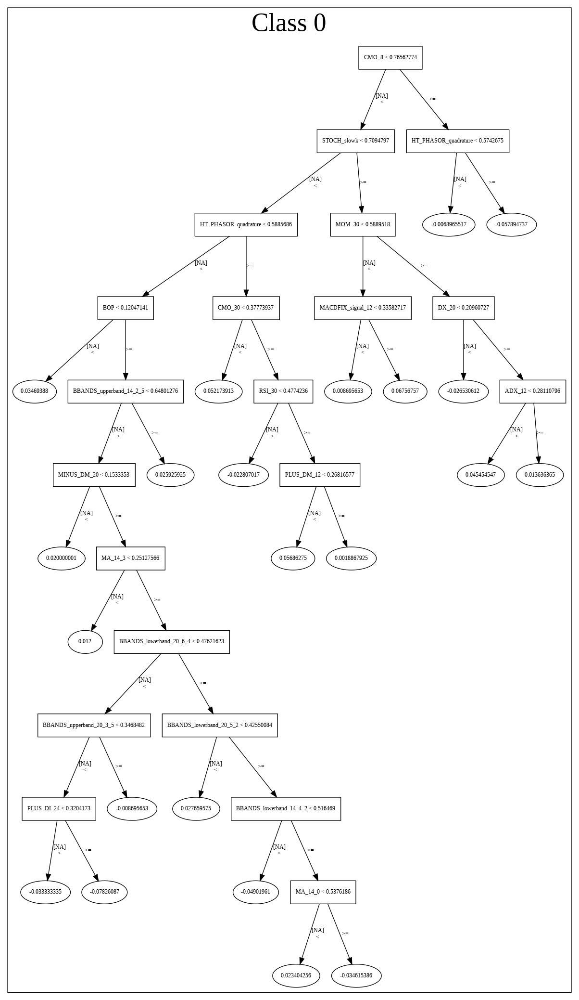

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190827_212103_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190827_212103_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_34_sid_8014',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_34_s

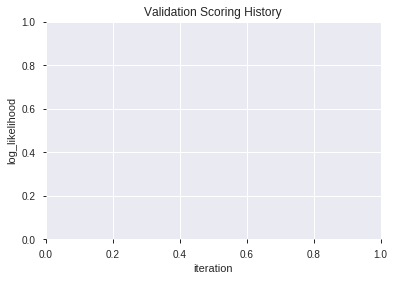

In [15]:
# GLM
glm_features = model_train(feature_name='All',model_algo="GLM")

In [16]:
# DeepLearning with top GLM features
model_train(feature_name='GLMF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

[]

In [17]:
# GLM with top GLM features
model_train(feature_name='GLMF',model_algo="GLM",features_list = features_list[:model_selected_features])

[]

In [18]:
# XGBoost with top GLM features
model_train(feature_name='GLMF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

[]

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_3_AutoML_20190827_212145,0.562968,0.709603,0.487903,0.507873,0.257935
1,XGBoost_grid_1_AutoML_20190827_212145_model_1,0.541161,0.763945,0.500000,0.530827,0.281777
2,XGBoost_grid_1_AutoML_20190827_212145_model_6,0.539935,0.709843,0.495968,0.507786,0.257847
3,XGBoost_grid_1_AutoML_20190827_212145_model_5,0.528581,0.752908,0.483871,0.525834,0.276501
4,XGBoost_grid_1_AutoML_20190827_212145_model_2,0.528323,0.697260,0.500000,0.501968,0.251972
5,XGBoost_grid_1_AutoML_20190827_212145_model_3,0.523290,0.738319,0.491935,0.520623,0.271049
6,XGBoost_grid_1_AutoML_20190827_212145_model_7,0.518258,0.722547,0.487903,0.513788,0.263978
7,XGBoost_2_AutoML_20190827_212145,0.516839,0.698350,0.491903,0.502546,0.252552
8,XGBoost_grid_1_AutoML_20190827_212145_model_4,0.516323,0.695934,0.495968,0.501390,0.251392
9,XGBoost_1_AutoML_20190827_212145,0.514129,0.721698,0.491871,0.513187,0.263361


,variable,relative_importance,scaled_importance,percentage
0,BETA_14,145.694412,1.000000,0.024308
1,COS,139.012985,0.954141,0.023193
2,ULTOSC,118.302872,0.811993,0.019738
3,PLUS_DM_8,110.469704,0.758229,0.018431
4,SUB,109.126907,0.749012,0.018207
5,OBV,107.342842,0.736767,0.017909
6,CORREL_14,96.828735,0.664602,0.016155
7,DIV,94.265945,0.647011,0.015727
8,CORREL_8,87.762268,0.602372,0.014642
9,BETA_8,86.786972,0.595678,0.014480


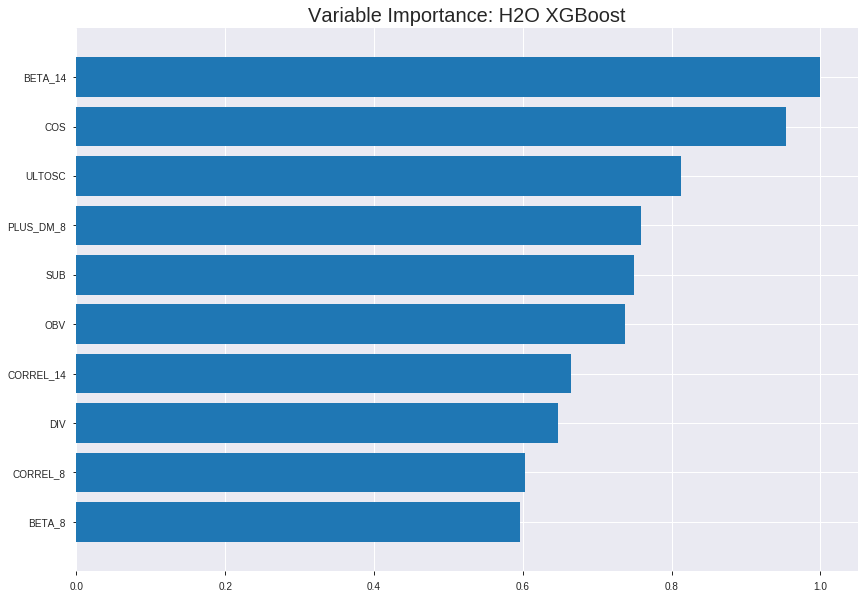

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_3_AutoML_20190827_212145


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.17039523017553954
RMSE: 0.41278957130181904
LogLoss: 0.528643342729183
Mean Per-Class Error: 0.10952208114457673
AUC: 0.9550424992740807
pr_auc: 0.9548387014902725
Gini: 0.9100849985481614
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5162637531757355: 


,0,1,Error,Rate
0,777.0,83.0,0.0965,(83.0/860.0)
1,108.0,773.0,0.1226,(108.0/881.0)
Total,885.0,856.0,0.1097,(191.0/1741.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5162638,0.8900403,186.0
max f2,0.4561523,0.9244876,240.0
max f0point5,0.5171040,0.8988109,185.0
max accuracy,0.5171040,0.8902929,185.0
max precision,0.8190732,1.0,0.0
max recall,0.3598249,1.0,320.0
max specificity,0.8190732,1.0,0.0
max absolute_mcc,0.5171040,0.7810754,185.0
max min_per_class_accuracy,0.5105926,0.8837209,192.0
max mean_per_class_accuracy,0.5171040,0.8904779,185.0


Gains/Lift Table: Avg response rate: 50.60 %, avg score: 50.70 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103389,0.7614462,1.9761635,1.9761635,1.0,0.7872296,1.0,0.7872296,0.0204313,0.0204313,97.6163451,97.6163451
,2,0.0201034,0.7282276,1.9761635,1.9761635,1.0,0.7418332,1.0,0.7651799,0.0192963,0.0397276,97.6163451,97.6163451
,3,0.0304423,0.7141152,1.9761635,1.9761635,1.0,0.7195950,1.0,0.7496982,0.0204313,0.0601589,97.6163451,97.6163451
,4,0.0402068,0.7056745,1.9761635,1.9761635,1.0,0.7102793,1.0,0.7401251,0.0192963,0.0794552,97.6163451,97.6163451
,5,0.0505457,0.6967056,1.9761635,1.9761635,1.0,0.6999439,1.0,0.7319062,0.0204313,0.0998865,97.6163451,97.6163451
,6,0.1005169,0.6642457,1.9761635,1.9761635,1.0,0.6801326,1.0,0.7061673,0.0987514,0.1986379,97.6163451,97.6163451
,7,0.1504882,0.6384836,1.9534489,1.9686208,0.9885057,0.6494892,0.9961832,0.6873467,0.0976163,0.2962543,95.3448928,96.8620842
,8,0.2004595,0.6178759,1.9307344,1.9591764,0.9770115,0.6281772,0.9914040,0.6725967,0.0964813,0.3927355,93.0734406,95.9176372
,9,0.3004021,0.5865042,1.8625908,1.9270428,0.9425287,0.6019855,0.9751434,0.6491046,0.1861521,0.5788876,86.2590839,92.7042753
,10,0.4003446,0.5538899,1.6468029,1.8570833,0.8333333,0.5711983,0.9397418,0.6296560,0.1645857,0.7434733,64.6802876,85.7083300




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.2647818112442976
RMSE: 0.5145695397556074
LogLoss: 0.7238794269192024
Mean Per-Class Error: 0.4555029815919108
AUC: 0.5348878662172672
pr_auc: 0.5530785019082559
Gini: 0.0697757324345345
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2824040651321411: 


,0,1,Error,Rate
0,4.0,228.0,0.9828,(228.0/232.0)
1,0.0,266.0,0.0,(0.0/266.0)
Total,4.0,494.0,0.4578,(228.0/498.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2824041,0.7000000,395.0
max f2,0.2824041,0.8536585,395.0
max f0point5,0.3611772,0.5948373,297.0
max accuracy,0.3611772,0.5562249,297.0
max precision,0.6889490,1.0,0.0
max recall,0.2824041,1.0,395.0
max specificity,0.6889490,1.0,0.0
max absolute_mcc,0.4493616,0.1008270,114.0
max min_per_class_accuracy,0.4063852,0.5150376,200.0
max mean_per_class_accuracy,0.4493616,0.5444970,114.0


Gains/Lift Table: Avg response rate: 53.41 %, avg score: 41.04 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100402,0.5789729,0.7488722,0.7488722,0.4,0.6205085,0.4,0.6205085,0.0075188,0.0075188,-25.1127820,-25.1127820
,2,0.0200803,0.5602808,0.7488722,0.7488722,0.4,0.5670065,0.4,0.5937575,0.0075188,0.0150376,-25.1127820,-25.1127820
,3,0.0301205,0.5415135,1.4977444,0.9984962,0.8,0.5511918,0.5333333,0.5795689,0.0150376,0.0300752,49.7744361,-0.1503759
,4,0.0401606,0.5307612,0.7488722,0.9360902,0.4,0.5362978,0.5,0.5687511,0.0075188,0.0375940,-25.1127820,-6.3909774
,5,0.0502008,0.5240124,1.1233083,0.9735338,0.6,0.5278827,0.52,0.5605775,0.0112782,0.0488722,12.3308271,-2.6466165
,6,0.1004016,0.4982149,1.1233083,1.0484211,0.6,0.5091309,0.56,0.5348542,0.0563910,0.1052632,12.3308271,4.8421053
,7,0.1506024,0.4806759,0.9735338,1.0234586,0.52,0.4911339,0.5466667,0.5202808,0.0488722,0.1541353,-2.6466165,2.3458647
,8,0.2008032,0.4675870,1.1981955,1.0671429,0.64,0.4736832,0.57,0.5086314,0.0601504,0.2142857,19.8195489,6.7142857
,9,0.3012048,0.4416663,1.1607519,1.0983459,0.62,0.4532313,0.5866667,0.4901647,0.1165414,0.3308271,16.0751880,9.8345865
,10,0.3995984,0.4224500,0.9934019,1.0725054,0.5306122,0.4320771,0.5728643,0.4758617,0.0977444,0.4285714,-0.6598128,7.2505384



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-27 21:21:59,0.004 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4939690,0.5,0.6931472,0.5,0.0,1.0,0.4658635
,2019-08-27 21:22:00,1.282 sec,5.0,0.4867212,0.6668831,0.8030759,0.8082627,1.9761635,0.2940839,0.4996226,0.6923936,0.5426416,0.5691769,1.1701128,0.4658635
,2019-08-27 21:22:00,1.521 sec,10.0,0.4748172,0.6437772,0.8563003,0.8590134,1.9761635,0.2601953,0.4985345,0.6901935,0.5431845,0.5686819,1.4977444,0.4437751
,2019-08-27 21:22:00,1.757 sec,15.0,0.4650251,0.6250571,0.8880672,0.8907776,1.9761635,0.2056289,0.4996869,0.6924931,0.5432898,0.5731945,1.4977444,0.4558233
,2019-08-27 21:22:01,1.986 sec,20.0,0.4584806,0.6126273,0.8981225,0.8998063,1.9761635,0.1952901,0.5010589,0.6952730,0.5550541,0.5742281,1.4977444,0.4618474
,2019-08-27 21:22:01,2.228 sec,25.0,0.4496787,0.5961091,0.9141237,0.9147079,1.9761635,0.1740379,0.5015886,0.6963808,0.5468466,0.5676862,1.1233083,0.4618474
,2019-08-27 21:22:01,2.460 sec,30.0,0.4420562,0.5818742,0.9214074,0.9233343,1.9761635,0.1602527,0.5043857,0.7021395,0.5444565,0.5642650,1.1233083,0.4638554
,2019-08-27 21:22:01,2.697 sec,35.0,0.4345674,0.5680652,0.9319207,0.9330625,1.9761635,0.1591040,0.5071509,0.7078972,0.5456394,0.5618438,1.1233083,0.4618474
,2019-08-27 21:22:01,2.931 sec,40.0,0.4273626,0.5549430,0.9420908,0.9425050,1.9761635,0.1361287,0.5077997,0.7092979,0.5455827,0.5606299,1.1233083,0.4618474
,2019-08-27 21:22:02,3.182 sec,45.0,0.4203238,0.5421360,0.9482400,0.9486258,1.9761635,0.1229179,0.5106233,0.7152584,0.5424148,0.5564734,1.1233083,0.4618474


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BETA_14,145.6944122,1.0,0.0243079
COS,139.0129852,0.9541408,0.0231931
ULTOSC,118.3028717,0.8119932,0.0197378
PLUS_DM_8,110.4697037,0.7582288,0.0184309
SUB,109.1269073,0.7490123,0.0182069
---,---,---,---
LINEARREG_ANGLE_20,1.4442596,0.0099129,0.0002410
BBANDS_lowerband_20_1_4,1.2149906,0.0083393,0.0002027
BBANDS_upperband_20_5_2,1.2100296,0.0083053,0.0002019
BBANDS_upperband_12_1_5,1.1739669,0.0080577,0.0001959



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5863453815261044)

('F1', 0.6738544474393531)

('auc', 0.5629677419354839)

('logloss', 0.70960347645457)

('mean_per_class_error', 0.4139354838709677)

('rmse', 0.50787275361381)

('mse', 0.2579347338632738)

xgboost prediction progress: |████████████████████████████████████████████| 100%


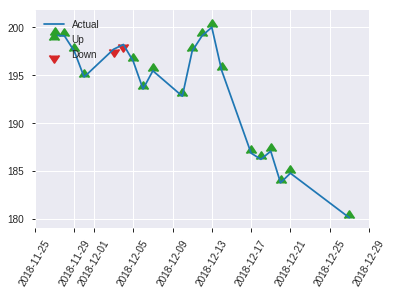


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.2579347338632738
RMSE: 0.50787275361381
LogLoss: 0.70960347645457
Mean Per-Class Error: 0.4139354838709677
AUC: 0.5629677419354839
pr_auc: 0.5279981580101262
Gini: 0.12593548387096787
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2691369354724884: 


,0,1,Error,Rate
0,3.0,121.0,0.9758,(121.0/124.0)
1,0.0,125.0,0.0,(0.0/125.0)
Total,3.0,246.0,0.4859,(121.0/249.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2691369,0.6738544,245.0
max f2,0.2691369,0.8378016,245.0
max f0point5,0.3886320,0.5923836,145.0
max accuracy,0.3967651,0.5863454,141.0
max precision,0.4430530,0.6065574,60.0
max recall,0.2691369,1.0,245.0
max specificity,0.5634569,0.9919355,0.0
max absolute_mcc,0.3886320,0.1746221,145.0
max min_per_class_accuracy,0.4074732,0.552,122.0
max mean_per_class_accuracy,0.3967651,0.5860645,141.0


Gains/Lift Table: Avg response rate: 50.20 %, avg score: 40.41 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0120482,0.5430668,0.0,0.0,0.0,0.5528499,0.0,0.5528499,0.0,0.0,-100.0,-100.0
,2,0.0200803,0.5327027,0.0,0.0,0.0,0.5370339,0.0,0.5465235,0.0,0.0,-100.0,-100.0
,3,0.0321285,0.5222017,0.6640000,0.249,0.3333333,0.5271906,0.125,0.5392737,0.008,0.008,-33.6000000,-75.1
,4,0.0401606,0.5094277,0.996,0.3984,0.5,0.5207427,0.2,0.5355675,0.008,0.016,-0.4000000,-60.1600000
,5,0.0522088,0.5041237,1.992,0.7661538,1.0,0.5076943,0.3846154,0.5291352,0.024,0.04,99.2,-23.3846154
,6,0.1004016,0.4830593,1.162,0.9561600,0.5833333,0.4924924,0.48,0.5115467,0.056,0.096,16.2000000,-4.3840000
,7,0.1526104,0.4676448,1.0726154,0.996,0.5384615,0.4751721,0.5,0.4991027,0.056,0.152,7.2615385,-0.4000000
,8,0.2008032,0.4556443,1.494,1.11552,0.75,0.4617094,0.56,0.4901283,0.072,0.224,49.4,11.5520000
,9,0.3012048,0.4319985,1.27488,1.16864,0.64,0.4423095,0.5866667,0.4741887,0.128,0.352,27.488,16.8640000
,10,0.4016064,0.4197751,1.11552,1.15536,0.56,0.4247359,0.58,0.4618255,0.112,0.464,11.5520000,15.5360000


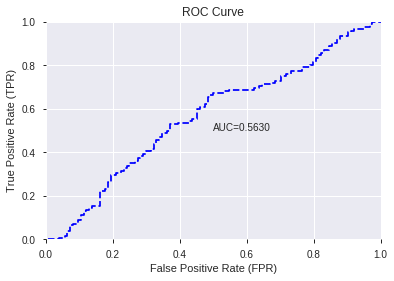

This function is available for GLM models only


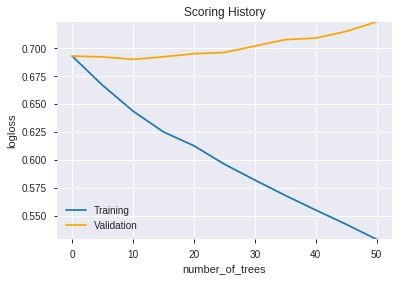

--2019-08-27 21:22:43--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.98.91
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.98.91|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.indexOf(String.java:1578)
	at java.base/java.lang.String.indexOf(String.java:1535)
	at java.base/java.lang.String.split(String.java:2274)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:112)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.jav

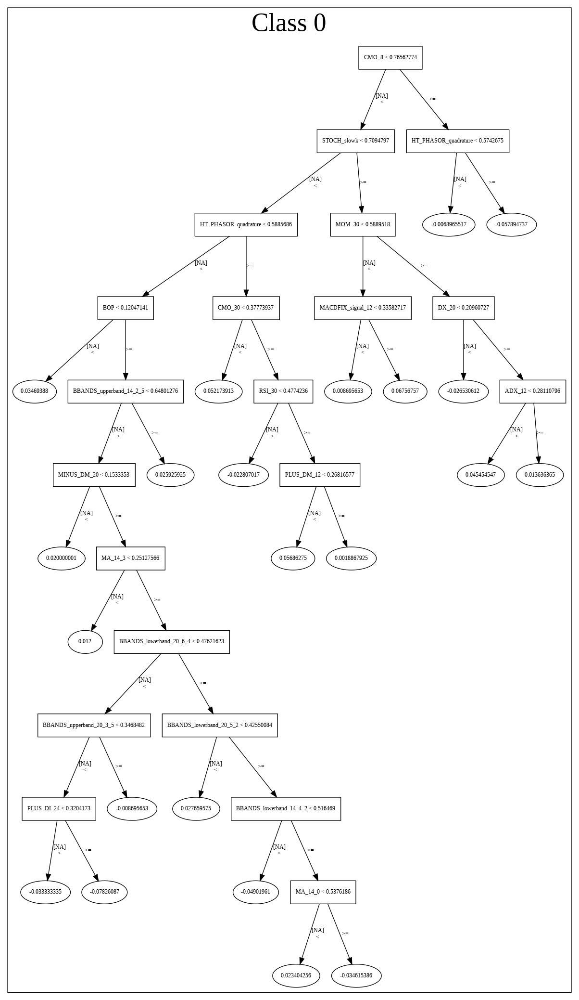

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_3_AutoML_20190827_212145',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_3_AutoML_20190827_212145',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_42_sid_8014',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_42_sid_8014',
   'type

In [19]:
# XGBoost
xgb_features = model_train(feature_name='All',model_algo="XGBoost")

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190827_212249_model_2,0.5,17.338743,0.5,0.708525,0.502008
1,DeepLearning_grid_1_AutoML_20190827_212249_model_9,0.5,0.696235,0.5,0.501536,0.251539
2,DeepLearning_grid_1_AutoML_20190827_212249_model_3,0.5,17.338743,0.5,0.708525,0.502008
3,DeepLearning_grid_1_AutoML_20190827_212249_model_4,0.5,17.200033,0.5,0.705685,0.497992
4,DeepLearning_grid_1_AutoML_20190827_212249_model_8,0.5,0.695928,0.5,0.501384,0.251386
5,DeepLearning_grid_1_AutoML_20190827_212249_model_6,0.5,17.200033,0.5,0.705685,0.497992
6,DeepLearning_grid_1_AutoML_20190827_212249_model_7,0.5,17.200033,0.5,0.705685,0.497992
7,DeepLearning_grid_1_AutoML_20190827_212249_model_1,0.5,17.200033,0.5,0.705685,0.497992
8,DeepLearning_grid_1_AutoML_20190827_212249_model_5,0.5,0.693252,0.5,0.500052,0.250052
9,DeepLearning_1_AutoML_20190827_212249,0.5,17.338743,0.5,0.708525,0.502008


,variable,relative_importance,scaled_importance,percentage
0,CDLONNECK,1.000000,1.000000,0.036957
1,SINH,0.771378,0.771378,0.028507
2,CDLPIERCING,0.740659,0.740659,0.027372
3,DX_30,0.687545,0.687545,0.025409
4,SIN,0.655164,0.655164,0.024213
5,weekday,0.633198,0.633198,0.023401
6,STOCHRSI_fastk,0.632657,0.632657,0.023381
7,ADX_24,0.625566,0.625566,0.023119
8,BOP,0.617626,0.617626,0.022825
9,MACDFIX_hist_20,0.591253,0.591253,0.021851


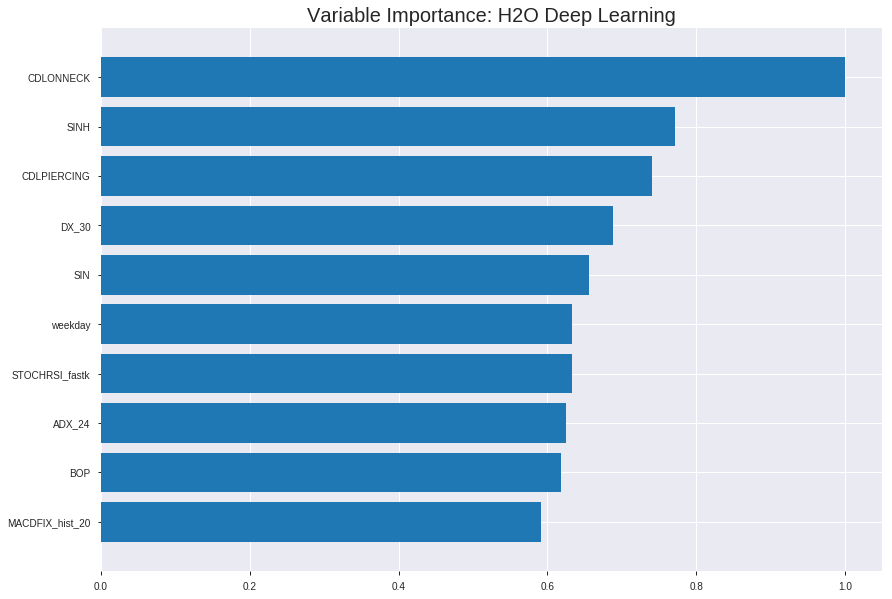

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190827_212249_model_2


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.27703871240759603
RMSE: 0.5263446707316376
LogLoss: 0.7766095658583537
Mean Per-Class Error: 0.4631167014228017
AUC: 0.5308383707731701
pr_auc: 0.5315029703903098
Gini: 0.061676741546340175
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.00734749124099487: 


,0,1,Error,Rate
0,3.0,857.0,0.9965,(857.0/860.0)
1,1.0,880.0,0.0011,(1.0/881.0)
Total,4.0,1737.0,0.4928,(858.0/1741.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0073475,0.6722689,398.0
max f2,0.0019369,0.8366572,399.0
max f0point5,0.0538411,0.5625563,389.0
max accuracy,0.4366503,0.5370477,169.0
max precision,0.6694251,0.7,8.0
max recall,0.0019369,1.0,399.0
max specificity,0.8127760,0.9988372,0.0
max absolute_mcc,0.4366503,0.0737905,169.0
max min_per_class_accuracy,0.4433598,0.5348837,164.0
max mean_per_class_accuracy,0.4366503,0.5368833,169.0


Gains/Lift Table: Avg response rate: 50.60 %, avg score: 39.73 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103389,0.6495503,1.3174423,1.3174423,0.6666667,0.6825168,0.6666667,0.6825168,0.0136209,0.0136209,31.7442300,31.7442300
,2,0.0201034,0.6189953,1.0462042,1.1856981,0.5294118,0.6319853,0.6,0.6579729,0.0102157,0.0238365,4.6204180,18.5698070
,3,0.0304423,0.5999500,0.8782949,1.0812970,0.4444444,0.6099105,0.5471698,0.6416499,0.0090806,0.0329171,-12.1705133,8.1296982
,4,0.0402068,0.5912759,1.0462042,1.0727744,0.5294118,0.5955205,0.5428571,0.6304470,0.0102157,0.0431328,4.6204180,7.2774445
,5,0.0505457,0.5801873,1.0978686,1.0779073,0.5555556,0.5862037,0.5454545,0.6213973,0.0113507,0.0544835,9.7868584,7.7907337
,6,0.1005169,0.5515327,1.1811552,1.1292363,0.5977011,0.5630783,0.5714286,0.5924044,0.0590238,0.1135074,18.1155166,12.9236257
,7,0.1504882,0.5362867,1.0221535,1.0936782,0.5172414,0.5437251,0.5534351,0.5762399,0.0510783,0.1645857,2.2153509,9.3678246
,8,0.2004595,0.5224358,1.0675826,1.0871730,0.5402299,0.5295391,0.5501433,0.5645981,0.0533485,0.2179342,6.7582554,8.7173016
,9,0.3004021,0.4990210,0.9540099,1.0428702,0.4827586,0.5106831,0.5277247,0.5466608,0.0953462,0.3132804,-4.5990058,4.2870196
,10,0.4003446,0.4747683,1.1470834,1.0688861,0.5804598,0.4875520,0.5408895,0.5319048,0.1146425,0.4279228,14.7083382,6.8886113




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.5274407943509491
RMSE: 0.7262511923232547
LogLoss: 17.684901891356745
Mean Per-Class Error: 0.48285584651283386
AUC: 0.5170145190562614
pr_auc: 0.6319526472924426
Gini: 0.03402903811252278
Confusion Matrix (Act/Pred) for max f1 @ threshold = 1.886864907738874e-57: 


,0,1,Error,Rate
0,0.0,232.0,1.0,(232.0/232.0)
1,0.0,266.0,0.0,(0.0/266.0)
Total,0.0,498.0,0.4659,(232.0/498.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0000000,0.6963351,22.0
max f2,0.0000000,0.8514725,22.0
max f0point5,0.0000000,0.5890168,22.0
max accuracy,0.0000000,0.5341365,22.0
max precision,0.3384556,1.0,0.0
max recall,0.0000000,1.0,22.0
max specificity,0.3384556,1.0,0.0
max absolute_mcc,0.0000000,0.0832369,21.0
max min_per_class_accuracy,0.0000000,0.0601504,21.0
max mean_per_class_accuracy,0.0000000,0.5171442,21.0


Gains/Lift Table: Avg response rate: 53.41 %, avg score:  0.58 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100402,0.2410119,1.1233083,1.1233083,0.6,0.2939576,0.6,0.2939576,0.0112782,0.0112782,12.3308271,12.3308271
,2,0.0200803,0.1203577,1.4977444,1.3105263,0.8,0.2191475,0.7,0.2565525,0.0150376,0.0263158,49.7744361,31.0526316
,3,0.0301205,0.0010475,1.4977444,1.3729323,0.8,0.0621061,0.7333333,0.1917371,0.0150376,0.0413534,49.7744361,37.2932331
,4,0.0401606,0.0000000,1.1233083,1.3105263,0.6,0.0000376,0.7,0.1438122,0.0112782,0.0526316,12.3308271,31.0526316
,5,0.0502008,0.0000000,1.1233083,1.2730827,0.6,0.0000000,0.68,0.1150498,0.0112782,0.0639098,12.3308271,27.3082707
,6,1.0,0.0,0.9855665,1.0,0.5264271,0.0000000,0.5341365,0.0057756,0.9360902,1.0,-1.4433547,0.0



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-27 21:23:43,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-27 21:23:45,54.798 sec,6440 obs/sec,9.8098794,1,17079.0,0.5263447,0.7766096,-0.1083161,0.5308384,0.5315030,1.3174423,0.4928202,0.7262512,17.6849019,-1.1196433,0.5170145,0.6319526,1.1233083,0.4658635
,2019-08-27 21:23:51,1 min 0.905 sec,9870 obs/sec,49.1028145,5,85488.0,0.5115056,0.7408237,-0.0467042,0.5560357,0.5526587,1.4272292,0.4922458,0.7256756,17.7437041,-1.1162849,0.5133686,0.6172533,1.1233083,0.4658635
,2019-08-27 21:23:57,1 min 6.590 sec,11990 obs/sec,98.2153935,10,170993.0,0.5189256,0.7605225,-0.0772918,0.5566897,0.5481756,1.4272292,0.4928202,0.7246853,17.7330467,-1.1105129,0.5133361,0.6181484,1.1233083,0.4658635
,2019-08-27 21:24:02,1 min 11.854 sec,13191 obs/sec,147.2860425,15,256425.0,0.5090743,0.7302411,-0.0367774,0.5809222,0.5613052,1.2076554,0.4537622,0.7247240,17.7349087,-1.1107381,0.5133037,0.6174662,1.1233083,0.4658635
,2019-08-27 21:24:08,1 min 16.996 sec,13959 obs/sec,196.3767949,20,341892.0,0.5138862,0.7639336,-0.0564699,0.6080821,0.5799023,1.2076554,0.4279150,0.7245383,17.7490496,-1.1096566,0.5133118,0.6174769,0.7488722,0.4658635
,2019-08-27 21:24:13,1 min 22.856 sec,14689 obs/sec,255.3084434,26,444492.0,0.5042337,0.7329289,-0.0171545,0.6151374,0.5858378,1.3174423,0.4388283,0.7247981,17.7455575,-1.1111698,0.5133199,0.6175462,0.7488722,0.4658635
,2019-08-27 21:24:14,1 min 22.963 sec,14686 obs/sec,255.3084434,26,444492.0,0.5263447,0.7766096,-0.1083161,0.5308384,0.5315030,1.3174423,0.4928202,0.7262512,17.6849019,-1.1196433,0.5170145,0.6319526,1.1233083,0.4658635


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLONNECK,1.0,1.0,0.0369566
SINH,0.7713776,0.7713776,0.0285075
CDLPIERCING,0.7406591,0.7406591,0.0273722
DX_30,0.6875448,0.6875448,0.0254093
SIN,0.6551639,0.6551639,0.0242126
---,---,---,---
BBANDS_middleband_8_7_4,0.4724097,0.4724097,0.0174586
BBANDS_lowerband_20_6_2,0.4700568,0.4700568,0.0173717
BBANDS_upperband_8_2_3,0.4651692,0.4651692,0.0171911
BBANDS_middleband_24_6_2,0.4649701,0.4649701,0.0171837



See the whole table with table.as_data_frame()


Could not find exact threshold 0.0; using closest threshold found 0.0.


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5020080321285141)

Could not find exact threshold 0.0; using closest threshold found 0.0.


('F1', 0.6684491978609626)

('auc', 0.5)

('logloss', 17.338743170135874)

Could not find exact threshold 0.0; using closest threshold found 0.0.


('mean_per_class_error', 0.5)

('rmse', 0.7085252515814197)

('mse', 0.5020080321285141)

deeplearning prediction progress: |███████████████████████████████████████| 100%


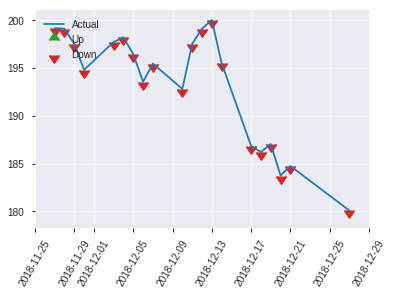


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.5020080321285141
RMSE: 0.7085252515814197
LogLoss: 17.338743170135874
Could not find exact threshold 0.0; using closest threshold found 0.0.
Mean Per-Class Error: 0.5
AUC: 0.5
pr_auc: 0.0
Gini: 0.0
Could not find exact threshold 0.0; using closest threshold found 0.0.
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.0: 


,0,1,Error,Rate
0,0.0,124.0,1.0,(124.0/124.0)
1,0.0,125.0,0.0,(0.0/125.0)
Total,0.0,249.0,0.498,(124.0/249.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0,0.6684492,0.0
max f2,0.0,0.8344459,0.0
max f0point5,0.0,0.5575379,0.0
max accuracy,0.0,0.5020080,0.0
max precision,0.0,0.5020080,0.0
max recall,0.0,1.0,0.0
max specificity,0.0,0.0,0.0
max absolute_mcc,0.0,0.0,0.0
max min_per_class_accuracy,0.0,0.0,0.0
max mean_per_class_accuracy,0.0,0.5,0.0


Gains/Lift Table: Avg response rate: 50.20 %, avg score:  0.00 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,1.0,0.0,1.0,1.0,0.5020080,0.0,0.5020080,0.0,1.0,1.0,0.0,0.0


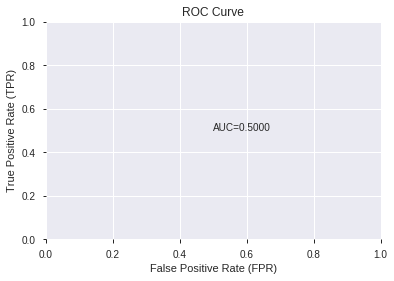

This function is available for GLM models only


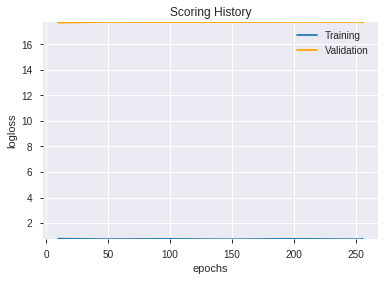

--2019-08-27 21:29:47--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.187.67
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.187.67|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


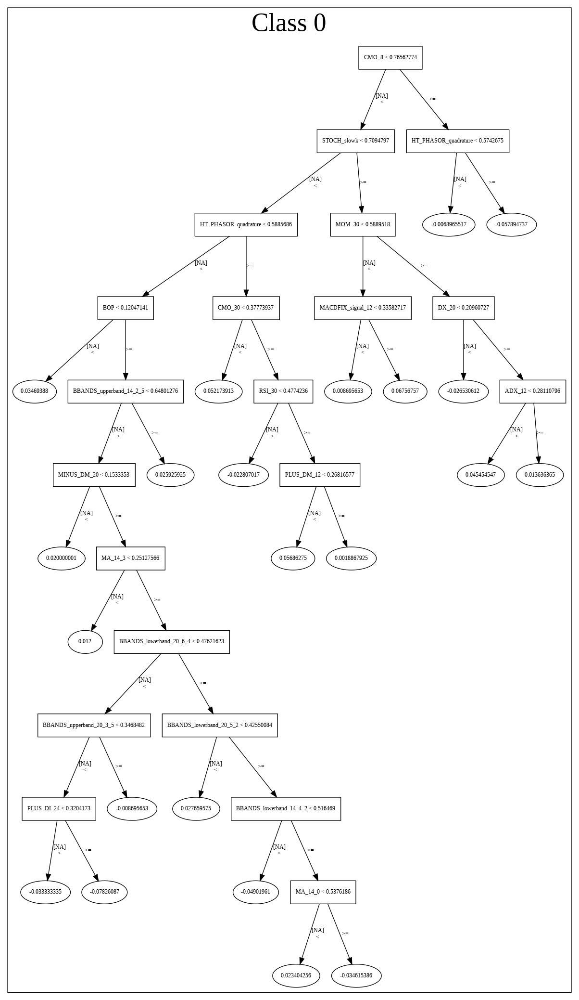

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190827_212249_model_2',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190827_212249_model_2',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_50_sid_8014',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['CDLONNECK',
 'SINH',
 'CDLPIERCING',
 'DX_30',
 'SIN',
 'weekday',
 'STOCHRSI_fastk',
 'ADX_24',
 'BOP',
 'MACDFIX_hist_20',
 'HT_DCPERIOD',
 'MACD',
 'CDLSHOOTINGSTAR',
 'LINEARREG_ANGLE_14',
 'WILLR_20',
 'BBANDS_middleband_12_3_2',
 'CDLTHRUSTING',
 'BBANDS_upperband_8_8_3',
 'BBANDS_upperband_14_0_5',
 'SMA_8',
 'BBANDS_middleband_30_7_3',
 'BBANDS_upperband_30_6_2',
 'CORREL_12',
 'BBANDS_middleband_14_4_5',
 'BBANDS_upperband_14_4_5',
 'MINMAX_max_30',
 'BBANDS_upperband_8_2_4',
 'BBANDS_lowerband_12_0_3',
 'MAVP_12_7',
 'BBANDS_upperband_20_2_5',
 'BBANDS_lowerband_30_1_3',
 'BBANDS_upperband_24_0_2',
 'TRIMA_8',
 'BBANDS_middleband_14_3_3',
 'BBANDS_lowerband_14_2_2',
 'MAVP_8_0',
 'BBANDS_middleband_14_6_2',
 'BBANDS_lowerband_14_0_4',
 'Adj Close',
 'BBANDS_middleband_30_6_3',
 'WMA_8',
 'MA_8_3',
 'MAVP_8_8',
 'BBANDS_middleband_12_3_5',
 'BBANDS_upperband_20_0_2',
 'BBANDS_middleband_8_7_4',
 'BBANDS_lowerband_20_6_2',
 'BBANDS_upperband_8_2_3',
 'BBANDS_middleband_24_6_2

In [20]:
# DeepLearning with top XGBoost features
model_train(feature_name='XGBF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190827_212953_model_1,0.5,17.338743,0.5,0.708525,0.502008


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.008132,1.000000,0.061971
1,SINH,0.007245,0.890910,0.055211
2,HT_DCPERIOD,0.007106,0.873780,0.054149
3,CDLTHRUSTING,0.005891,0.724361,0.044889
4,MACDFIX_hist_20,0.005479,0.673725,0.041751
5,WILLR_20,0.005478,0.673640,0.041746
6,SIN,0.005409,0.665078,0.041216
7,CDLONNECK,0.005225,0.642470,0.039815
8,LINEARREG_ANGLE_14,0.004885,0.600654,0.037223
9,CDLSHOOTINGSTAR,0.004775,0.587177,0.036388


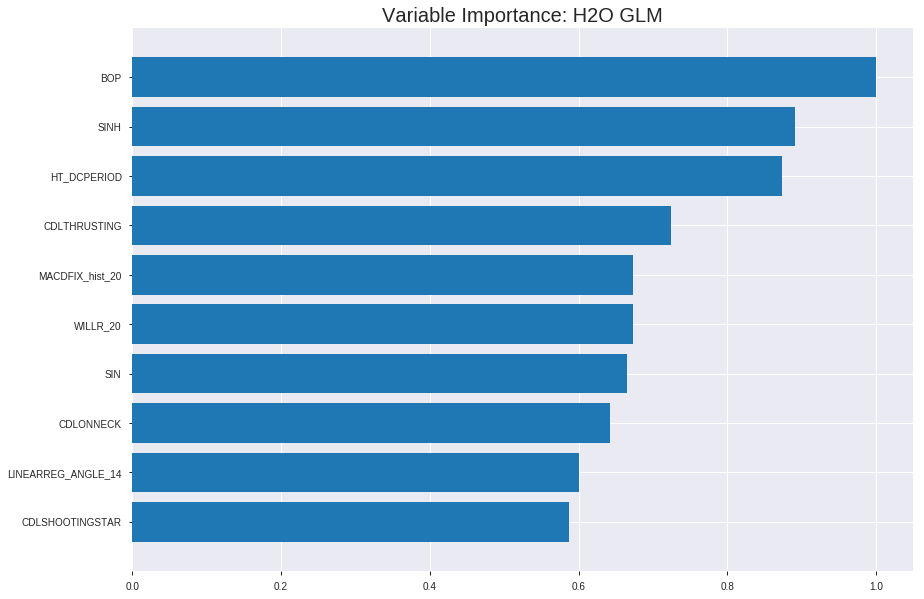

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190827_212953_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.24930124262299372
RMSE: 0.4993007536775743
LogLoss: 0.6917480523950881
Null degrees of freedom: 1740
Residual degrees of freedom: 1690
Null deviance: 2413.285173867487
Residual deviance: 2408.6667184396965
AIC: 2510.6667184396965
AUC: 0.5316322624924109
pr_auc: 0.5366357087816326
Gini: 0.06326452498482182
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4778405855669704: 


,0,1,Error,Rate
0,18.0,842.0,0.9791,(842.0/860.0)
1,8.0,873.0,0.0091,(8.0/881.0)
Total,26.0,1715.0,0.4882,(850.0/1741.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4778406,0.6725732,380.0
max f2,0.4520294,0.8368161,398.0
max f0point5,0.4833204,0.5644623,359.0
max accuracy,0.4978318,0.5295807,262.0
max precision,0.5404312,0.8,3.0
max recall,0.4520294,1.0,398.0
max specificity,0.5443664,0.9988372,0.0
max absolute_mcc,0.4957191,0.0610030,278.0
max min_per_class_accuracy,0.5065241,0.5220930,198.0
max mean_per_class_accuracy,0.4978318,0.5272325,262.0


Gains/Lift Table: Avg response rate: 50.60 %, avg score: 50.60 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103389,0.5359641,1.3174423,1.3174423,0.6666667,0.5392188,0.6666667,0.5392188,0.0136209,0.0136209,31.7442300,31.7442300
,2,0.0201034,0.5315419,1.2786940,1.2986217,0.6470588,0.5332286,0.6571429,0.5363093,0.0124858,0.0261067,27.8693997,29.8621696
,3,0.0304423,0.5304506,1.0978686,1.2304414,0.5555556,0.5309228,0.6226415,0.5344799,0.0113507,0.0374574,9.7868584,23.0441394
,4,0.0402068,0.5295555,1.3949389,1.2703908,0.7058824,0.5299471,0.6428571,0.5333791,0.0136209,0.0510783,39.4938906,27.0390790
,5,0.0505457,0.5284788,0.8782949,1.1901894,0.4444444,0.5289906,0.6022727,0.5324814,0.0090806,0.0601589,-12.1705133,19.0189351
,6,0.1005169,0.5240394,1.0675826,1.1292363,0.5402299,0.5261972,0.5714286,0.5293572,0.0533485,0.1135074,6.7582554,12.9236257
,7,0.1504882,0.5213107,0.9085809,1.0559652,0.4597701,0.5225158,0.5343511,0.5270855,0.0454030,0.1589103,-9.1419103,5.5965203
,8,0.2004595,0.5190822,1.0675826,1.0588612,0.5402299,0.5202401,0.5358166,0.5253790,0.0533485,0.2122588,6.7582554,5.8861219
,9,0.3004021,0.5149828,1.0675826,1.0617628,0.5402299,0.5171625,0.5372849,0.5226454,0.1066969,0.3189557,6.7582554,6.1762772
,10,0.4003446,0.5107148,1.0221535,1.0518747,0.5172414,0.5127359,0.5322812,0.5201716,0.1021566,0.4211124,2.2153509,5.1874663




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.5179007298243433
RMSE: 0.7196532010797585
LogLoss: 17.27367503244317
Null degrees of freedom: 497
Residual degrees of freedom: 447
Null deviance: 689.626794400202
Residual deviance: 343285.8330854662
AIC: 343387.8330854662
AUC: 0.5139519056261344
pr_auc: 0.5901643381640145
Gini: 0.027903811252268707
Confusion Matrix (Act/Pred) for max f1 @ threshold = 1.8741413835458242e-68: 


,0,1,Error,Rate
0,0.0,232.0,1.0,(232.0/232.0)
1,0.0,266.0,0.0,(0.0/266.0)
Total,0.0,498.0,0.4659,(232.0/498.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0000000,0.6963351,35.0
max f2,0.0000000,0.8514725,35.0
max f0point5,0.0000000,0.5890168,35.0
max accuracy,0.0000000,0.5341365,35.0
max precision,0.4938993,1.0,0.0
max recall,0.0000000,1.0,35.0
max specificity,0.4938993,1.0,0.0
max absolute_mcc,0.0022368,0.0904279,22.0
max min_per_class_accuracy,0.0000000,0.0827068,34.0
max mean_per_class_accuracy,0.0000000,0.5200771,29.0


Gains/Lift Table: Avg response rate: 53.41 %, avg score:  1.67 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100402,0.4872862,1.4977444,1.4977444,0.8,0.4916068,0.8,0.4916068,0.0150376,0.0150376,49.7744361,49.7744361
,2,0.0200803,0.4647384,1.1233083,1.3105263,0.6,0.4779360,0.7,0.4847714,0.0112782,0.0263158,12.3308271,31.0526316
,3,0.0301205,0.3906213,1.4977444,1.3729323,0.8,0.4517658,0.7333333,0.4737695,0.0150376,0.0413534,49.7744361,37.2932331
,4,0.0401606,0.0434083,1.1233083,1.3105263,0.6,0.2357727,0.7,0.4142703,0.0112782,0.0526316,12.3308271,31.0526316
,5,0.0502008,0.0000095,1.1233083,1.2730827,0.6,0.0093985,0.68,0.3332960,0.0112782,0.0639098,12.3308271,27.3082707
,6,1.0,0.0,0.9855665,1.0,0.5264271,0.0000000,0.5341365,0.0167317,0.9360902,1.0,-1.4433547,0.0



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-27 21:29:54,0.000 sec,2,.17E1,51,1.3834961,689.3289821
,2019-08-27 21:29:54,0.014 sec,4,.11E1,51,1.3827552,691.7662428
,2019-08-27 21:29:54,0.026 sec,6,.67E0,51,1.3818527,693.2095326
,2019-08-27 21:29:54,0.039 sec,8,.42E0,51,1.3808385,695.0688071
,2019-08-27 21:29:54,0.052 sec,10,.26E0,51,1.3798053,697.2711742


Could not find exact threshold 0.0; using closest threshold found 0.0.


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5020080321285141)

Could not find exact threshold 0.0; using closest threshold found 0.0.


('F1', 0.6684491978609626)

('auc', 0.5)

('logloss', 17.338743170135874)

Could not find exact threshold 0.0; using closest threshold found 0.0.


('mean_per_class_error', 0.5)

('rmse', 0.7085252515814197)

('mse', 0.5020080321285141)

glm prediction progress: |████████████████████████████████████████████████| 100%


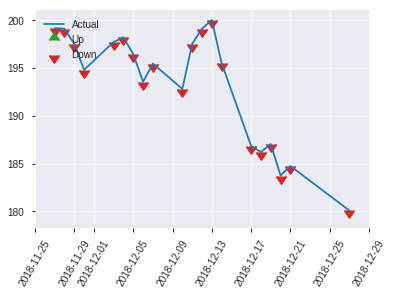


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.5020080321285141
RMSE: 0.7085252515814197
LogLoss: 17.338743170135874
Null degrees of freedom: 248
Residual degrees of freedom: 198
Null deviance: 345.1994009871195
Residual deviance: 177099.10463306593
AIC: 177201.10463306593
AUC: 0.5
pr_auc: 0.0
Gini: 0.0
Could not find exact threshold 0.0; using closest threshold found 0.0.
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.0: 


,0,1,Error,Rate
0,0.0,124.0,1.0,(124.0/124.0)
1,0.0,125.0,0.0,(0.0/125.0)
Total,0.0,249.0,0.498,(124.0/249.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0,0.6684492,0.0
max f2,0.0,0.8344459,0.0
max f0point5,0.0,0.5575379,0.0
max accuracy,0.0,0.5020080,0.0
max precision,0.0,0.5020080,0.0
max recall,0.0,1.0,0.0
max specificity,0.0,0.0,0.0
max absolute_mcc,0.0,0.0,0.0
max min_per_class_accuracy,0.0,0.0,0.0
max mean_per_class_accuracy,0.0,0.5,0.0


Gains/Lift Table: Avg response rate: 50.20 %, avg score:  0.00 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,1.0,0.0,1.0,1.0,0.5020080,0.0,0.5020080,0.0,1.0,1.0,0.0,0.0


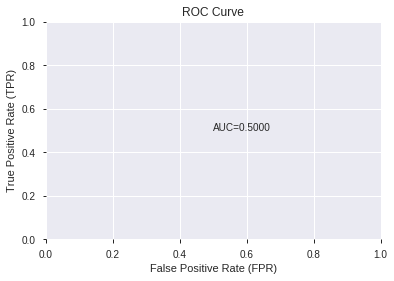

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


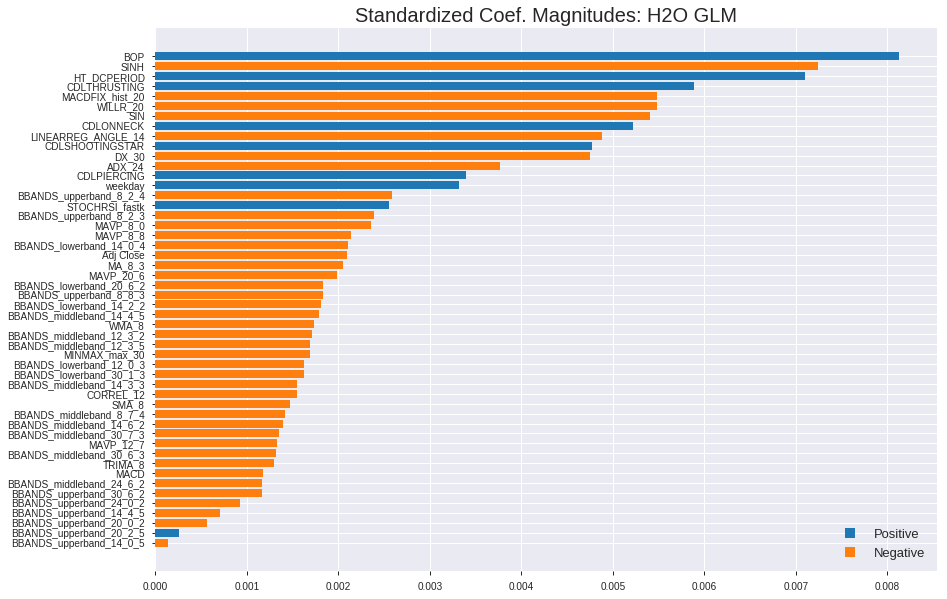

'log_likelihood'
--2019-08-27 21:29:59--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.187.91
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.187.91|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


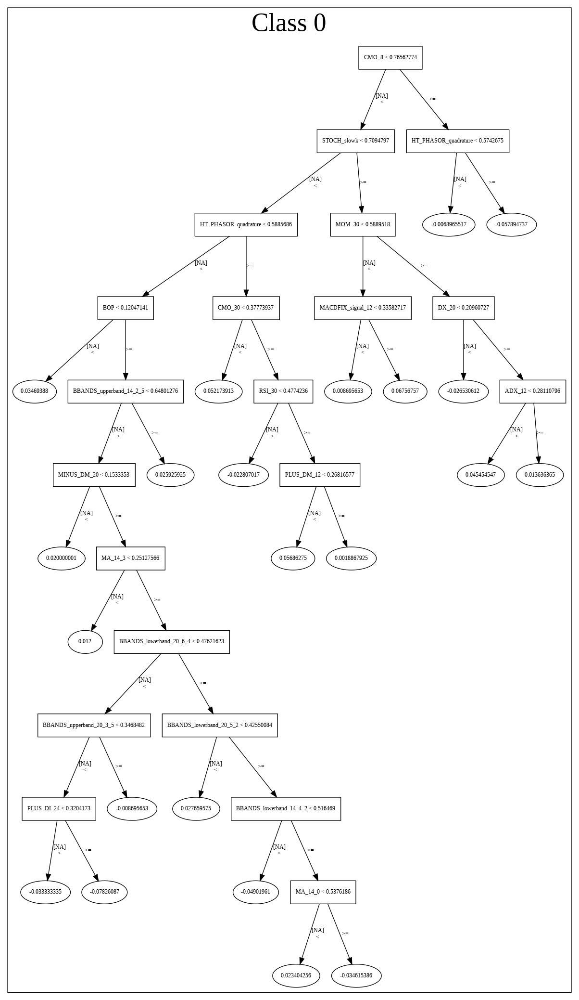

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190827_212953_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190827_212953_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_58_sid_8014',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_58_s

['BOP',
 'SINH',
 'HT_DCPERIOD',
 'CDLTHRUSTING',
 'MACDFIX_hist_20',
 'WILLR_20',
 'SIN',
 'CDLONNECK',
 'LINEARREG_ANGLE_14',
 'CDLSHOOTINGSTAR',
 'DX_30',
 'ADX_24',
 'CDLPIERCING',
 'weekday',
 'BBANDS_upperband_8_2_4',
 'STOCHRSI_fastk',
 'BBANDS_upperband_8_2_3',
 'MAVP_8_0',
 'MAVP_8_8',
 'BBANDS_lowerband_14_0_4',
 'Adj Close',
 'MA_8_3',
 'MAVP_20_6',
 'BBANDS_lowerband_20_6_2',
 'BBANDS_upperband_8_8_3',
 'BBANDS_lowerband_14_2_2',
 'BBANDS_middleband_14_4_5',
 'WMA_8',
 'BBANDS_middleband_12_3_2',
 'BBANDS_middleband_12_3_5',
 'MINMAX_max_30',
 'BBANDS_lowerband_12_0_3',
 'BBANDS_lowerband_30_1_3',
 'BBANDS_middleband_14_3_3',
 'CORREL_12',
 'SMA_8',
 'BBANDS_middleband_8_7_4',
 'BBANDS_middleband_14_6_2',
 'BBANDS_middleband_30_7_3',
 'MAVP_12_7',
 'BBANDS_middleband_30_6_3',
 'TRIMA_8',
 'MACD',
 'BBANDS_middleband_24_6_2',
 'BBANDS_upperband_30_6_2',
 'BBANDS_upperband_24_0_2',
 'BBANDS_upperband_14_4_5',
 'BBANDS_upperband_20_0_2',
 'BBANDS_upperband_20_2_5',
 'BBANDS_up

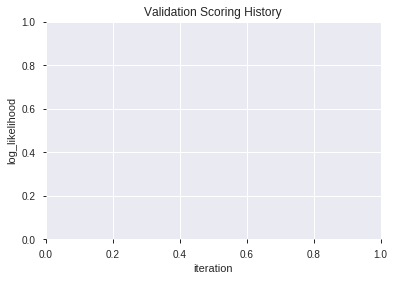

In [21]:
# GLM with top XGBoost features
model_train(feature_name='XGBF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_1_AutoML_20190827_213005,0.525226,0.721621,0.487903,0.513326,0.263503
1,XGBoost_grid_1_AutoML_20190827_213005_model_1,0.508742,0.764573,0.495968,0.531472,0.282462
2,XGBoost_grid_1_AutoML_20190827_213005_model_2,0.508065,0.698103,0.491935,0.502448,0.252454
3,XGBoost_grid_1_AutoML_20190827_213005_model_6,0.507290,0.740825,0.495968,0.521740,0.272212
4,XGBoost_grid_1_AutoML_20190827_213005_model_5,0.506645,0.782109,0.500000,0.537551,0.288961
5,XGBoost_2_AutoML_20190827_213005,0.501484,0.711522,0.495935,0.508790,0.258867
6,XGBoost_grid_1_AutoML_20190827_213005_model_3,0.488581,0.714618,0.495968,0.510166,0.260269
7,XGBoost_grid_1_AutoML_20190827_213005_model_4,0.484258,0.701465,0.475774,0.504104,0.254121
8,XGBoost_3_AutoML_20190827_213005,0.483935,0.733802,0.500000,0.518629,0.268976
9,XGBoost_grid_1_AutoML_20190827_213005_model_7,0.471935,0.775632,0.500000,0.536111,0.287415


,variable,relative_importance,scaled_importance,percentage
0,HT_DCPERIOD,467.513184,1.000000,0.074531
1,CORREL_12,436.839264,0.934389,0.069641
2,SIN,424.157745,0.907264,0.067619
3,MACDFIX_hist_20,413.997955,0.885532,0.065999
4,BOP,395.103210,0.845117,0.062987
5,WILLR_20,381.656097,0.816354,0.060843
6,DX_30,350.292694,0.749268,0.055844
7,LINEARREG_ANGLE_14,331.115204,0.708248,0.052786
8,STOCHRSI_fastk,314.436005,0.672571,0.050127
9,MACD,283.317230,0.606009,0.045166


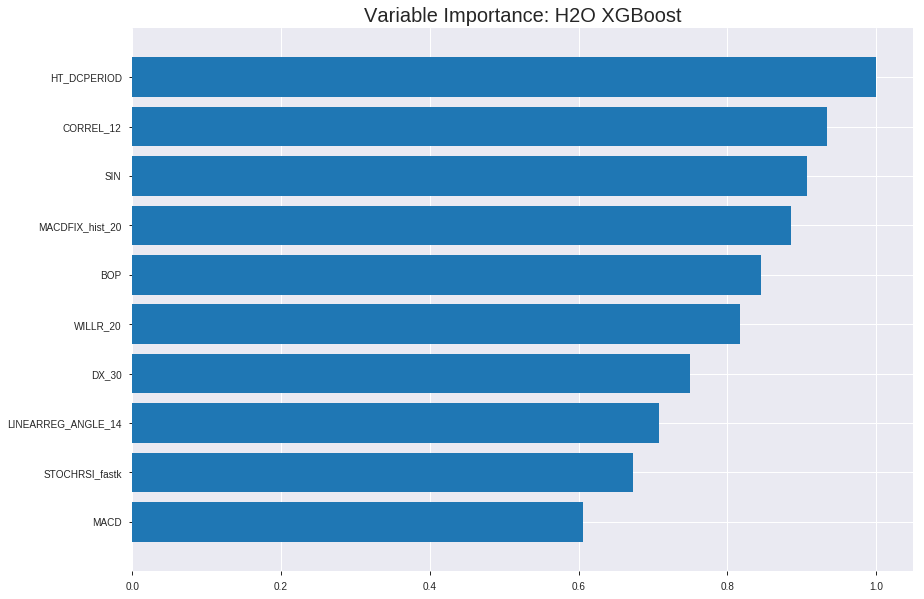

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_1_AutoML_20190827_213005


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.17069130504177446
RMSE: 0.41314804252443754
LogLoss: 0.5289466943655724
Mean Per-Class Error: 0.129067787662012
AUC: 0.94211981627643
pr_auc: 0.9408111887323011
Gini: 0.8842396325528601
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4918169130881627: 


,0,1,Error,Rate
0,717.0,143.0,0.1663,(143.0/860.0)
1,87.0,794.0,0.0988,(87.0/881.0)
Total,804.0,937.0,0.1321,(230.0/1741.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4918169,0.8734873,210.0
max f2,0.4399316,0.9171471,252.0
max f0point5,0.5387077,0.8863223,170.0
max accuracy,0.5099789,0.8707639,195.0
max precision,0.8092169,1.0,0.0
max recall,0.2984940,1.0,360.0
max specificity,0.8092169,1.0,0.0
max absolute_mcc,0.5099789,0.7419437,195.0
max min_per_class_accuracy,0.5071499,0.8671964,198.0
max mean_per_class_accuracy,0.5099789,0.8709322,195.0


Gains/Lift Table: Avg response rate: 50.60 %, avg score: 50.40 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103389,0.7495232,1.9761635,1.9761635,1.0,0.7735041,1.0,0.7735041,0.0204313,0.0204313,97.6163451,97.6163451
,2,0.0201034,0.7349508,1.9761635,1.9761635,1.0,0.7410185,1.0,0.7577254,0.0192963,0.0397276,97.6163451,97.6163451
,3,0.0304423,0.7242276,1.9761635,1.9761635,1.0,0.7292916,1.0,0.7480686,0.0204313,0.0601589,97.6163451,97.6163451
,4,0.0402068,0.7121892,1.9761635,1.9761635,1.0,0.7164218,1.0,0.7403830,0.0192963,0.0794552,97.6163451,97.6163451
,5,0.0505457,0.7020588,1.9761635,1.9761635,1.0,0.7078185,1.0,0.7337221,0.0204313,0.0998865,97.6163451,97.6163451
,6,0.1005169,0.6691208,1.9307344,1.9535787,0.9770115,0.6843410,0.9885714,0.7091726,0.0964813,0.1963678,93.0734406,95.3578725
,7,0.1504882,0.6450418,1.9307344,1.9459930,0.9770115,0.6565999,0.9847328,0.6917153,0.0964813,0.2928490,93.0734406,94.5993016
,8,0.2004595,0.6251515,1.8853054,1.9308646,0.9540230,0.6359794,0.9770774,0.6778212,0.0942111,0.3870602,88.5305361,93.0864575
,9,0.3004021,0.5858297,1.8398763,1.9005931,0.9310345,0.6057794,0.9617591,0.6538532,0.1838820,0.5709421,83.9876316,90.0593147
,10,0.4003446,0.5497437,1.6354456,1.8344014,0.8275862,0.5662886,0.9282640,0.6319934,0.1634506,0.7343927,63.5445614,83.4401367




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.27566027867628784
RMSE: 0.5250335976642713
LogLoss: 0.7475745039290512
Mean Per-Class Error: 0.44226406533575313
AUC: 0.5300508815141302
pr_auc: 0.5605899064247039
Gini: 0.06010176302826031
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2736492455005646: 


,0,1,Error,Rate
0,10.0,222.0,0.9569,(222.0/232.0)
1,3.0,263.0,0.0113,(3.0/266.0)
Total,13.0,485.0,0.4518,(225.0/498.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2736492,0.7003995,387.0
max f2,0.2385670,0.8520179,398.0
max f0point5,0.2736492,0.5961015,387.0
max accuracy,0.3740831,0.5522088,184.0
max precision,0.5289281,0.875,7.0
max recall,0.2385670,1.0,398.0
max specificity,0.5611503,0.9956897,0.0
max absolute_mcc,0.3856974,0.1179043,161.0
max min_per_class_accuracy,0.3660684,0.5301724,203.0
max mean_per_class_accuracy,0.3856974,0.5577359,161.0


Gains/Lift Table: Avg response rate: 53.41 %, avg score: 37.28 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100402,0.5405846,1.4977444,1.4977444,0.8,0.5485030,0.8,0.5485030,0.0150376,0.0150376,49.7744361,49.7744361
,2,0.0200803,0.5247393,1.1233083,1.3105263,0.6,0.5316408,0.7,0.5400719,0.0112782,0.0263158,12.3308271,31.0526316
,3,0.0301205,0.5108092,0.3744361,0.9984962,0.2,0.5218857,0.5333333,0.5340098,0.0037594,0.0300752,-62.5563910,-0.1503759
,4,0.0401606,0.5030119,0.3744361,0.8424812,0.2,0.5066153,0.45,0.5271612,0.0037594,0.0338346,-62.5563910,-15.7518797
,5,0.0502008,0.4939577,1.8721805,1.0484211,1.0,0.4976555,0.56,0.5212601,0.0187970,0.0526316,87.2180451,4.8421053
,6,0.1004016,0.4632738,0.9735338,1.0109774,0.52,0.4772261,0.54,0.4992431,0.0488722,0.1015038,-2.6466165,1.0977444
,7,0.1506024,0.4471279,1.2730827,1.0983459,0.68,0.4548518,0.5866667,0.4844460,0.0639098,0.1654135,27.3082707,9.8345865
,8,0.2008032,0.4251012,0.8986466,1.0484211,0.48,0.4371065,0.56,0.4726111,0.0451128,0.2105263,-10.1353383,4.8421053
,9,0.3012048,0.4004412,1.1607519,1.0858647,0.62,0.4114044,0.58,0.4522089,0.1165414,0.3270677,16.0751880,8.5864662
,10,0.3995984,0.3843637,1.2226485,1.1195451,0.6530612,0.3924231,0.5979899,0.4374878,0.1203008,0.4473684,22.2648458,11.9545094



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-27 21:30:05,0.005 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4939690,0.5,0.6931472,0.5,0.0,1.0,0.4658635
,2019-08-27 21:30:05,0.151 sec,5.0,0.4892684,0.6718733,0.7610485,0.7558492,1.9761635,0.3469271,0.5001045,0.6933570,0.4986226,0.5352578,0.6240602,0.4658635
,2019-08-27 21:30:06,0.241 sec,10.0,0.4788465,0.6515363,0.8191649,0.8220956,1.9761635,0.2665135,0.5035047,0.7002243,0.5014260,0.5588196,1.4977444,0.4658635
,2019-08-27 21:30:06,0.333 sec,15.0,0.4679200,0.6305236,0.8623664,0.8670895,1.9761635,0.2263067,0.5097865,0.7132066,0.5184810,0.5635245,1.4977444,0.4658635
,2019-08-27 21:30:06,0.418 sec,20.0,0.4589297,0.6134509,0.8846382,0.8878655,1.9761635,0.2016083,0.5111891,0.7161770,0.5302777,0.5631423,1.4977444,0.4477912
,2019-08-27 21:30:06,0.515 sec,25.0,0.4496487,0.5959994,0.9040929,0.9059934,1.9761635,0.1860999,0.5142298,0.7227391,0.5279686,0.5666268,1.4977444,0.4638554
,2019-08-27 21:30:06,0.595 sec,30.0,0.4431804,0.5839082,0.9097339,0.9118530,1.9761635,0.1746123,0.5162422,0.7271820,0.5227265,0.5663424,1.4977444,0.4658635
,2019-08-27 21:30:06,0.702 sec,35.0,0.4338355,0.5665636,0.9202657,0.9224673,1.9761635,0.1671453,0.5158046,0.7263064,0.5328218,0.5637464,1.1233083,0.4357430
,2019-08-27 21:30:06,0.787 sec,40.0,0.4273357,0.5545747,0.9258421,0.9270590,1.9761635,0.1522114,0.5195271,0.7346560,0.5242740,0.5537699,1.4977444,0.4598394
,2019-08-27 21:30:06,0.885 sec,45.0,0.4206190,0.5423459,0.9338193,0.9322375,1.9761635,0.1458932,0.5211294,0.7383219,0.5269640,0.5565931,1.4977444,0.4518072


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
HT_DCPERIOD,467.5131836,1.0,0.0745308
CORREL_12,436.8392639,0.9343892,0.0696408
SIN,424.1577454,0.9072637,0.0676191
MACDFIX_hist_20,413.9979553,0.8855322,0.0659994
BOP,395.1032104,0.8451167,0.0629872
---,---,---,---
BBANDS_middleband_14_4_5,30.8120747,0.0659063,0.0049120
WMA_8,27.2480659,0.0582830,0.0043439
BBANDS_lowerband_14_2_2,23.5244865,0.0503183,0.0037503
MAVP_12_7,3.0572522,0.0065394,0.0004874



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5502008032128514)

('F1', 0.6738544474393531)

('auc', 0.5252258064516129)

('logloss', 0.7216208175610663)

('mean_per_class_error', 0.4499354838709677)

('rmse', 0.5133255719824298)

('mse', 0.26350314285108867)

xgboost prediction progress: |████████████████████████████████████████████| 100%


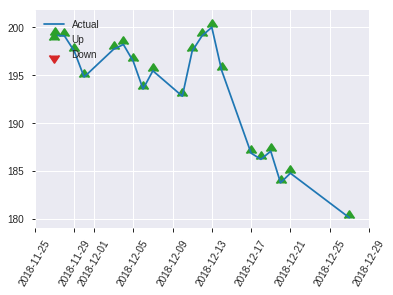


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.26350314285108867
RMSE: 0.5133255719824298
LogLoss: 0.7216208175610663
Mean Per-Class Error: 0.4499354838709677
AUC: 0.5252258064516129
pr_auc: 0.5269406483979644
Gini: 0.05045161290322575
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.26044565439224243: 


,0,1,Error,Rate
0,3.0,121.0,0.9758,(121.0/124.0)
1,0.0,125.0,0.0,(0.0/125.0)
Total,3.0,246.0,0.4859,(121.0/249.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2604457,0.6738544,245.0
max f2,0.2604457,0.8378016,245.0
max f0point5,0.3591175,0.5642257,176.0
max accuracy,0.3857927,0.5502008,132.0
max precision,0.5101424,1.0,0.0
max recall,0.2604457,1.0,245.0
max specificity,0.5101424,1.0,0.0
max absolute_mcc,0.4712377,0.1171371,14.0
max min_per_class_accuracy,0.3922455,0.544,123.0
max mean_per_class_accuracy,0.3857927,0.5500645,132.0


Gains/Lift Table: Avg response rate: 50.20 %, avg score: 38.58 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0120482,0.4964655,1.3280000,1.3280000,0.6666667,0.5026522,0.6666667,0.5026522,0.016,0.016,32.8000000,32.8000000
,2,0.0200803,0.4859640,1.992,1.5936,1.0,0.4910424,0.8,0.4980083,0.016,0.032,99.2,59.3600000
,3,0.0321285,0.4830400,0.6640000,1.2450000,0.3333333,0.4844987,0.625,0.4929422,0.008,0.04,-33.6000000,24.5000000
,4,0.0401606,0.4776829,0.996,1.1952000,0.5,0.4814156,0.6,0.4906369,0.008,0.048,-0.4000000,19.5200000
,5,0.0522088,0.4752209,1.992,1.3790769,1.0,0.4769738,0.6923077,0.4874839,0.024,0.072,99.2,37.9076923
,6,0.1004016,0.4557168,0.83,1.11552,0.4166667,0.4648549,0.56,0.4766220,0.04,0.112,-17.0000000,11.5520000
,7,0.1526104,0.4399494,0.6129231,0.9435789,0.3076923,0.4470447,0.4736842,0.4665034,0.032,0.144,-38.7076923,-5.6421053
,8,0.2008032,0.4308003,0.996,0.9561600,0.5,0.4343537,0.48,0.4587875,0.048,0.192,-0.4000000,-4.3840000
,9,0.3012048,0.4169312,1.03584,0.9827200,0.52,0.4240939,0.4933333,0.4472229,0.104,0.296,3.5840000,-1.7280000
,10,0.4016064,0.4025732,1.03584,0.996,0.52,0.4098391,0.5,0.4378770,0.104,0.4,3.5840000,-0.4000000


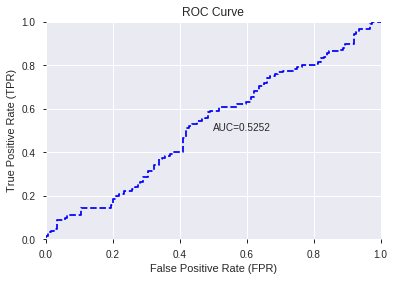

This function is available for GLM models only


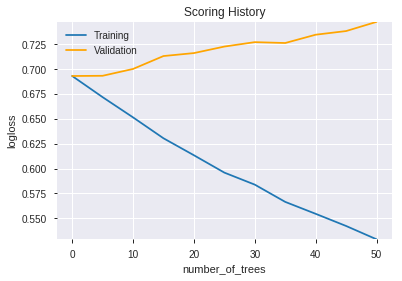

--2019-08-27 21:30:23--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.17.72
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.17.72|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:112)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.

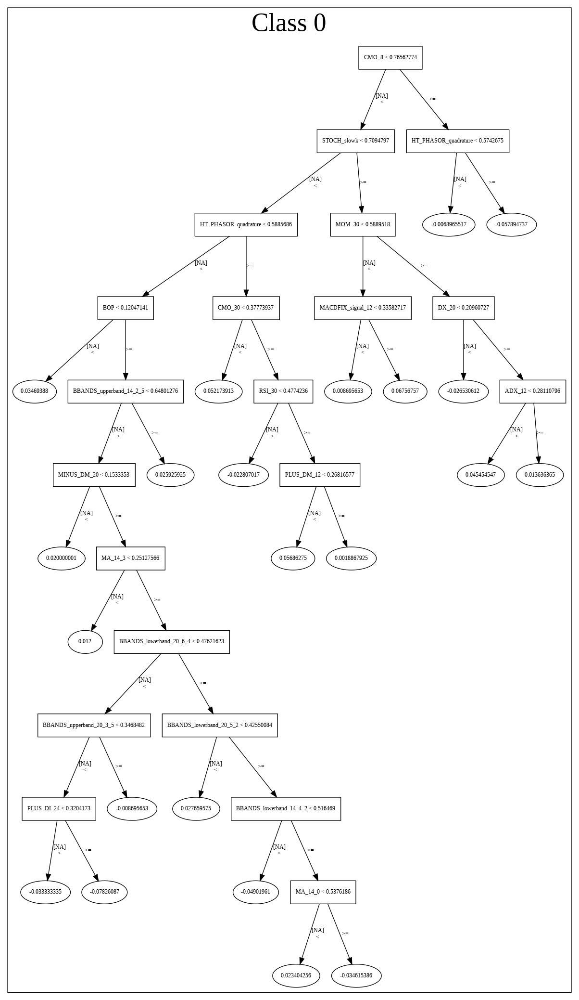

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_1_AutoML_20190827_213005',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_1_AutoML_20190827_213005',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_66_sid_8014',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_66_sid_8014',
   'type

['HT_DCPERIOD',
 'CORREL_12',
 'SIN',
 'MACDFIX_hist_20',
 'BOP',
 'WILLR_20',
 'DX_30',
 'LINEARREG_ANGLE_14',
 'STOCHRSI_fastk',
 'MACD',
 'ADX_24',
 'BBANDS_lowerband_30_1_3',
 'BBANDS_upperband_14_4_5',
 'weekday',
 'BBANDS_lowerband_14_0_4',
 'BBANDS_upperband_14_0_5',
 'BBANDS_upperband_8_2_4',
 'BBANDS_upperband_20_2_5',
 'BBANDS_upperband_30_6_2',
 'AdjClose',
 'BBANDS_middleband_14_6_2',
 'BBANDS_middleband_30_6_3',
 'BBANDS_upperband_24_0_2',
 'BBANDS_lowerband_12_0_3',
 'TRIMA_8',
 'MAVP_8_0',
 'BBANDS_lowerband_20_6_2',
 'BBANDS_upperband_8_2_3',
 'BBANDS_middleband_24_6_2',
 'MA_8_3',
 'BBANDS_upperband_8_8_3',
 'BBANDS_upperband_20_0_2',
 'BBANDS_middleband_8_7_4',
 'MAVP_20_6',
 'MINMAX_max_30',
 'BBANDS_middleband_14_3_3',
 'MAVP_8_8',
 'BBANDS_middleband_12_3_2',
 'SMA_8',
 'BBANDS_middleband_14_4_5',
 'WMA_8',
 'BBANDS_lowerband_14_2_2',
 'MAVP_12_7',
 'BBANDS_middleband_12_3_5']

In [22]:
# XGBoost with top XGBoost features
model_train(feature_name='XGBF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

In [0]:
# PCA
try:
  del xgb_features,glm_features,dl_features
except:
  pass
gc.collect()

if features_to_include is True or 'PCA' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.pca import H2OPrincipalComponentAnalysisEstimator
      h2o_model = H2OPrincipalComponentAnalysisEstimator(seed=1, k=PCA_k, pca_method="GramSVD", max_iterations=10000)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OPrincipalComponentAnalysisEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [24]:
# DeepLearning with PCA
model_train(feature_name='PCA',model_algo="DeepLearning",training_frame=training_frame)

[]

In [25]:
# GLM with PCA
model_train(feature_name='PCA',model_algo="GLM",training_frame=training_frame)

[]

In [26]:
# XGBoost with PCA
model_train(feature_name='PCA',model_algo="XGBoost",training_frame=training_frame)

[]

In [0]:
# Generalized Low Rank
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'GLRM' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.glrm import H2OGeneralizedLowRankEstimator

      h2o_model = H2OGeneralizedLowRankEstimator(seed=1, k=GLRM_k)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OGeneralizedLowRankEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [28]:
# DeepLearning with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="DeepLearning",training_frame=training_frame)

[]

In [29]:
# GLM with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="GLM",training_frame=training_frame)

[]

In [30]:
# XGBoost with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="XGBoost",training_frame=training_frame)

[]

In [0]:
# High Correlation Filter 
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'HCF' in features_to_include:
  corr_matrix = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).corr().abs()

  upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

  features_list = [column for column in upper.columns if not any(upper[column] > HCF_threshold)]

  del corr_matrix, upper
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [32]:
# DeepLearning with low correlation features
model_train(feature_name='HCF',model_algo="DeepLearning",features_list=features_list)

[]

In [33]:
# GLM with low correlation features
model_train(feature_name='HCF',model_algo="GLM",features_list=features_list)

[]

In [34]:
# XGBoost with low correlation features
model_train(feature_name='HCF',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
#	Low Variance Filter  
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'LVF' in features_to_include:
  df_variance = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).var()
  features_list = [column for column in df_variance.index if df_variance[column]  > LVF_threshold]

  del df_variance
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [36]:
# DeepLearning with Low Variance features  
model_train(feature_name='LVF',model_algo="DeepLearning",features_list=features_list)

[]

In [37]:
# GLM with Low Variance features  
model_train(feature_name='LVF',model_algo="GLM",features_list=features_list)

[]

In [38]:
# XGBoost with Low Variance features  
model_train(feature_name='LVF',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
# Select k best features
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'KBest' in features_to_include:
  from sklearn.feature_selection import SelectKBest
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectKBest(score_func=f_classif, k=select_k).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectKBest, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [40]:
# DeepLearning with Select k best features 
model_train(feature_name='KBest',model_algo="DeepLearning",features_list=features_list)

[]

In [41]:
# GLM with Select k best features
model_train(feature_name='KBest',model_algo="GLM",features_list=features_list)

[]

In [42]:
# XGBoost with Select k best features
model_train(feature_name='KBest',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
# Select Percentile
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Percentile' in features_to_include:
  from sklearn.feature_selection import SelectPercentile
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectPercentile(score_func=f_classif, percentile=select_percentile).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectPercentile, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [44]:
# DeepLearning with Select Percentile features  
model_train(feature_name='Percentile',model_algo="DeepLearning",features_list=features_list)

[]

In [45]:
# GLM with Select Percentile features  
model_train(feature_name='Percentile',model_algo="GLM",features_list=features_list)

[]

In [46]:
# XGBoost with Select Percentile features  
model_train(feature_name='Percentile',model_algo="XGBoost",features_list=features_list)

[]

In [47]:
# Select Family-wise error
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Fwe' in features_to_include:
  from sklearn.feature_selection import SelectFwe
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectFwe(score_func=f_classif, alpha=select_alpha).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectFwe, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:114: UserWarning: Features [906 929] are constant.
  UserWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:115: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:721: RuntimeWarning: invalid value encountered in less
  return (self.pvalues_ < self.alpha / len(self.pvalues_))


0

[]

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_1_AutoML_20190827_213031,0.5,17.200033,0.5,0.705685,0.497992
1,DeepLearning_grid_1_AutoML_20190827_213031_model_9,0.5,0.696561,0.5,0.501697,0.251700
2,DeepLearning_grid_1_AutoML_20190827_213031_model_2,0.5,17.200033,0.5,0.705685,0.497992
3,DeepLearning_grid_1_AutoML_20190827_213031_model_1,0.5,17.200033,0.5,0.705685,0.497992
4,DeepLearning_grid_1_AutoML_20190827_213031_model_4,0.5,17.200033,0.5,0.705685,0.497992
5,DeepLearning_grid_1_AutoML_20190827_213031_model_3,0.5,17.200033,0.5,0.705685,0.497992
6,DeepLearning_grid_1_AutoML_20190827_213031_model_5,0.5,0.694121,0.5,0.500486,0.250486
7,DeepLearning_grid_1_AutoML_20190827_213031_model_6,0.5,0.694329,0.5,0.500590,0.250590
8,DeepLearning_grid_1_AutoML_20190827_213031_model_8,0.5,0.695199,0.5,0.501022,0.251023
9,DeepLearning_grid_1_AutoML_20190827_213031_model_7,0.5,17.200033,0.5,0.705685,0.497992


,variable,relative_importance,scaled_importance,percentage
0,CDLHIKKAKEMOD,1.000000,1.000000,0.002380
1,CDLSTICKSANDWICH,0.857807,0.857807,0.002042
2,BETA_12,0.801969,0.801969,0.001909
3,OBV,0.704786,0.704786,0.001677
4,CDLLONGLINE,0.692336,0.692336,0.001648
5,DX_12,0.675786,0.675786,0.001608
6,CDLMORNINGDOJISTAR,0.674774,0.674774,0.001606
7,HT_DCPERIOD,0.671822,0.671822,0.001599
8,EXP,0.666096,0.666096,0.001585
9,HT_PHASOR_quadrature,0.662286,0.662286,0.001576


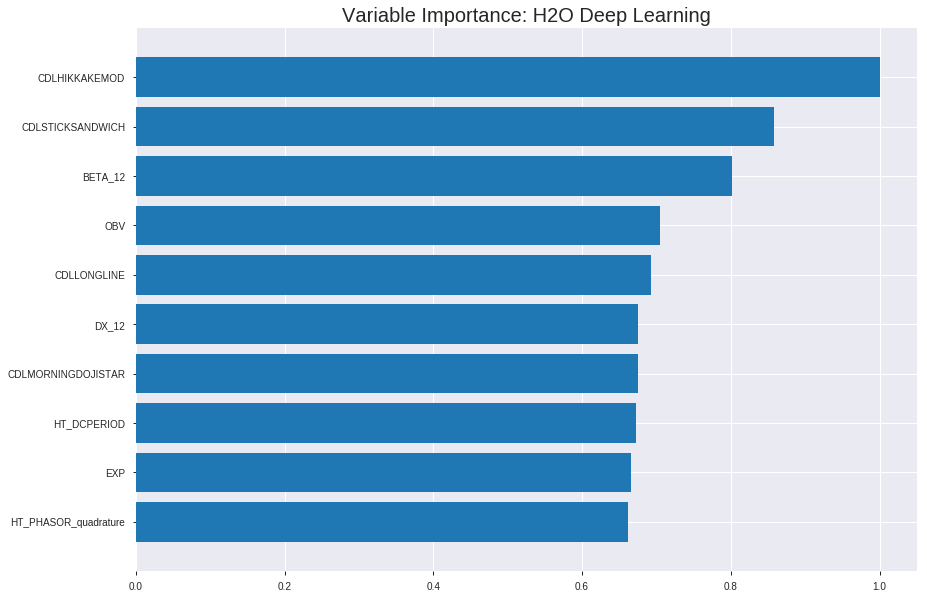

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_1_AutoML_20190827_213031


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.23775032953863143
RMSE: 0.48759648228697405
LogLoss: 0.6641986063467015
Mean Per-Class Error: 0.43530343425811047
AUC: 0.5975886281445503
pr_auc: 0.620840144299456
Gini: 0.19517725628910054
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4057559640085467: 


,0,1,Error,Rate
0,85.0,775.0,0.9012,(775.0/860.0)
1,22.0,859.0,0.025,(22.0/881.0)
Total,107.0,1634.0,0.4578,(797.0/1741.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4057560,0.6831014,324.0
max f2,0.3022293,0.8421153,364.0
max f0point5,0.4277027,0.5811568,309.0
max accuracy,0.4778941,0.5640437,246.0
max precision,0.9996110,1.0,0.0
max recall,0.2328679,1.0,377.0
max specificity,0.9996110,1.0,0.0
max absolute_mcc,0.6876839,0.1698348,79.0
max min_per_class_accuracy,0.4778941,0.4988372,246.0
max mean_per_class_accuracy,0.4881097,0.5646966,233.0


Gains/Lift Table: Avg response rate: 50.60 %, avg score: 49.00 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103389,0.9121440,1.9761635,1.9761635,1.0,0.9635779,1.0,0.9635779,0.0204313,0.0204313,97.6163451,97.6163451
,2,0.0201034,0.8489908,1.9761635,1.9761635,1.0,0.8779043,1.0,0.9219650,0.0192963,0.0397276,97.6163451,97.6163451
,3,0.0304423,0.7995785,1.5370160,1.8270190,0.7777778,0.8253107,0.9245283,0.8891390,0.0158910,0.0556186,53.7016017,82.7019039
,4,0.0402068,0.7562149,1.3949389,1.7220853,0.7058824,0.7769752,0.8714286,0.8618992,0.0136209,0.0692395,39.4938906,72.2085293
,5,0.0505457,0.7085192,1.6468029,1.7066866,0.8333333,0.7342880,0.8636364,0.8357969,0.0170261,0.0862656,64.6802876,70.6686616
,6,0.1005169,0.6147526,1.0448680,1.3776682,0.5287356,0.6542946,0.6971429,0.7455643,0.0522134,0.1384790,4.4868031,37.7668234
,7,0.1504882,0.5644231,1.1130116,1.2897861,0.5632184,0.5920575,0.6526718,0.6945907,0.0556186,0.1940976,11.3011599,28.9786069
,8,0.2004595,0.5224752,1.1357261,1.2513814,0.5747126,0.5434770,0.6332378,0.6569205,0.0567537,0.2508513,13.5726121,25.1381440
,9,0.5634693,0.4778953,1.0349843,1.1119696,0.5237342,0.4822516,0.5626911,0.5443917,0.3757094,0.6265607,3.4984339,11.1969648
,10,0.6002298,0.4593197,0.7719388,1.0911448,0.390625,0.4685324,0.5521531,0.5397458,0.0283768,0.6549376,-22.8061152,9.1144795




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.47175079259479885
RMSE: 0.6868411698455466
LogLoss: 15.660427159388536
Mean Per-Class Error: 0.5
AUC: 0.48504342753435314
pr_auc: 0.033832581360505286
Gini: -0.02991314493129371
Confusion Matrix (Act/Pred) for max f1 @ threshold = 1.1199683716667143e-06: 


,0,1,Error,Rate
0,0.0,232.0,1.0,(232.0/232.0)
1,0.0,266.0,0.0,(0.0/266.0)
Total,0.0,498.0,0.4659,(232.0/498.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0000011,0.6963351,21.0
max f2,0.0000011,0.8514725,21.0
max f0point5,0.0000011,0.5890168,21.0
max accuracy,0.0000011,0.5341365,21.0
max precision,0.0000011,0.5341365,21.0
max recall,0.0000011,1.0,21.0
max specificity,1.0000000,0.0344828,0.0
max absolute_mcc,0.9956151,0.0904279,2.0
max min_per_class_accuracy,1.0000000,0.0344828,0.0
max mean_per_class_accuracy,0.0000011,0.5,21.0


Gains/Lift Table: Avg response rate: 53.41 %, avg score: 96.96 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.9477912,1.0,0.9836880,0.9836880,0.5254237,1.0,0.5254237,1.0,0.9323308,0.9323308,-1.6311966,-1.6311966
,2,1.0,0.0000011,1.2961249,1.0,0.6923077,0.4172714,0.5341365,0.9695764,0.0676692,1.0,29.6124928,0.0



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-27 21:30:31,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-27 21:30:31,0.375 sec,8576 obs/sec,1.0,1,1741.0,0.5609054,1.0406035,-0.2586428,0.5298458,0.5148411,1.2076554,0.4933946,0.6813435,15.7508714,-0.8656120,0.4880898,0.0239286,0.9870073,0.4658635
,2019-08-27 21:30:33,2.256 sec,8960 obs/sec,10.0,10,17410.0,0.4875965,0.6641986,0.0488603,0.5975886,0.6208401,1.9761635,0.4577829,0.6868412,15.6604272,-0.8958401,0.4850434,0.0338326,0.9836880,0.4658635


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLHIKKAKEMOD,1.0,1.0,0.0023801
CDLSTICKSANDWICH,0.8578068,0.8578068,0.0020416
BETA_12,0.8019687,0.8019687,0.0019087
OBV,0.7047857,0.7047857,0.0016774
CDLLONGLINE,0.6923358,0.6923358,0.0016478
---,---,---,---
MAVP_14_7,0.2006084,0.2006084,0.0004775
BBANDS_upperband_20_3_3,0.1849610,0.1849610,0.0004402
BBANDS_upperband_24_3_4,0.1745845,0.1745845,0.0004155
T3_8_5,0.1682519,0.1682519,0.0004005



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5020080321285141)

('F1', 0.6684491978609626)

('auc', 0.5)

('logloss', 17.20003322477479)

('mean_per_class_error', 0.5)

('rmse', 0.7056854595862706)

('mse', 0.4979919678714859)

deeplearning prediction progress: |███████████████████████████████████████| 100%


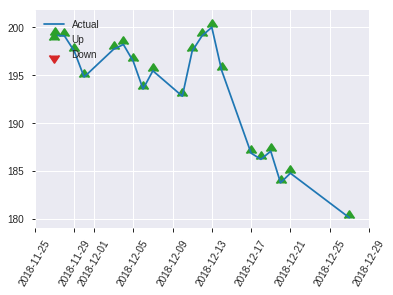


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.4979919678714859
RMSE: 0.7056854595862706
LogLoss: 17.20003322477479
Mean Per-Class Error: 0.5
AUC: 0.5
pr_auc: 0.0
Gini: 0.0
Confusion Matrix (Act/Pred) for max f1 @ threshold = 1.0: 


,0,1,Error,Rate
0,0.0,124.0,1.0,(124.0/124.0)
1,0.0,125.0,0.0,(0.0/125.0)
Total,0.0,249.0,0.498,(124.0/249.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,1.0,0.6684492,0.0
max f2,1.0,0.8344459,0.0
max f0point5,1.0,0.5575379,0.0
max accuracy,1.0,0.5020080,0.0
max precision,1.0,0.5020080,0.0
max recall,1.0,1.0,0.0
max specificity,1.0,0.0,0.0
max absolute_mcc,1.0,0.0,0.0
max min_per_class_accuracy,1.0,0.0,0.0
max mean_per_class_accuracy,1.0,0.5,0.0


Gains/Lift Table: Avg response rate: 50.20 %, avg score: 100.00 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,1.0,1.0,1.0,1.0,0.5020080,1.0,0.5020080,1.0,1.0,1.0,0.0,0.0


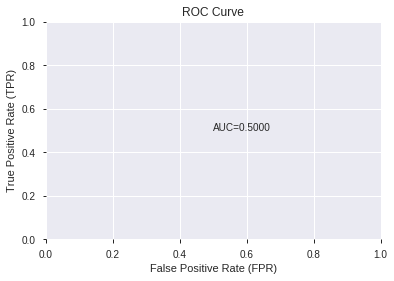

This function is available for GLM models only


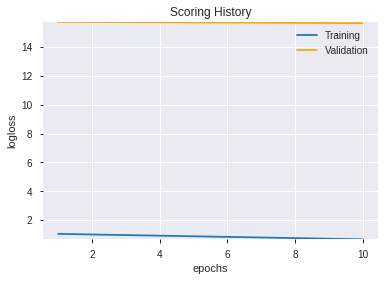

--2019-08-27 21:54:15--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.97.219
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.97.219|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


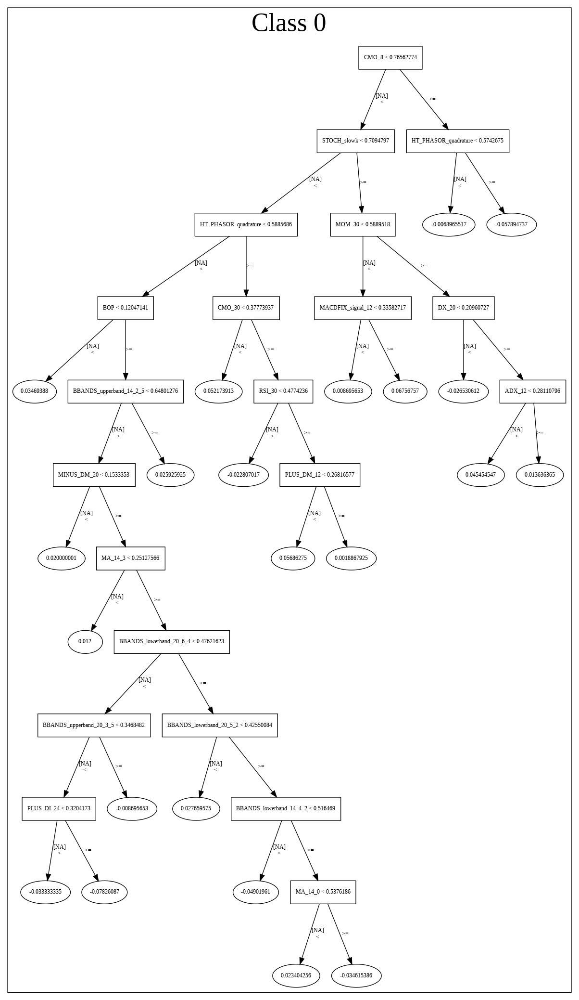

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_1_AutoML_20190827_213031',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_1_AutoML_20190827_213031',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_74_sid_8014',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_74_sid_8014'

['CDLHIKKAKEMOD',
 'CDLSTICKSANDWICH',
 'BETA_12',
 'OBV',
 'CDLLONGLINE',
 'DX_12',
 'CDLMORNINGDOJISTAR',
 'HT_DCPERIOD',
 'EXP',
 'HT_PHASOR_quadrature',
 'MFI_8',
 'SINH',
 'DX_24',
 'STOCHRSI_fastk',
 'MINUS_DI_20',
 'CDLSTALLEDPATTERN',
 'days_in_month',
 'BBANDS_upperband_12_0_2',
 'BBANDS_lowerband_30_7_3',
 'ROC_12',
 'aroonup_12',
 'weekofyear',
 'ADX_20',
 'COSH',
 'STDDEV_14',
 'BBANDS_lowerband_30_1_5',
 'BBANDS_lowerband_24_2_2',
 'DX_8',
 'BBANDS_upperband_8_1_4',
 'ROCR100_24',
 'WILLR_14',
 'CORREL_8',
 'LN',
 'BBANDS_middleband_8_4_3',
 'BBANDS_lowerband_8_3_2',
 'BBANDS_lowerband_20_1_3',
 'dayofweek',
 'BBANDS_upperband_20_1_5',
 'BBANDS_lowerband_24_5_4',
 'dayofyear',
 'ROCP_14',
 'LINEARREG_ANGLE_30',
 'LINEARREG_ANGLE_12',
 'Volume',
 'MACDFIX_hist_20',
 'aroonup_20',
 'CDL2CROWS',
 'HT_TRENDMODE',
 'MINUS_DI_24',
 'MACDEXT_hist',
 'BBANDS_upperband_12_7_5',
 'ATAN',
 'month',
 'RSI_8',
 'BBANDS_upperband_30_1_5',
 'CDL3LINESTRIKE',
 'BBANDS_upperband_12_5_3',
 

In [48]:
# DeepLearning with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190827_215421_model_1,0.5,17.338743,0.5,0.708525,0.502008


,variable,relative_importance,scaled_importance,percentage
0,CDLSEPARATINGLINES,9.161442e-03,1.000000,1.310897e-02
1,CDLSHORTLINE,7.963941e-03,0.869289,1.139549e-02
2,CDLBELTHOLD,7.020694e-03,0.766331,1.004581e-02
3,CDLTASUKIGAP,6.811791e-03,0.743528,9.746893e-03
4,days_in_month,6.717513e-03,0.733237,9.611991e-03
5,COS,6.680404e-03,0.729187,9.558893e-03
6,CDLHIKKAKE,6.210018e-03,0.677843,8.885824e-03
7,BOP,5.641127e-03,0.615747,8.071806e-03
8,CDL3LINESTRIKE,5.500887e-03,0.600439,7.871139e-03
9,HT_PHASOR_inphase,5.266335e-03,0.574837,7.535522e-03


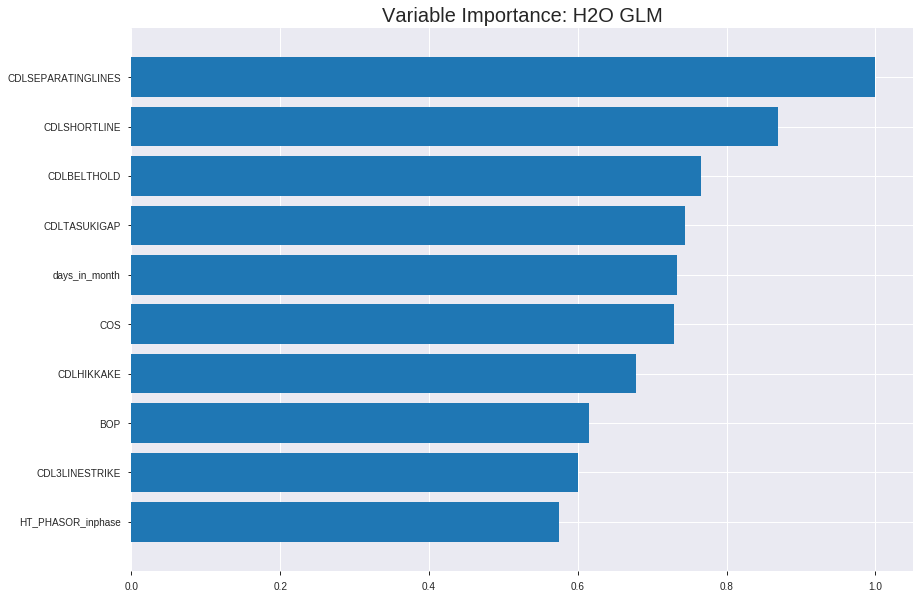

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190827_215421_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.24682373218184134
RMSE: 0.4968135789024303
LogLoss: 0.6867762883841955
Null degrees of freedom: 1740
Residual degrees of freedom: 703
Null deviance: 2413.285173867487
Residual deviance: 2391.355036153768
AIC: 4467.355036153768
AUC: 0.5828841432832669
pr_auc: 0.5825040040722278
Gini: 0.16576828656653375
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.45438143930714797: 


,0,1,Error,Rate
0,30.0,830.0,0.9651,(830.0/860.0)
1,12.0,869.0,0.0136,(12.0/881.0)
Total,42.0,1699.0,0.4836,(842.0/1741.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4543814,0.6736434,369.0
max f2,0.4068883,0.8368161,398.0
max f0point5,0.4841966,0.5767762,294.0
max accuracy,0.5053325,0.5680643,203.0
max precision,0.5884823,1.0,0.0
max recall,0.4068883,1.0,398.0
max specificity,0.5884823,1.0,0.0
max absolute_mcc,0.5053325,0.1361317,203.0
max min_per_class_accuracy,0.5053325,0.5675369,203.0
max mean_per_class_accuracy,0.5053325,0.5680708,203.0


Gains/Lift Table: Avg response rate: 50.60 %, avg score: 50.60 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103389,0.5667645,1.4272292,1.4272292,0.7222222,0.5745857,0.7222222,0.5745857,0.0147560,0.0147560,42.7229159,42.7229159
,2,0.0201034,0.5605820,1.3949389,1.4115453,0.7058824,0.5639196,0.7142857,0.5694051,0.0136209,0.0283768,39.4938906,41.1545322
,3,0.0304423,0.5555822,1.0978686,1.3050136,0.5555556,0.5584156,0.6603774,0.5656728,0.0113507,0.0397276,9.7868584,30.5013599
,4,0.0402068,0.5523725,1.5111838,1.3550835,0.7647059,0.5538109,0.6857143,0.5627921,0.0147560,0.0544835,51.1183815,35.5083509
,5,0.0505457,0.5481086,1.0978686,1.3024714,0.5555556,0.5497416,0.6590909,0.5601226,0.0113507,0.0658343,9.7868584,30.2471365
,6,0.1005169,0.5400202,1.2492987,1.2760370,0.6321839,0.5438130,0.6457143,0.5520144,0.0624291,0.1282633,24.9298733,27.6036971
,7,0.1504882,0.5341554,1.0675826,1.2068174,0.5402299,0.5365737,0.6106870,0.5468872,0.0533485,0.1816118,6.7582554,20.6817374
,8,0.2004595,0.5275717,1.2720133,1.2230696,0.6436782,0.5304805,0.6189112,0.5427973,0.0635641,0.2451759,27.2013256,22.3069643
,9,0.3004021,0.5194021,1.1243689,1.1902323,0.5689655,0.5229221,0.6022945,0.5361849,0.1123723,0.3575482,12.4368860,19.0232289
,10,0.4003446,0.5114921,1.0221535,1.1482729,0.5172414,0.5152781,0.5810617,0.5309657,0.1021566,0.4597049,2.2153509,14.8272880




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.518812302647738
RMSE: 0.7202862643753093
LogLoss: 17.304698285505637
Null degrees of freedom: 497
Residual degrees of freedom: -540
Null deviance: 689.626794400202
Residual deviance: 344342.1292087975
AIC: 346418.1292087975
AUC: 0.5120641042260824
pr_auc: 0.5821002141420386
Gini: 0.02412820845216479
Confusion Matrix (Act/Pred) for max f1 @ threshold = 2.1780733000425373e-60: 


,0,1,Error,Rate
0,0.0,232.0,1.0,(232.0/232.0)
1,0.0,266.0,0.0,(0.0/266.0)
Total,0.0,498.0,0.4659,(232.0/498.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0000000,0.6963351,34.0
max f2,0.0000000,0.8514725,34.0
max f0point5,0.0000000,0.5890168,34.0
max accuracy,0.0000000,0.5341365,34.0
max precision,0.5188764,1.0,0.0
max recall,0.0000000,1.0,34.0
max specificity,0.5188764,1.0,0.0
max absolute_mcc,0.0002777,0.0904279,22.0
max min_per_class_accuracy,0.0000000,0.0789474,29.0
max mean_per_class_accuracy,0.0000000,0.5200771,29.0


Gains/Lift Table: Avg response rate: 53.41 %, avg score:  1.61 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100402,0.4918501,1.1233083,1.1233083,0.6,0.5099940,0.6,0.5099940,0.0112782,0.0112782,12.3308271,12.3308271
,2,0.0200803,0.4504821,1.1233083,1.1233083,0.6,0.4721949,0.6,0.4910944,0.0112782,0.0225564,12.3308271,12.3308271
,3,0.0301205,0.3665485,1.8721805,1.3729323,1.0,0.4393726,0.7333333,0.4738538,0.0187970,0.0413534,87.2180451,37.2932331
,4,0.0401606,0.0193922,1.1233083,1.3105263,0.6,0.1817423,0.7,0.4008259,0.0112782,0.0526316,12.3308271,31.0526316
,5,0.0502008,0.0000002,1.1233083,1.2730827,0.6,0.0026291,0.68,0.3211866,0.0112782,0.0639098,12.3308271,27.3082707
,6,1.0,0.0,0.9855665,1.0,0.5264271,0.0000000,0.5341365,0.0161238,0.9360902,1.0,-1.4433547,0.0



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-27 21:54:25,0.000 sec,2,.29E1,1038,1.3735526,691.4500587
,2019-08-27 21:54:27,2.290 sec,4,.21E1,1040,1.3705753,692.2217845
,2019-08-27 21:54:29,4.562 sec,6,.15E1,1040,1.3670861,693.0614245
,2019-08-27 21:54:32,6.864 sec,8,.11E1,1040,1.3629971,693.9724618
,2019-08-27 21:54:34,9.163 sec,10,.81E0,1040,1.3583074,694.8986934


Could not find exact threshold 0.0; using closest threshold found 0.0.


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5020080321285141)

Could not find exact threshold 0.0; using closest threshold found 0.0.


('F1', 0.6684491978609626)

('auc', 0.5)

('logloss', 17.338743170135874)

Could not find exact threshold 0.0; using closest threshold found 0.0.


('mean_per_class_error', 0.5)

('rmse', 0.7085252515814197)

('mse', 0.5020080321285141)

glm prediction progress: |████████████████████████████████████████████████| 100%


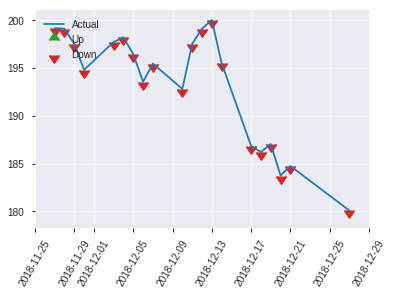


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.5020080321285141
RMSE: 0.7085252515814197
LogLoss: 17.338743170135874
Null degrees of freedom: 248
Residual degrees of freedom: -789
Null deviance: 345.1994009871195
Residual deviance: 177099.10463306593
AIC: 179175.10463306593
AUC: 0.5
pr_auc: 0.0
Gini: 0.0
Could not find exact threshold 0.0; using closest threshold found 0.0.
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.0: 


,0,1,Error,Rate
0,0.0,124.0,1.0,(124.0/124.0)
1,0.0,125.0,0.0,(0.0/125.0)
Total,0.0,249.0,0.498,(124.0/249.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0,0.6684492,0.0
max f2,0.0,0.8344459,0.0
max f0point5,0.0,0.5575379,0.0
max accuracy,0.0,0.5020080,0.0
max precision,0.0,0.5020080,0.0
max recall,0.0,1.0,0.0
max specificity,0.0,0.0,0.0
max absolute_mcc,0.0,0.0,0.0
max min_per_class_accuracy,0.0,0.0,0.0
max mean_per_class_accuracy,0.0,0.5,0.0


Gains/Lift Table: Avg response rate: 50.20 %, avg score:  0.00 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,1.0,0.0,1.0,1.0,0.5020080,0.0,0.5020080,0.0,1.0,1.0,0.0,0.0


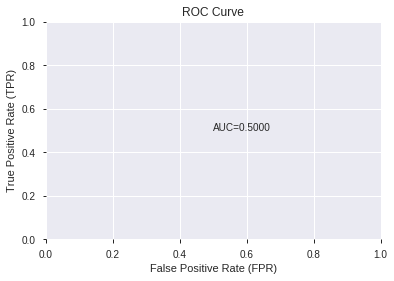

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


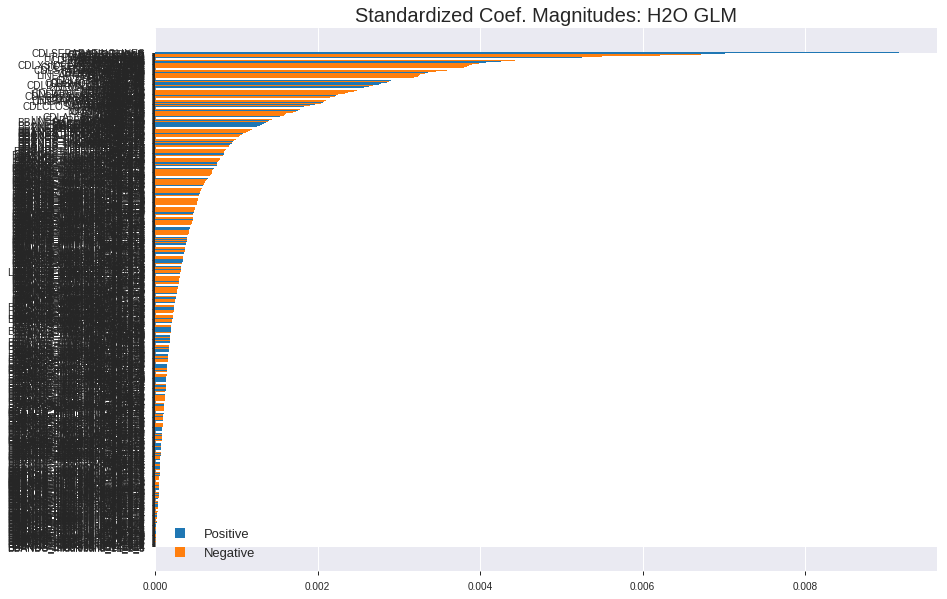

'log_likelihood'
--2019-08-27 21:55:00--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.144.75
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.144.75|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


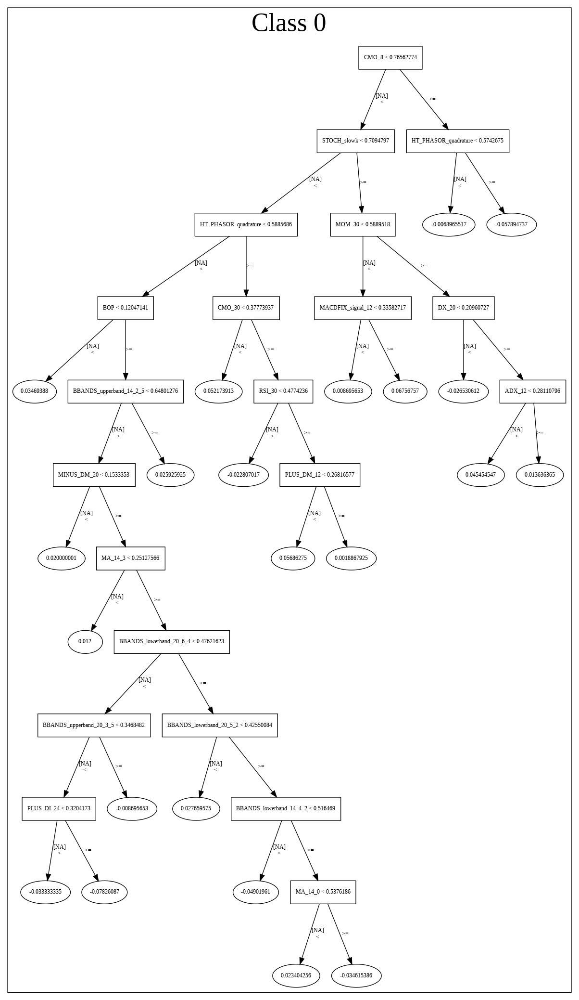

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190827_215421_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190827_215421_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_82_sid_8014',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_82_s

['CDLSEPARATINGLINES',
 'CDLSHORTLINE',
 'CDLBELTHOLD',
 'CDLTASUKIGAP',
 'days_in_month',
 'COS',
 'CDLHIKKAKE',
 'BOP',
 'CDL3LINESTRIKE',
 'HT_PHASOR_inphase',
 'is_month_end',
 'is_quarter_end',
 'STOCHF_fastd',
 'STOCH_slowk',
 'CDLHARAMICROSS',
 'VAR_20',
 'day',
 'PLUS_DI_8',
 'weekday_name',
 'STOCHRSI_fastk',
 'CDLTHRUSTING',
 'HT_DCPERIOD',
 'STDDEV_8',
 'TAN',
 'DIV',
 'CDLXSIDEGAP3METHODS',
 'VAR_14',
 'STOCH_slowd',
 'BETA_14',
 'CDLSTICKSANDWICH',
 'CDLDOJISTAR',
 'STOCHRSI_fastd',
 'MINUS_DI_8',
 'SIN',
 'aroondown_30',
 'CDLSTALLEDPATTERN',
 'VAR_8',
 'PLUS_DI_12',
 'aroonup_8',
 'CDLBREAKAWAY',
 'BETA_20',
 'CDLHIKKAKEMOD',
 'STDDEV_20',
 'CDLLONGLINE',
 'LINEARREG_ANGLE_8',
 'PLUS_DM_8',
 'EXP',
 'CDLONNECK',
 'SINH',
 'COSH',
 'PLUS_DI_14',
 'CORREL_20',
 'aroonup_12',
 'DX_30',
 'BETA_24',
 'OBV',
 'CCI_8',
 'CDLSPINNINGTOP',
 'ADX_24',
 'aroonup_24',
 'CCI_14',
 'MFI_30',
 'CDLMORNINGSTAR',
 'CDLSHOOTINGSTAR',
 'ULTOSC',
 'is_quarter_start',
 'VAR_24',
 'CDLDARKCLO

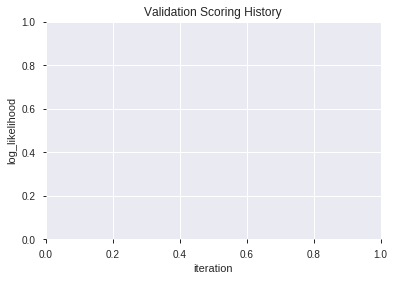

In [49]:
# GLM with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_3_AutoML_20190827_215506,0.562968,0.709603,0.487903,0.507873,0.257935
1,XGBoost_grid_1_AutoML_20190827_215506_model_1,0.541161,0.763945,0.500000,0.530827,0.281777
2,XGBoost_grid_1_AutoML_20190827_215506_model_6,0.539935,0.709843,0.495968,0.507786,0.257847
3,XGBoost_grid_1_AutoML_20190827_215506_model_5,0.528581,0.752908,0.483871,0.525834,0.276501
4,XGBoost_grid_1_AutoML_20190827_215506_model_2,0.528323,0.697260,0.500000,0.501968,0.251972
5,XGBoost_grid_1_AutoML_20190827_215506_model_3,0.523290,0.738319,0.491935,0.520623,0.271049
6,XGBoost_grid_1_AutoML_20190827_215506_model_7,0.518258,0.722547,0.487903,0.513788,0.263978
7,XGBoost_2_AutoML_20190827_215506,0.516839,0.698350,0.491903,0.502546,0.252552
8,XGBoost_grid_1_AutoML_20190827_215506_model_4,0.516323,0.695934,0.495968,0.501390,0.251392
9,XGBoost_1_AutoML_20190827_215506,0.514129,0.721698,0.491871,0.513187,0.263361


,variable,relative_importance,scaled_importance,percentage
0,BETA_14,145.694412,1.000000,0.024308
1,COS,139.012985,0.954141,0.023193
2,ULTOSC,118.302872,0.811993,0.019738
3,PLUS_DM_8,110.469704,0.758229,0.018431
4,SUB,109.126907,0.749012,0.018207
5,OBV,107.342842,0.736767,0.017909
6,CORREL_14,96.828735,0.664602,0.016155
7,DIV,94.265945,0.647011,0.015727
8,CORREL_8,87.762268,0.602372,0.014642
9,BETA_8,86.786972,0.595678,0.014480


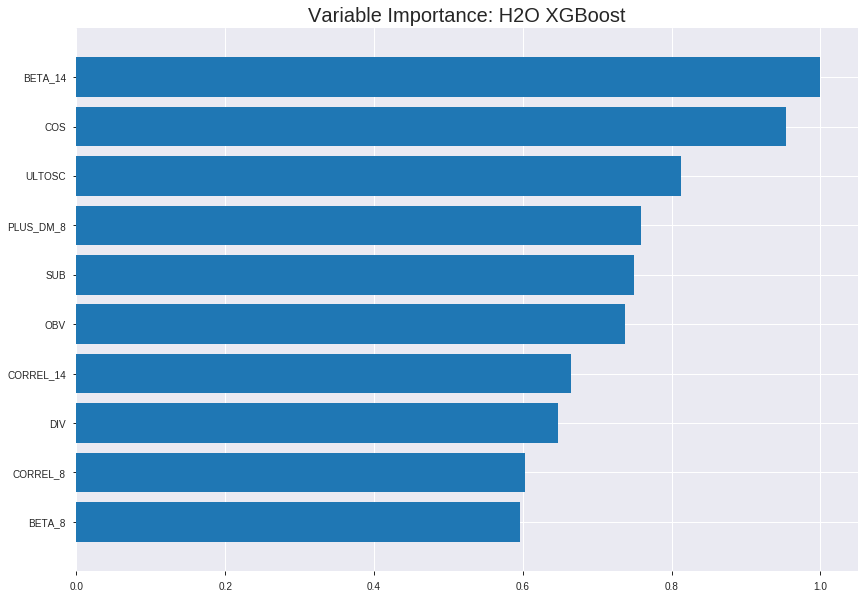

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_3_AutoML_20190827_215506


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.17039523017553954
RMSE: 0.41278957130181904
LogLoss: 0.528643342729183
Mean Per-Class Error: 0.10952208114457673
AUC: 0.9550424992740807
pr_auc: 0.9548387014902725
Gini: 0.9100849985481614
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5162637531757355: 


,0,1,Error,Rate
0,777.0,83.0,0.0965,(83.0/860.0)
1,108.0,773.0,0.1226,(108.0/881.0)
Total,885.0,856.0,0.1097,(191.0/1741.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5162638,0.8900403,186.0
max f2,0.4561523,0.9244876,240.0
max f0point5,0.5171040,0.8988109,185.0
max accuracy,0.5171040,0.8902929,185.0
max precision,0.8190732,1.0,0.0
max recall,0.3598249,1.0,320.0
max specificity,0.8190732,1.0,0.0
max absolute_mcc,0.5171040,0.7810754,185.0
max min_per_class_accuracy,0.5105926,0.8837209,192.0
max mean_per_class_accuracy,0.5171040,0.8904779,185.0


Gains/Lift Table: Avg response rate: 50.60 %, avg score: 50.70 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103389,0.7614462,1.9761635,1.9761635,1.0,0.7872296,1.0,0.7872296,0.0204313,0.0204313,97.6163451,97.6163451
,2,0.0201034,0.7282276,1.9761635,1.9761635,1.0,0.7418332,1.0,0.7651799,0.0192963,0.0397276,97.6163451,97.6163451
,3,0.0304423,0.7141152,1.9761635,1.9761635,1.0,0.7195950,1.0,0.7496982,0.0204313,0.0601589,97.6163451,97.6163451
,4,0.0402068,0.7056745,1.9761635,1.9761635,1.0,0.7102793,1.0,0.7401251,0.0192963,0.0794552,97.6163451,97.6163451
,5,0.0505457,0.6967056,1.9761635,1.9761635,1.0,0.6999439,1.0,0.7319062,0.0204313,0.0998865,97.6163451,97.6163451
,6,0.1005169,0.6642457,1.9761635,1.9761635,1.0,0.6801326,1.0,0.7061673,0.0987514,0.1986379,97.6163451,97.6163451
,7,0.1504882,0.6384836,1.9534489,1.9686208,0.9885057,0.6494892,0.9961832,0.6873467,0.0976163,0.2962543,95.3448928,96.8620842
,8,0.2004595,0.6178759,1.9307344,1.9591764,0.9770115,0.6281772,0.9914040,0.6725967,0.0964813,0.3927355,93.0734406,95.9176372
,9,0.3004021,0.5865042,1.8625908,1.9270428,0.9425287,0.6019855,0.9751434,0.6491046,0.1861521,0.5788876,86.2590839,92.7042753
,10,0.4003446,0.5538899,1.6468029,1.8570833,0.8333333,0.5711983,0.9397418,0.6296560,0.1645857,0.7434733,64.6802876,85.7083300




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.2647818112442976
RMSE: 0.5145695397556074
LogLoss: 0.7238794269192024
Mean Per-Class Error: 0.4555029815919108
AUC: 0.5348878662172672
pr_auc: 0.5530785019082559
Gini: 0.0697757324345345
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2824040651321411: 


,0,1,Error,Rate
0,4.0,228.0,0.9828,(228.0/232.0)
1,0.0,266.0,0.0,(0.0/266.0)
Total,4.0,494.0,0.4578,(228.0/498.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2824041,0.7000000,395.0
max f2,0.2824041,0.8536585,395.0
max f0point5,0.3611772,0.5948373,297.0
max accuracy,0.3611772,0.5562249,297.0
max precision,0.6889490,1.0,0.0
max recall,0.2824041,1.0,395.0
max specificity,0.6889490,1.0,0.0
max absolute_mcc,0.4493616,0.1008270,114.0
max min_per_class_accuracy,0.4063852,0.5150376,200.0
max mean_per_class_accuracy,0.4493616,0.5444970,114.0


Gains/Lift Table: Avg response rate: 53.41 %, avg score: 41.04 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100402,0.5789729,0.7488722,0.7488722,0.4,0.6205085,0.4,0.6205085,0.0075188,0.0075188,-25.1127820,-25.1127820
,2,0.0200803,0.5602808,0.7488722,0.7488722,0.4,0.5670065,0.4,0.5937575,0.0075188,0.0150376,-25.1127820,-25.1127820
,3,0.0301205,0.5415135,1.4977444,0.9984962,0.8,0.5511918,0.5333333,0.5795689,0.0150376,0.0300752,49.7744361,-0.1503759
,4,0.0401606,0.5307612,0.7488722,0.9360902,0.4,0.5362978,0.5,0.5687511,0.0075188,0.0375940,-25.1127820,-6.3909774
,5,0.0502008,0.5240124,1.1233083,0.9735338,0.6,0.5278827,0.52,0.5605775,0.0112782,0.0488722,12.3308271,-2.6466165
,6,0.1004016,0.4982149,1.1233083,1.0484211,0.6,0.5091309,0.56,0.5348542,0.0563910,0.1052632,12.3308271,4.8421053
,7,0.1506024,0.4806759,0.9735338,1.0234586,0.52,0.4911339,0.5466667,0.5202808,0.0488722,0.1541353,-2.6466165,2.3458647
,8,0.2008032,0.4675870,1.1981955,1.0671429,0.64,0.4736832,0.57,0.5086314,0.0601504,0.2142857,19.8195489,6.7142857
,9,0.3012048,0.4416663,1.1607519,1.0983459,0.62,0.4532313,0.5866667,0.4901647,0.1165414,0.3308271,16.0751880,9.8345865
,10,0.3995984,0.4224500,0.9934019,1.0725054,0.5306122,0.4320771,0.5728643,0.4758617,0.0977444,0.4285714,-0.6598128,7.2505384



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-27 21:55:19,0.004 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4939690,0.5,0.6931472,0.5,0.0,1.0,0.4658635
,2019-08-27 21:55:21,1.310 sec,5.0,0.4867212,0.6668831,0.8030759,0.8082627,1.9761635,0.2940839,0.4996226,0.6923936,0.5426416,0.5691769,1.1701128,0.4658635
,2019-08-27 21:55:21,1.563 sec,10.0,0.4748172,0.6437772,0.8563003,0.8590134,1.9761635,0.2601953,0.4985345,0.6901935,0.5431845,0.5686819,1.4977444,0.4437751
,2019-08-27 21:55:21,1.810 sec,15.0,0.4650251,0.6250571,0.8880672,0.8907776,1.9761635,0.2056289,0.4996869,0.6924931,0.5432898,0.5731945,1.4977444,0.4558233
,2019-08-27 21:55:21,2.046 sec,20.0,0.4584806,0.6126273,0.8981225,0.8998063,1.9761635,0.1952901,0.5010589,0.6952730,0.5550541,0.5742281,1.4977444,0.4618474
,2019-08-27 21:55:22,2.301 sec,25.0,0.4496787,0.5961091,0.9141237,0.9147079,1.9761635,0.1740379,0.5015886,0.6963808,0.5468466,0.5676862,1.1233083,0.4618474
,2019-08-27 21:55:22,2.547 sec,30.0,0.4420562,0.5818742,0.9214074,0.9233343,1.9761635,0.1602527,0.5043857,0.7021395,0.5444565,0.5642650,1.1233083,0.4638554
,2019-08-27 21:55:22,2.804 sec,35.0,0.4345674,0.5680652,0.9319207,0.9330625,1.9761635,0.1591040,0.5071509,0.7078972,0.5456394,0.5618438,1.1233083,0.4618474
,2019-08-27 21:55:22,3.055 sec,40.0,0.4273626,0.5549430,0.9420908,0.9425050,1.9761635,0.1361287,0.5077997,0.7092979,0.5455827,0.5606299,1.1233083,0.4618474
,2019-08-27 21:55:23,3.303 sec,45.0,0.4203238,0.5421360,0.9482400,0.9486258,1.9761635,0.1229179,0.5106233,0.7152584,0.5424148,0.5564734,1.1233083,0.4618474


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BETA_14,145.6944122,1.0,0.0243079
COS,139.0129852,0.9541408,0.0231931
ULTOSC,118.3028717,0.8119932,0.0197378
PLUS_DM_8,110.4697037,0.7582288,0.0184309
SUB,109.1269073,0.7490123,0.0182069
---,---,---,---
LINEARREG_ANGLE_20,1.4442596,0.0099129,0.0002410
BBANDS_lowerband_20_1_4,1.2149906,0.0083393,0.0002027
BBANDS_upperband_20_5_2,1.2100296,0.0083053,0.0002019
BBANDS_upperband_12_1_5,1.1739669,0.0080577,0.0001959



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5863453815261044)

('F1', 0.6738544474393531)

('auc', 0.5629677419354839)

('logloss', 0.70960347645457)

('mean_per_class_error', 0.4139354838709677)

('rmse', 0.50787275361381)

('mse', 0.2579347338632738)

xgboost prediction progress: |████████████████████████████████████████████| 100%


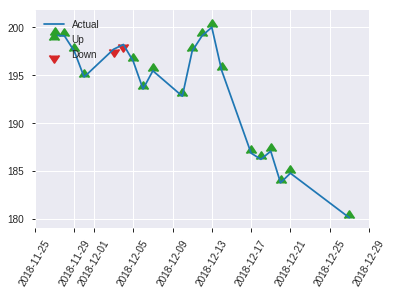


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.2579347338632738
RMSE: 0.50787275361381
LogLoss: 0.70960347645457
Mean Per-Class Error: 0.4139354838709677
AUC: 0.5629677419354839
pr_auc: 0.5279981580101262
Gini: 0.12593548387096787
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2691369354724884: 


,0,1,Error,Rate
0,3.0,121.0,0.9758,(121.0/124.0)
1,0.0,125.0,0.0,(0.0/125.0)
Total,3.0,246.0,0.4859,(121.0/249.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2691369,0.6738544,245.0
max f2,0.2691369,0.8378016,245.0
max f0point5,0.3886320,0.5923836,145.0
max accuracy,0.3967651,0.5863454,141.0
max precision,0.4430530,0.6065574,60.0
max recall,0.2691369,1.0,245.0
max specificity,0.5634569,0.9919355,0.0
max absolute_mcc,0.3886320,0.1746221,145.0
max min_per_class_accuracy,0.4074732,0.552,122.0
max mean_per_class_accuracy,0.3967651,0.5860645,141.0


Gains/Lift Table: Avg response rate: 50.20 %, avg score: 40.41 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0120482,0.5430668,0.0,0.0,0.0,0.5528499,0.0,0.5528499,0.0,0.0,-100.0,-100.0
,2,0.0200803,0.5327027,0.0,0.0,0.0,0.5370339,0.0,0.5465235,0.0,0.0,-100.0,-100.0
,3,0.0321285,0.5222017,0.6640000,0.249,0.3333333,0.5271906,0.125,0.5392737,0.008,0.008,-33.6000000,-75.1
,4,0.0401606,0.5094277,0.996,0.3984,0.5,0.5207427,0.2,0.5355675,0.008,0.016,-0.4000000,-60.1600000
,5,0.0522088,0.5041237,1.992,0.7661538,1.0,0.5076943,0.3846154,0.5291352,0.024,0.04,99.2,-23.3846154
,6,0.1004016,0.4830593,1.162,0.9561600,0.5833333,0.4924924,0.48,0.5115467,0.056,0.096,16.2000000,-4.3840000
,7,0.1526104,0.4676448,1.0726154,0.996,0.5384615,0.4751721,0.5,0.4991027,0.056,0.152,7.2615385,-0.4000000
,8,0.2008032,0.4556443,1.494,1.11552,0.75,0.4617094,0.56,0.4901283,0.072,0.224,49.4,11.5520000
,9,0.3012048,0.4319985,1.27488,1.16864,0.64,0.4423095,0.5866667,0.4741887,0.128,0.352,27.488,16.8640000
,10,0.4016064,0.4197751,1.11552,1.15536,0.56,0.4247359,0.58,0.4618255,0.112,0.464,11.5520000,15.5360000


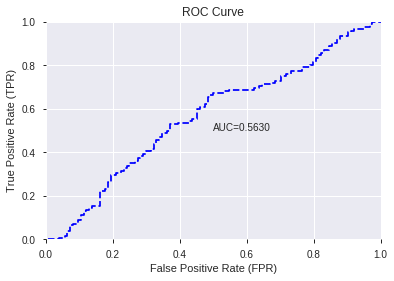

This function is available for GLM models only


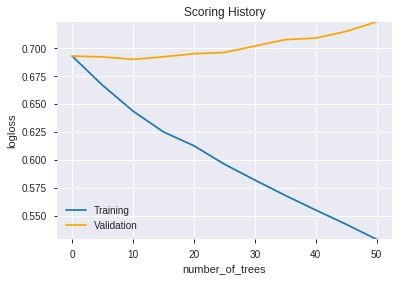

--2019-08-27 21:56:06--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.104.195
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.104.195|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoMo

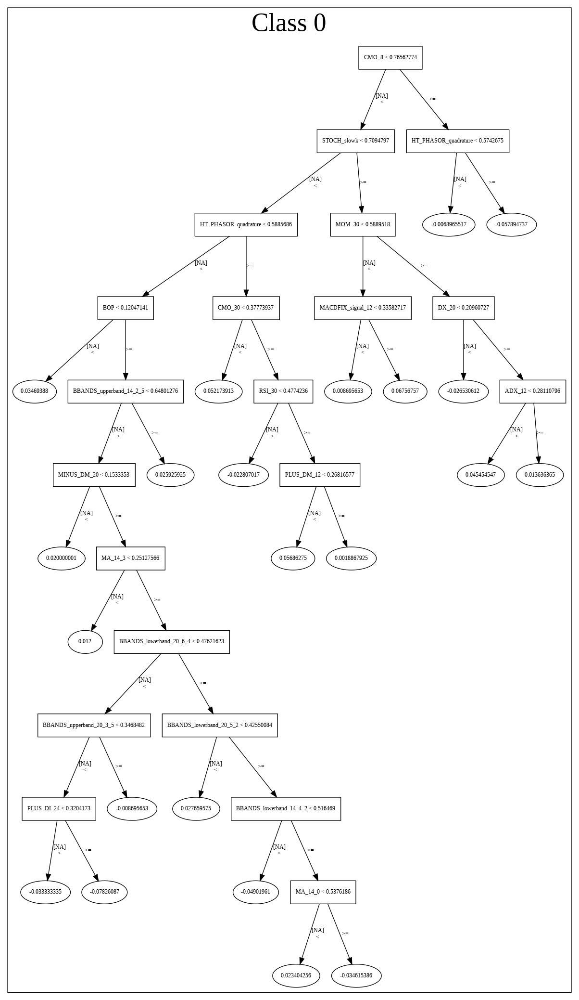

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_3_AutoML_20190827_215506',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_3_AutoML_20190827_215506',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_90_sid_8014',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_90_sid_8014',
   'type

['BETA_14',
 'COS',
 'ULTOSC',
 'PLUS_DM_8',
 'SUB',
 'OBV',
 'CORREL_14',
 'DIV',
 'CORREL_8',
 'BETA_8',
 'SIN',
 'BOP',
 'STOCHF_fastk',
 'STDDEV_12',
 'TRANGE',
 'MACD_hist',
 'STDDEV_24',
 'ADOSC',
 'CCI_20',
 'HT_PHASOR_inphase',
 'STOCHRSI_fastd',
 'ROC_8',
 'CORREL_12',
 'PLUS_DM_14',
 'MINUS_DI_8',
 'NATR_8',
 'DX_20',
 'CDLBELTHOLD',
 'TAN',
 'CORREL_30',
 'DX_14',
 'HT_PHASOR_quadrature',
 'MINUS_DI_30',
 'STOCH_slowk',
 'LINEARREG_ANGLE_8',
 'ATR_24',
 'MINUS_DI_14',
 'Volume',
 'STOCHRSI_fastk',
 'CCI_14',
 'ATR_30',
 'ADX_8',
 'ADX_24',
 'MOM_8',
 'BETA_12',
 'BETA_20',
 'MFI_12',
 'PLUS_DM_12',
 'PLUS_DM_30',
 'ADXR_8',
 'WILLR_20',
 'MINUS_DI_20',
 'MACDFIX_hist_14',
 'CCI_8',
 'SAREXT',
 'MOM_14',
 'MACDFIX_hist_8',
 'STOCH_slowd',
 'dayofyear',
 'LINEARREG_ANGLE_24',
 'MACDFIX_hist_20',
 'day',
 'aroonup_24',
 'CCI_12',
 'VAR_8',
 'MINUS_DI_24',
 'DX_8',
 'MACDFIX_signal_12',
 'PLUS_DM_24',
 'WILLR_8',
 'ROC_12',
 'CORREL_24',
 'CORREL_20',
 'DX_24',
 'ADX_12',
 'STDD

In [50]:
# XGBoost with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="XGBoost",features_list=features_list)

In [51]:
# recursive feature elimination with cross validation
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'RFE' in features_to_include:
  from sklearn.feature_selection import RFECV
  from sklearn.svm import LinearSVC
  from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
  from sklearn.linear_model import LogisticRegression, LinearRegression

  bestfeatures = RFECV(ExtraTreeClassifier(random_state=1,criterion='entropy'), min_features_to_select=select_rfe, step=1,cv=5).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, RFECV, LinearSVC, DecisionTreeClassifier,ExtraTreeClassifier, LogisticRegression, LinearRegression
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list = []

195

['BBANDS_middleband_14_2_3',
 'BBANDS_lowerband_14_2_3',
 'BBANDS_upperband_14_2_4',
 'BBANDS_middleband_14_2_4',
 'BBANDS_lowerband_14_2_4',
 'BBANDS_upperband_14_2_5',
 'BBANDS_upperband_14_3_2',
 'BBANDS_lowerband_14_3_2',
 'BBANDS_middleband_14_3_3',
 'BBANDS_lowerband_14_3_4',
 'MA_14_4',
 'MAVP_14_4',
 'BBANDS_upperband_14_4_3',
 'BBANDS_middleband_14_4_3',
 'BBANDS_lowerband_14_4_3',
 'BBANDS_middleband_14_4_5',
 'BBANDS_lowerband_14_4_5',
 'MAVP_14_5',
 'BBANDS_middleband_14_5_2',
 'BBANDS_upperband_14_5_5',
 'BBANDS_middleband_14_5_5',
 'BBANDS_middleband_14_6_2',
 'BBANDS_lowerband_14_6_4',
 'BBANDS_lowerband_14_6_5',
 'MAVP_14_7',
 'BBANDS_upperband_14_7_4',
 'BBANDS_lowerband_14_7_5',
 'SAR_0.2',
 'BBANDS_upperband_20_0_2',
 'MAVP_20_1',
 'BBANDS_middleband_20_1_3',
 'BBANDS_lowerband_20_1_3',
 'BBANDS_lowerband_20_1_4',
 'BBANDS_lowerband_20_1_5',
 'MA_20_2',
 'BBANDS_lowerband_20_2_4',
 'BBANDS_upperband_20_3_3',
 'BBANDS_middleband_20_5_4',
 'BBANDS_lowerband_20_5_5',
 '

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190827_215738_model_1,0.554194,1.757255,0.487839,0.642522,0.412835
1,DeepLearning_grid_1_AutoML_20190827_215738_model_6,0.540194,0.693605,0.487839,0.500217,0.250217
2,DeepLearning_grid_1_AutoML_20190827_215738_model_9,0.531806,0.692847,0.500000,0.499850,0.249850
3,DeepLearning_grid_1_AutoML_20190827_215738_model_5,0.530968,0.697784,0.467677,0.502301,0.252306
4,DeepLearning_1_AutoML_20190827_215738,0.527935,1.270176,0.479710,0.632719,0.400334
5,DeepLearning_grid_1_AutoML_20190827_215738_model_4,0.526968,0.996672,0.495968,0.571062,0.326112
6,DeepLearning_grid_1_AutoML_20190827_215738_model_2,0.525355,0.986197,0.500000,0.568875,0.323618
7,DeepLearning_grid_1_AutoML_20190827_215738_model_3,0.506903,0.831184,0.500000,0.545817,0.297917
8,DeepLearning_grid_1_AutoML_20190827_215738_model_8,0.500000,0.694525,0.500000,0.500687,0.250688
9,DeepLearning_grid_1_AutoML_20190827_215738_model_7,0.496452,0.753116,0.495935,0.527264,0.278007


,variable,relative_importance,scaled_importance,percentage
0,HT_PHASOR_inphase,1.000000,1.000000,0.005570
1,MOM_30,0.980594,0.980594,0.005462
2,BBANDS_middleband_14_2_3,0.980207,0.980207,0.005460
3,PLUS_DM_14,0.978899,0.978899,0.005452
4,aroondown_8,0.976163,0.976163,0.005437
5,BBANDS_lowerband_14_4_3,0.973026,0.973026,0.005420
6,CDLLONGLINE,0.969131,0.969131,0.005398
7,BBANDS_upperband_20_0_2,0.968304,0.968304,0.005393
8,CCI_24,0.964184,0.964184,0.005370
9,MACDFIX_8,0.963949,0.963949,0.005369


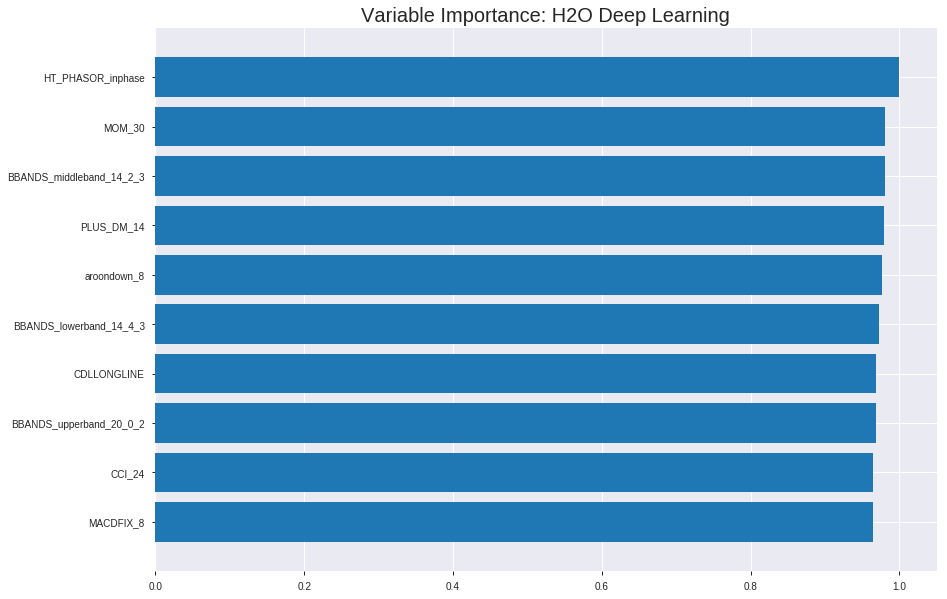

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190827_215738_model_1


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.2820668380293659
RMSE: 0.5310996498109991
LogLoss: 0.9788797754009031
Mean Per-Class Error: 0.36674629781168333
AUC: 0.6618549217327033
pr_auc: 0.6152589054592686
Gini: 0.32370984346540665
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.36405722110989003: 


,0,1,Error,Rate
0,337.0,523.0,0.6081,(523.0/860.0)
1,146.0,735.0,0.1657,(146.0/881.0)
Total,483.0,1258.0,0.3843,(669.0/1741.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3640572,0.6872370,268.0
max f2,0.0037407,0.8373023,397.0
max f0point5,0.5333220,0.6368876,208.0
max accuracy,0.5333220,0.6346927,208.0
max precision,0.9996432,0.8536585,0.0
max recall,0.0005097,1.0,399.0
max specificity,0.9996432,0.9930233,0.0
max absolute_mcc,0.4947558,0.2774470,223.0
max min_per_class_accuracy,0.7119129,0.6255814,142.0
max mean_per_class_accuracy,0.5333220,0.6332537,208.0


Gains/Lift Table: Avg response rate: 50.60 %, avg score: 62.19 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103389,0.9997077,1.7565897,1.7565897,0.8888889,0.9998462,0.8888889,0.9998462,0.0181612,0.0181612,75.6589734,75.6589734
,2,0.0201034,0.9993086,1.6274287,1.6938544,0.8235294,0.9995656,0.8571429,0.9997099,0.0158910,0.0340522,62.7428724,69.3854386
,3,0.0304423,0.9985874,1.6468029,1.6778746,0.8333333,0.9989731,0.8490566,0.9994597,0.0170261,0.0510783,64.6802876,67.7874628
,4,0.0402068,0.9979478,1.2786940,1.5809308,0.6470588,0.9983196,0.8,0.9991828,0.0124858,0.0635641,27.8693997,58.0930760
,5,0.0505457,0.9969627,1.6468029,1.5944046,0.8333333,0.9974380,0.8068182,0.9988259,0.0170261,0.0805902,64.6802876,59.4404602
,6,0.1005169,0.9889430,1.2947278,1.4454224,0.6551724,0.9933700,0.7314286,0.9961136,0.0646992,0.1452894,29.4727778,44.5422410
,7,0.1504882,0.9794513,1.2947278,1.3953826,0.6551724,0.9845937,0.7061069,0.9922883,0.0646992,0.2099886,29.4727778,39.5382589
,8,0.2004595,0.9639141,1.0902971,1.3193298,0.5517241,0.9724378,0.6676218,0.9873399,0.0544835,0.2644722,9.0297076,31.9329754
,9,0.3004021,0.9162810,1.2265842,1.2884737,0.6206897,0.9430134,0.6520076,0.9725926,0.1225880,0.3870602,22.6584211,28.8473684
,10,0.4003446,0.8285402,1.2038697,1.2673530,0.6091954,0.8754768,0.6413199,0.9483485,0.1203178,0.5073780,20.3869688,26.7353031




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.36831580312696444
RMSE: 0.6068902727239616
LogLoss: 1.5192703816915847
Mean Per-Class Error: 0.43902320456313193
AUC: 0.5487344438682914
pr_auc: 0.5484155025816478
Gini: 0.0974688877365828
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.007063516133257728: 


,0,1,Error,Rate
0,24.0,208.0,0.8966,(208.0/232.0)
1,11.0,255.0,0.0414,(11.0/266.0)
Total,35.0,463.0,0.4398,(219.0/498.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0070635,0.6995885,382.0
max f2,0.0004329,0.8520179,398.0
max f0point5,0.0336526,0.6047967,344.0
max accuracy,0.0336526,0.5682731,344.0
max precision,0.9999599,0.6666667,0.0
max recall,0.0004329,1.0,398.0
max specificity,0.9999599,0.9870690,0.0
max absolute_mcc,0.3935900,0.1223378,214.0
max min_per_class_accuracy,0.5007701,0.5431034,191.0
max mean_per_class_accuracy,0.3935900,0.5609768,214.0


Gains/Lift Table: Avg response rate: 53.41 %, avg score: 50.78 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100402,0.9999477,0.7488722,0.7488722,0.4,0.9999841,0.4,0.9999841,0.0075188,0.0075188,-25.1127820,-25.1127820
,2,0.0200803,0.9998575,1.8721805,1.3105263,1.0,0.9999157,0.7,0.9999499,0.0187970,0.0263158,87.2180451,31.0526316
,3,0.0301205,0.9998218,0.7488722,1.1233083,0.4,0.9998477,0.6,0.9999158,0.0075188,0.0338346,-25.1127820,12.3308271
,4,0.0401606,0.9997174,1.1233083,1.1233083,0.6,0.9997696,0.6,0.9998793,0.0112782,0.0451128,12.3308271,12.3308271
,5,0.0502008,0.9996488,0.3744361,0.9735338,0.2,0.9996942,0.52,0.9998423,0.0037594,0.0488722,-62.5563910,-2.6466165
,6,0.1004016,0.9959879,1.0484211,1.0109774,0.56,0.9983696,0.54,0.9991059,0.0526316,0.1015038,4.8421053,1.0977444
,7,0.1506024,0.9860420,0.8986466,0.9735338,0.48,0.9924774,0.52,0.9968964,0.0451128,0.1466165,-10.1353383,-2.6466165
,8,0.2008032,0.9640491,1.1233083,1.0109774,0.6,0.9753230,0.54,0.9915031,0.0563910,0.2030075,12.3308271,1.0977444
,9,0.3012048,0.8730668,1.1981955,1.0733835,0.64,0.9254348,0.5733333,0.9694803,0.1203008,0.3233083,19.8195489,7.3383459
,10,0.3995984,0.7162191,0.8405708,1.0160577,0.4489796,0.8070834,0.5427136,0.9294931,0.0827068,0.4060150,-15.9429185,1.6057732



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-27 21:57:39,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-27 21:57:42,3.176 sec,940 obs/sec,1.5829983,1,2756.0,0.5658683,1.1238331,-0.2810141,0.5897381,0.5663005,1.3174423,0.4830557,0.6838852,5.3009455,-0.8795568,0.4786670,0.4570254,1.4977444,0.4658635
,2019-08-27 21:57:48,8.914 sec,975 obs/sec,4.7392303,3,8251.0,0.5310996,0.9788798,-0.1284315,0.6618549,0.6152589,1.7565897,0.3842619,0.6068903,1.5192704,-0.4801626,0.5487344,0.5484155,0.7488722,0.4397590
,2019-08-27 21:57:53,14.414 sec,1001 obs/sec,7.9098219,5,13771.0,0.5030014,0.8317780,-0.0121888,0.7020009,0.6638664,1.7565897,0.3543940,0.6582806,2.2031304,-0.7414509,0.5325139,0.5401720,1.1233083,0.4598394
,2019-08-27 21:57:59,19.774 sec,1019 obs/sec,11.0740953,7,19280.0,0.5293342,0.9399636,-0.1209417,0.7009424,0.6663829,1.6468029,0.3859851,0.6708751,4.8428882,-0.8087244,0.4807574,0.4702375,1.1233083,0.4618474
,2019-08-27 21:58:04,25.064 sec,1032 obs/sec,14.2016083,9,24725.0,0.5524615,1.1576587,-0.2210323,0.6641666,0.6152602,1.6468029,0.4032165,0.6824337,9.5154639,-0.8715871,0.4868907,0.1697835,1.5601504,0.4658635
,2019-08-27 21:58:09,30.251 sec,1045 obs/sec,17.3411832,11,30191.0,0.5090705,0.8796635,-0.0367617,0.7111640,0.6812715,1.9761635,0.3940264,0.6396830,1.9217375,-0.6444422,0.4961272,0.5134246,1.4977444,0.4618474
,2019-08-27 21:58:14,35.419 sec,1056 obs/sec,20.4905227,13,35674.0,0.4640925,0.6884124,0.1383474,0.7673033,0.7447910,1.9761635,0.3285468,0.6491082,2.4606902,-0.6932583,0.4998785,0.5106773,1.4977444,0.4658635
,2019-08-27 21:58:14,35.636 sec,1055 obs/sec,20.4905227,13,35674.0,0.5310996,0.9788798,-0.1284315,0.6618549,0.6152589,1.7565897,0.3842619,0.6068903,1.5192704,-0.4801626,0.5487344,0.5484155,0.7488722,0.4397590


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
HT_PHASOR_inphase,1.0,1.0,0.0055700
MOM_30,0.9805936,0.9805936,0.0054619
BBANDS_middleband_14_2_3,0.9802068,0.9802068,0.0054597
PLUS_DM_14,0.9788995,0.9788995,0.0054524
aroondown_8,0.9761633,0.9761633,0.0054372
---,---,---,---
MINUS_DI_14,0.8621300,0.8621300,0.0048020
aroondown_12,0.8619133,0.8619133,0.0048008
STOCHRSI_fastd,0.8581532,0.8581532,0.0047799
AROONOSC_12,0.8533871,0.8533871,0.0047533



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5783132530120482)

('F1', 0.670299727520436)

('auc', 0.5541935483870968)

('logloss', 1.7572554020312914)

('mean_per_class_error', 0.4210645161290323)

('rmse', 0.6425219960044204)

('mse', 0.41283451534950444)

deeplearning prediction progress: |███████████████████████████████████████| 100%


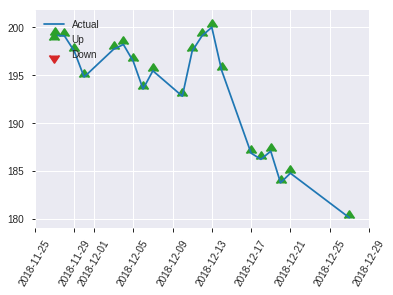


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.41283451534950444
RMSE: 0.6425219960044204
LogLoss: 1.7572554020312914
Mean Per-Class Error: 0.4210645161290323
AUC: 0.5541935483870968
pr_auc: 0.5510783044682769
Gini: 0.10838709677419356
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.016709718272630153: 


,0,1,Error,Rate
0,5.0,119.0,0.9597,(119.0/124.0)
1,2.0,123.0,0.016,(2.0/125.0)
Total,7.0,242.0,0.4859,(121.0/249.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0167097,0.6702997,241.0
max f2,0.0005631,0.8344459,248.0
max f0point5,0.9748880,0.5714286,99.0
max accuracy,0.9825316,0.5783133,85.0
max precision,0.9999966,1.0,0.0
max recall,0.0005631,1.0,248.0
max specificity,0.9999966,1.0,0.0
max absolute_mcc,0.9825316,0.1660065,85.0
max min_per_class_accuracy,0.9510457,0.552,123.0
max mean_per_class_accuracy,0.9825316,0.5789355,85.0


Gains/Lift Table: Avg response rate: 50.20 %, avg score: 75.25 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0120482,0.9999769,1.3280000,1.3280000,0.6666667,0.9999952,0.6666667,0.9999952,0.016,0.016,32.8000000,32.8000000
,2,0.0200803,0.9999465,0.996,1.1952000,0.5,0.9999557,0.6,0.9999794,0.008,0.024,-0.4000000,19.5200000
,3,0.0321285,0.9999046,1.3280000,1.2450000,0.6666667,0.9999240,0.625,0.9999586,0.016,0.04,32.8000000,24.5000000
,4,0.0401606,0.9997964,0.996,1.1952000,0.5,0.9998568,0.6,0.9999383,0.008,0.048,-0.4000000,19.5200000
,5,0.0522088,0.9996640,1.992,1.3790769,1.0,0.9997277,0.6923077,0.9998897,0.024,0.072,99.2,37.9076923
,6,0.1004016,0.9985225,0.996,1.1952000,0.5,0.9991742,0.6,0.9995462,0.048,0.12,-0.4000000,19.5200000
,7,0.1526104,0.9976468,1.0726154,1.1532632,0.5384615,0.9980605,0.5789474,0.9990379,0.056,0.176,7.2615385,15.3263158
,8,0.2008032,0.9941992,0.996,1.11552,0.5,0.9963386,0.56,0.9983901,0.048,0.224,-0.4000000,11.5520000
,9,0.3012048,0.9862449,1.43424,1.2217600,0.72,0.9905197,0.6133333,0.9957666,0.144,0.368,43.4240000,22.1760000
,10,0.4016064,0.9748366,1.11552,1.1952000,0.56,0.9810779,0.6,0.9920945,0.112,0.48,11.5520000,19.5200000


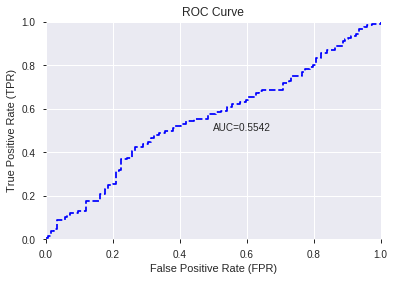

This function is available for GLM models only


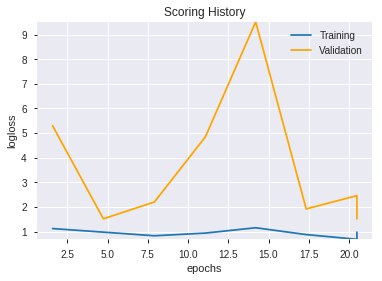

--2019-08-27 22:07:49--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.8.27
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.8.27|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


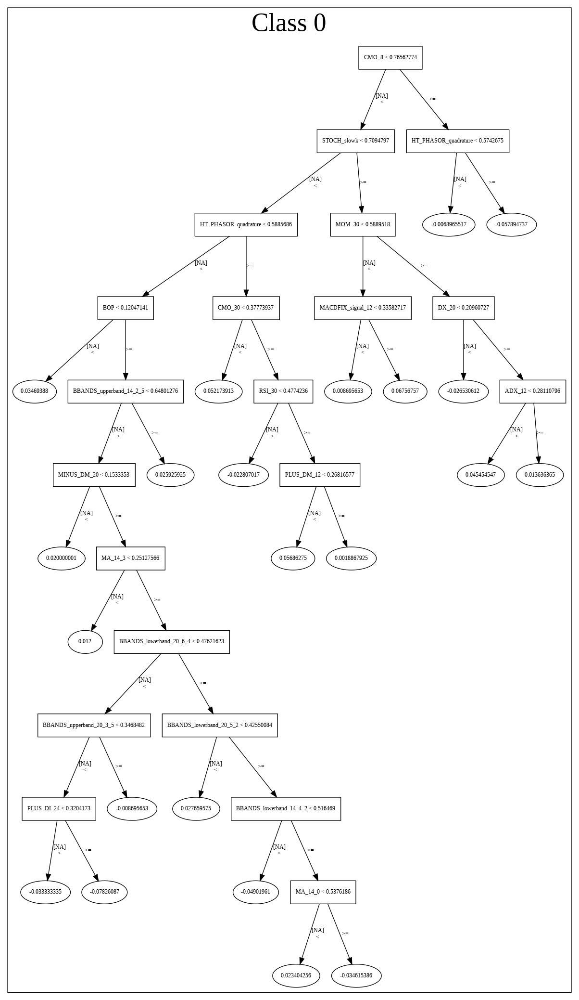

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190827_215738_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190827_215738_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_98_sid_8014',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['HT_PHASOR_inphase',
 'MOM_30',
 'BBANDS_middleband_14_2_3',
 'PLUS_DM_14',
 'aroondown_8',
 'BBANDS_lowerband_14_4_3',
 'CDLLONGLINE',
 'BBANDS_upperband_20_0_2',
 'CCI_24',
 'MACDFIX_8',
 'LINEARREG_14',
 'MA_20_2',
 'MACDEXT_signal',
 'BBANDS_middleband_14_3_3',
 'BBANDS_lowerband_20_2_4',
 'BBANDS_upperband_14_2_5',
 'aroonup_12',
 'RSI_24',
 'CORREL_8',
 'CMO_24',
 'CORREL_12',
 'LINEARREG_ANGLE_12',
 'AROONOSC_20',
 'MAVP_14_5',
 'CDLHIKKAKE',
 'BBANDS_upperband_20_7_4',
 'MINUS_DM_24',
 'ROCR_12',
 'MOM_20',
 'STOCH_slowd',
 'MINUS_DM_20',
 'WILLR_20',
 'MAVP_14_4',
 'MACDFIX_hist_12',
 'MINUS_DI_12',
 'BBANDS_middleband_24_1_3',
 'LINEARREG_INTERCEPT_12',
 'PLUS_DM_30',
 'PLUS_DM_20',
 'aroondown_14',
 'MOM_12',
 'TSF_8',
 'TRIX_14',
 'CMO_12',
 'MINUS_DI_30',
 'BBANDS_upperband_14_5_5',
 'RSI_8',
 'SAR_0.2',
 'BBANDS_lowerband_14_2_4',
 'CCI_12',
 'BBANDS_middleband_30_6_4',
 'ROC_20',
 'BBANDS_lowerband_24_1_3',
 'LINEARREG_SLOPE_8',
 'BETA_14',
 'LINEARREG_SLOPE_12',
 'BBAN

In [52]:
# DeepLearning with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190827_220755_model_1,0.531355,0.7207,0.5,0.513147,0.26332


,variable,relative_importance,scaled_importance,percentage
0,CDLBELTHOLD,0.007160,1.000000,0.024049
1,CDLHIKKAKE,0.006186,0.863867,0.020775
2,BOP,0.005823,0.813218,0.019557
3,STOCHF_fastd,0.005455,0.761842,0.018321
4,STOCH_slowk,0.005451,0.761222,0.018306
5,HT_PHASOR_inphase,0.005228,0.730124,0.017559
6,STDDEV_8,0.004349,0.607405,0.014607
7,HT_DCPERIOD,0.004304,0.601043,0.014454
8,BETA_14,0.004251,0.593730,0.014278
9,STOCHRSI_fastd,0.004236,0.591614,0.014228


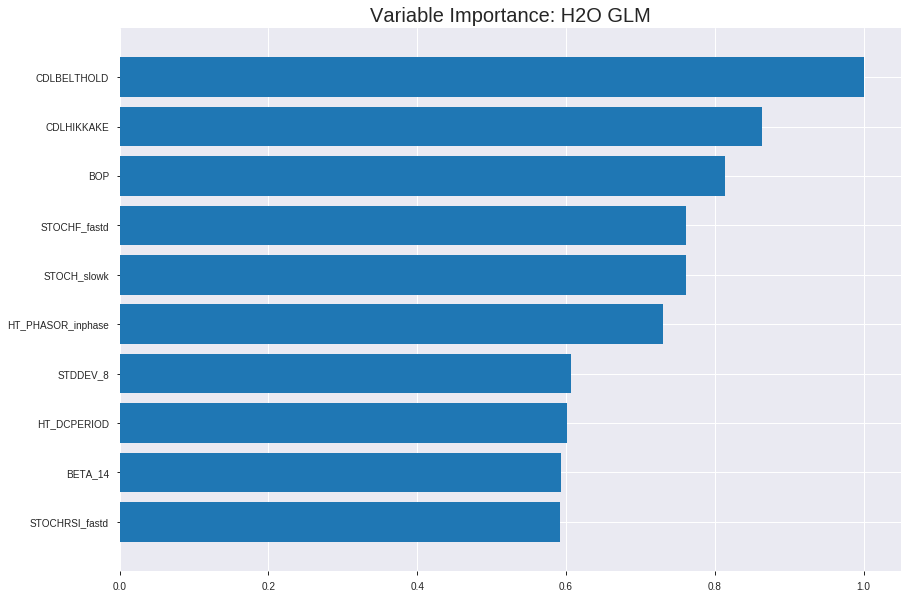

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190827_220755_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.24838264389311124
RMSE: 0.4983800195564738
LogLoss: 0.6899075559844721
Null degrees of freedom: 1740
Residual degrees of freedom: 1545
Null deviance: 2413.285173867487
Residual deviance: 2402.2581099379317
AIC: 2794.2581099379317
AUC: 0.5557413615605944
pr_auc: 0.555958196108511
Gini: 0.11148272312118879
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4554685321809731: 


,0,1,Error,Rate
0,8.0,852.0,0.9907,(852.0/860.0)
1,3.0,878.0,0.0034,(3.0/881.0)
Total,11.0,1730.0,0.4911,(855.0/1741.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4554685,0.6725393,391.0
max f2,0.4494649,0.8368161,398.0
max f0point5,0.4745922,0.5659992,345.0
max accuracy,0.5132123,0.5491097,163.0
max precision,0.5650541,1.0,0.0
max recall,0.4494649,1.0,398.0
max specificity,0.5650541,1.0,0.0
max absolute_mcc,0.5132123,0.1057741,163.0
max min_per_class_accuracy,0.5059039,0.5395349,202.0
max mean_per_class_accuracy,0.5132123,0.5507972,163.0


Gains/Lift Table: Avg response rate: 50.60 %, avg score: 50.60 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103389,0.5530402,1.3174423,1.3174423,0.6666667,0.5567049,0.6666667,0.5567049,0.0136209,0.0136209,31.7442300,31.7442300
,2,0.0201034,0.5480993,1.0462042,1.1856981,0.5294118,0.5507133,0.6,0.5537947,0.0102157,0.0238365,4.6204180,18.5698070
,3,0.0304423,0.5455428,1.2076554,1.1931553,0.6111111,0.5465467,0.6037736,0.5513331,0.0124858,0.0363224,20.7655442,19.3155291
,4,0.0402068,0.5433830,1.0462042,1.1574672,0.5294118,0.5443107,0.5857143,0.5496277,0.0102157,0.0465380,4.6204180,15.7467164
,5,0.0505457,0.5414030,1.3174423,1.1901894,0.6666667,0.5425886,0.6022727,0.5481879,0.0136209,0.0601589,31.7442300,19.0189351
,6,0.1005169,0.5337329,0.9540099,1.0727744,0.4827586,0.5374307,0.5428571,0.5428400,0.0476731,0.1078320,-4.5990058,7.2774445
,7,0.1504882,0.5282196,1.1811552,1.1087635,0.5977011,0.5307739,0.5610687,0.5388333,0.0590238,0.1668558,18.1155166,10.8763463
,8,0.2004595,0.5235259,1.2947278,1.1551213,0.6551724,0.5259316,0.5845272,0.5356171,0.0646992,0.2315551,29.4727778,15.5121329
,9,0.3004021,0.5170809,1.1470834,1.1524471,0.5804598,0.5201570,0.5831740,0.5304736,0.1146425,0.3461975,14.7083382,15.2447137
,10,0.4003446,0.5109495,0.9767245,1.1085795,0.4942529,0.5137801,0.5609756,0.5263062,0.0976163,0.4438138,-2.3275536,10.8579497




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.25840931595873246
RMSE: 0.5083397642903145
LogLoss: 0.7102207688802242
Null degrees of freedom: 497
Residual degrees of freedom: 302
Null deviance: 689.626794400202
Residual deviance: 707.3798858047035
AIC: 1099.3798858047035
AUC: 0.5707317863624579
pr_auc: 0.5973145370015089
Gini: 0.14146357272491583
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3373120307479347: 


,0,1,Error,Rate
0,0.0,232.0,1.0,(232.0/232.0)
1,0.0,266.0,0.0,(0.0/266.0)
Total,0.0,498.0,0.4659,(232.0/498.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3373120,0.6963351,399.0
max f2,0.3373120,0.8514725,399.0
max f0point5,0.4221159,0.6134094,222.0
max accuracy,0.4221159,0.5863454,222.0
max precision,0.5024215,1.0,0.0
max recall,0.3373120,1.0,399.0
max specificity,0.5024215,1.0,0.0
max absolute_mcc,0.4221159,0.1651149,222.0
max min_per_class_accuracy,0.4260323,0.5517241,199.0
max mean_per_class_accuracy,0.4221159,0.5819290,222.0


Gains/Lift Table: Avg response rate: 53.41 %, avg score: 42.58 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100402,0.4879696,1.1233083,1.1233083,0.6,0.4965883,0.6,0.4965883,0.0112782,0.0112782,12.3308271,12.3308271
,2,0.0200803,0.4809544,1.4977444,1.3105263,0.8,0.4860578,0.7,0.4913230,0.0150376,0.0263158,49.7744361,31.0526316
,3,0.0301205,0.4742027,1.1233083,1.2481203,0.6,0.4769809,0.6666667,0.4865423,0.0112782,0.0375940,12.3308271,24.8120301
,4,0.0401606,0.4735949,1.4977444,1.3105263,0.8,0.4738806,0.7,0.4833769,0.0150376,0.0526316,49.7744361,31.0526316
,5,0.0502008,0.4704482,1.8721805,1.4228571,1.0,0.4718794,0.76,0.4810774,0.0187970,0.0714286,87.2180451,42.2857143
,6,0.1004016,0.4609745,1.1233083,1.2730827,0.6,0.4657651,0.68,0.4734213,0.0563910,0.1278195,12.3308271,27.3082707
,7,0.1506024,0.4558059,0.8986466,1.1482707,0.48,0.4580734,0.6133333,0.4683053,0.0451128,0.1729323,-10.1353383,14.8270677
,8,0.2008032,0.4501241,1.1233083,1.1420301,0.6,0.4530818,0.61,0.4644994,0.0563910,0.2293233,12.3308271,14.2030075
,9,0.3012048,0.4399319,1.0109774,1.0983459,0.54,0.4451930,0.5866667,0.4580640,0.1015038,0.3308271,1.0977444,9.8345865
,10,0.3995984,0.4318033,1.1080252,1.1007292,0.5918367,0.4358698,0.5879397,0.4525991,0.1090226,0.4398496,10.8025165,10.0729210



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-27 22:07:56,0.000 sec,2,.29E1,196,1.3798151,1.4204415
,2019-08-27 22:07:56,0.136 sec,4,.21E1,196,1.3785581,1.4256116
,2019-08-27 22:07:56,0.242 sec,6,.15E1,196,1.3770498,1.4279808
,2019-08-27 22:07:56,0.344 sec,8,.11E1,196,1.3752426,1.4311611
,2019-08-27 22:07:56,0.450 sec,10,.81E0,196,1.3731100,1.4335240


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5421686746987951)

('F1', 0.6684491978609626)

('auc', 0.5313548387096775)

('logloss', 0.7207004169386556)

('mean_per_class_error', 0.45712903225806456)

('rmse', 0.5131472611212983)

('mse', 0.2633201115962899)

glm prediction progress: |████████████████████████████████████████████████| 100%


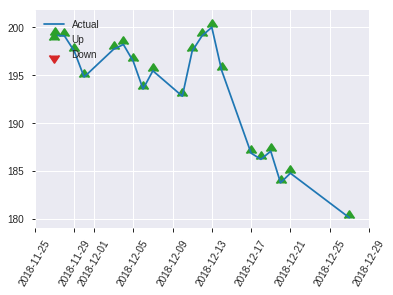


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.2633201115962899
RMSE: 0.5131472611212983
LogLoss: 0.7207004169386556
Null degrees of freedom: 248
Residual degrees of freedom: 53
Null deviance: 345.1994009871195
Residual deviance: 358.90880763545044
AIC: 750.9088076354504
AUC: 0.5313548387096775
pr_auc: 0.5289292183872637
Gini: 0.06270967741935496
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3088643304549764: 


,0,1,Error,Rate
0,0.0,124.0,1.0,(124.0/124.0)
1,0.0,125.0,0.0,(0.0/125.0)
Total,0.0,249.0,0.498,(124.0/249.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3088643,0.6684492,248.0
max f2,0.3088643,0.8344459,248.0
max f0point5,0.3697948,0.5624297,190.0
max accuracy,0.3988437,0.5421687,80.0
max precision,0.4323448,1.0,0.0
max recall,0.3088643,1.0,248.0
max specificity,0.4323448,1.0,0.0
max absolute_mcc,0.3165901,0.1272632,244.0
max min_per_class_accuracy,0.3884835,0.5241935,124.0
max mean_per_class_accuracy,0.3988437,0.5428710,80.0


Gains/Lift Table: Avg response rate: 50.20 %, avg score: 38.50 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0120482,0.4226502,1.992,1.992,1.0,0.4264572,1.0,0.4264572,0.024,0.024,99.2,99.2
,2,0.0200803,0.4187395,0.0,1.1952000,0.0,0.4208354,0.6,0.4242085,0.0,0.024,-100.0,19.5200000
,3,0.0321285,0.4174937,0.6640000,0.996,0.3333333,0.4180906,0.5,0.4219143,0.008,0.032,-33.6000000,-0.4000000
,4,0.0401606,0.4154524,0.0,0.7968,0.0,0.4167712,0.4,0.4208856,0.0,0.032,-100.0,-20.3200000
,5,0.0522088,0.4148945,1.992,1.0726154,1.0,0.4152369,0.5384615,0.4195821,0.024,0.056,99.2,7.2615385
,6,0.1004016,0.4117829,0.996,1.03584,0.5,0.4131247,0.52,0.4164826,0.048,0.104,-0.4000000,3.5840000
,7,0.1526104,0.4089073,1.3790769,1.1532632,0.6923077,0.4103645,0.5789474,0.4143895,0.072,0.176,37.9076923,15.3263158
,8,0.2008032,0.4050717,0.996,1.11552,0.5,0.4065487,0.56,0.4125077,0.048,0.224,-0.4000000,11.5520000
,9,0.3012048,0.3997013,0.9561600,1.0624,0.48,0.4023365,0.5333333,0.4091173,0.096,0.32,-4.3840000,6.2400000
,10,0.4016064,0.3944241,1.11552,1.07568,0.56,0.3971495,0.54,0.4061254,0.112,0.432,11.5520000,7.5680000


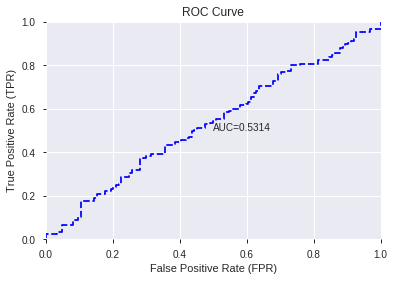

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


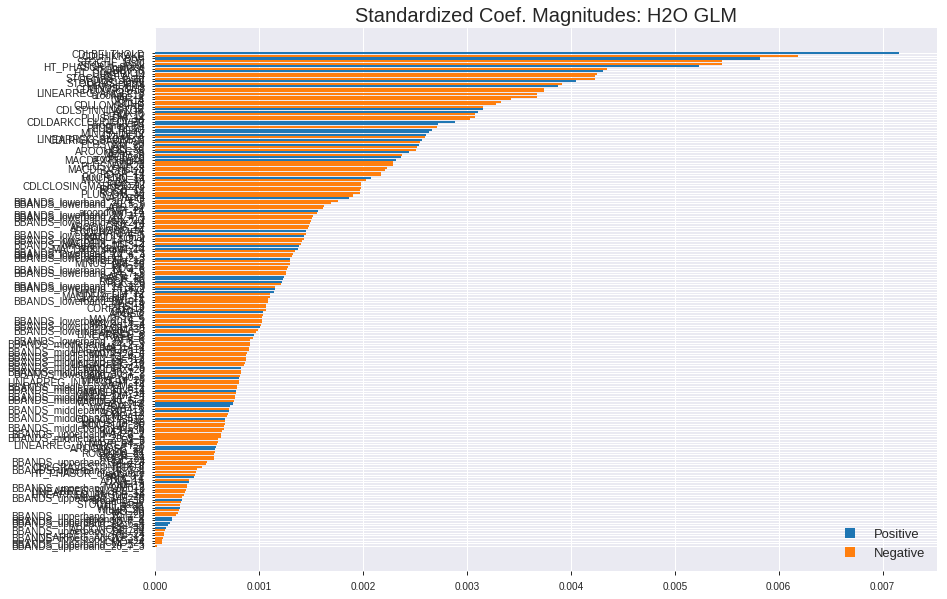

'log_likelihood'
--2019-08-27 22:08:04--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.8.163
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.8.163|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


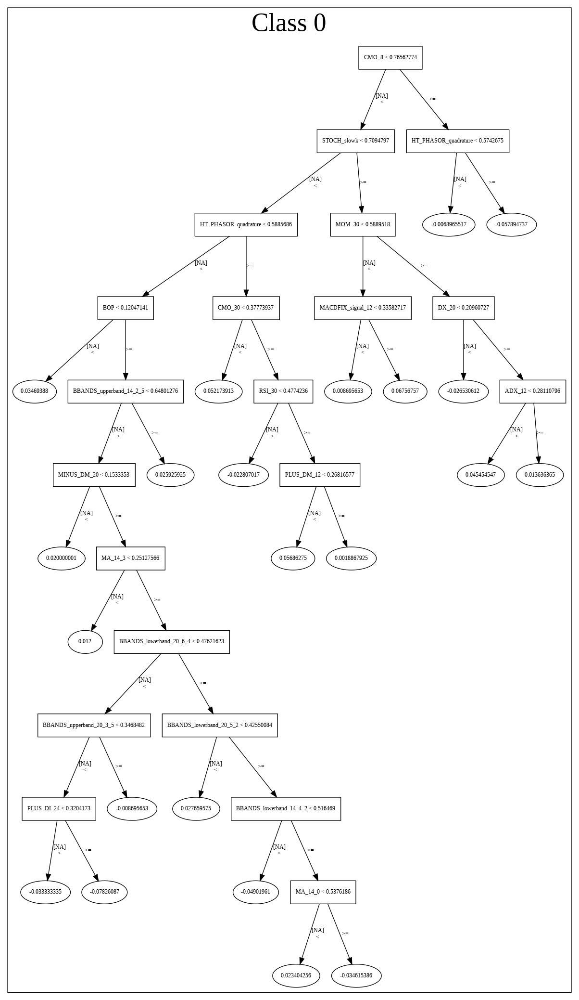

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190827_220755_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190827_220755_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_106_sid_8014',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_106

['CDLBELTHOLD',
 'CDLHIKKAKE',
 'BOP',
 'STOCHF_fastd',
 'STOCH_slowk',
 'HT_PHASOR_inphase',
 'STDDEV_8',
 'HT_DCPERIOD',
 'BETA_14',
 'STOCHRSI_fastd',
 'STOCH_slowd',
 'STOCHRSI_fastk',
 'PLUS_DI_14',
 'MINUS_DI_8',
 'CDLDOJISTAR',
 'LINEARREG_ANGLE_8',
 'aroonup_12',
 'VAR_8',
 'CCI_14',
 'CCI_8',
 'CDLLONGLINE',
 'CCI_12',
 'CDLSPINNINGTOP',
 'ADX_8',
 'BETA_12',
 'PLUS_DM_14',
 'CCI_20',
 'CDLDARKCLOUDCOVER',
 'aroonup_24',
 'PLUS_DI_24',
 'ULTOSC',
 'MINUS_DI_12',
 'CDLDOJI',
 'LINEARREG_SLOPE_8',
 'CDLRICKSHAWMAN',
 'PLUS_DM_20',
 'VAR_12',
 'CCI_30',
 'AROONOSC_8',
 'MOM_20',
 'BETA_8',
 'aroonup_20',
 'MACDEXT_signal',
 'NATR_8',
 'PLUS_DM_24',
 'MACDFIX_hist_8',
 'CCI_24',
 'ROCP_14',
 'ROCR100_14',
 'MINUS_DI_14',
 'DX_20',
 'ROC_12',
 'CDLCLOSINGMARUBOZU',
 'ROCP_12',
 'ROCR_12',
 'PLUS_DM_30',
 'NATR_24',
 'APO',
 'BBANDS_lowerband_20_1_5',
 'BBANDS_lowerband_20_5_5',
 'ATR_24',
 'MFI_24',
 'aroondown_14',
 'BBANDS_lowerband_20_1_4',
 'BBANDS_lowerband_14_4_5',
 'ADX_20',

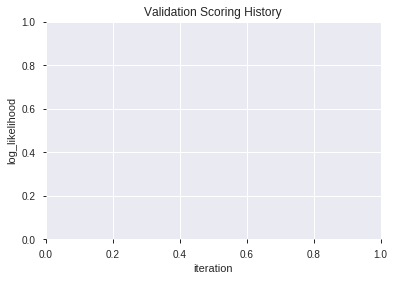

In [53]:
# GLM with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20190827_220810_model_1,0.542806,0.743625,0.451419,0.522852,0.273374
1,XGBoost_grid_1_AutoML_20190827_220810_model_4,0.542516,0.692373,0.483806,0.499621,0.249621
2,XGBoost_grid_1_AutoML_20190827_220810_model_5,0.523290,0.759496,0.495968,0.528792,0.279621
3,XGBoost_grid_1_AutoML_20190827_220810_model_7,0.515613,0.733515,0.500000,0.518250,0.268583
4,XGBoost_grid_1_AutoML_20190827_220810_model_3,0.504839,0.741766,0.500000,0.521463,0.271924
5,XGBoost_3_AutoML_20190827_220810,0.501290,0.732306,0.500000,0.518122,0.268450
6,XGBoost_grid_1_AutoML_20190827_220810_model_2,0.496387,0.702795,0.500000,0.504648,0.254670
7,XGBoost_1_AutoML_20190827_220810,0.479677,0.733371,0.495968,0.518384,0.268722
8,XGBoost_grid_1_AutoML_20190827_220810_model_6,0.462839,0.720059,0.500000,0.512683,0.262844
9,XGBoost_2_AutoML_20190827_220810,0.460645,0.714909,0.495935,0.510176,0.260280


,variable,relative_importance,scaled_importance,percentage
0,CORREL_12,174.492432,1.000000,0.035076
1,BETA_14,148.988449,0.853839,0.029949
2,CORREL_8,148.416687,0.850562,0.029834
3,STOCHF_fastk,137.906723,0.790331,0.027721
4,HT_PHASOR_inphase,121.281914,0.695055,0.024380
5,PLUS_DM_20,116.395325,0.667051,0.023397
6,ULTOSC,111.789452,0.640655,0.022471
7,STOCHRSI_fastd,108.938957,0.624319,0.021899
8,CCI_24,104.250168,0.597448,0.020956
9,BETA_8,93.596039,0.536390,0.018814


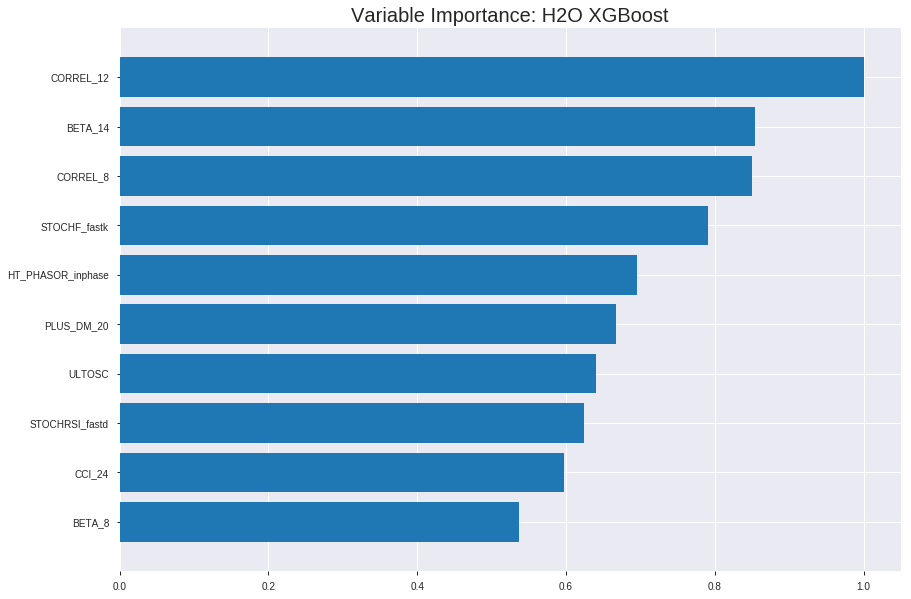

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190827_220810_model_1


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.18248642581784638
RMSE: 0.42718429959192833
LogLoss: 0.5540097452622734
Mean Per-Class Error: 0.1432430113771349
AUC: 0.9349371749861415
pr_auc: 0.937601672677433
Gini: 0.869874349972283
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.49057792954974705: 


,0,1,Error,Rate
0,682.0,178.0,0.207,(178.0/860.0)
1,79.0,802.0,0.0897,(79.0/881.0)
Total,761.0,980.0,0.1476,(257.0/1741.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4905779,0.8619022,214.0
max f2,0.4592456,0.9092854,246.0
max f0point5,0.5349531,0.8810869,171.0
max accuracy,0.5022140,0.8569787,202.0
max precision,0.8088834,1.0,0.0
max recall,0.3855539,1.0,313.0
max specificity,0.8088834,1.0,0.0
max absolute_mcc,0.5010067,0.7144796,203.0
max min_per_class_accuracy,0.5061728,0.8523256,198.0
max mean_per_class_accuracy,0.5022140,0.8567570,202.0


Gains/Lift Table: Avg response rate: 50.60 %, avg score: 50.56 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103389,0.7444543,1.9761635,1.9761635,1.0,0.7696428,1.0,0.7696428,0.0204313,0.0204313,97.6163451,97.6163451
,2,0.0201034,0.7168537,1.9761635,1.9761635,1.0,0.7302751,1.0,0.7505213,0.0192963,0.0397276,97.6163451,97.6163451
,3,0.0304423,0.7044948,1.9761635,1.9761635,1.0,0.7103857,1.0,0.7368904,0.0204313,0.0601589,97.6163451,97.6163451
,4,0.0402068,0.6916641,1.9761635,1.9761635,1.0,0.6987607,1.0,0.7276303,0.0192963,0.0794552,97.6163451,97.6163451
,5,0.0505457,0.6833839,1.9761635,1.9761635,1.0,0.6865738,1.0,0.7192324,0.0204313,0.0998865,97.6163451,97.6163451
,6,0.1005169,0.6480867,1.9534489,1.9648711,0.9885057,0.6625355,0.9942857,0.6910459,0.0976163,0.1975028,95.3448928,96.4871088
,7,0.1504882,0.6248405,1.9534489,1.9610782,0.9885057,0.6357864,0.9923664,0.6726964,0.0976163,0.2951192,95.3448928,96.1078233
,8,0.2004595,0.6049464,1.9534489,1.9591764,0.9885057,0.6141930,0.9914040,0.6581124,0.0976163,0.3927355,95.3448928,95.9176372
,9,0.3004021,0.5675212,1.7717327,1.8968146,0.8965517,0.5857968,0.9598470,0.6340533,0.1770715,0.5698070,77.1732749,89.6814631
,10,0.4003446,0.5367479,1.6468029,1.8344014,0.8333333,0.5516389,0.9282640,0.6134793,0.1645857,0.7343927,64.6802876,83.4401367




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.28410842850055645
RMSE: 0.5330182252986819
LogLoss: 0.7664928929689112
Mean Per-Class Error: 0.4419561835623542
AUC: 0.5597371661913404
pr_auc: 0.5708273837617516
Gini: 0.11947433238268079
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.23228715360164642: 


,0,1,Error,Rate
0,14.0,218.0,0.9397,(218.0/232.0)
1,6.0,260.0,0.0226,(6.0/266.0)
Total,20.0,478.0,0.4498,(224.0/498.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2322872,0.6989247,379.0
max f2,0.1891155,0.8514725,399.0
max f0point5,0.3008872,0.6054461,287.0
max accuracy,0.3008872,0.5722892,287.0
max precision,0.6768532,1.0,0.0
max recall,0.1891155,1.0,399.0
max specificity,0.6768532,1.0,0.0
max absolute_mcc,0.3008872,0.1277451,287.0
max min_per_class_accuracy,0.3319576,0.5387931,210.0
max mean_per_class_accuracy,0.3272153,0.5580438,222.0


Gains/Lift Table: Avg response rate: 53.41 %, avg score: 34.16 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100402,0.5330388,1.1233083,1.1233083,0.6,0.6410708,0.6,0.6410708,0.0112782,0.0112782,12.3308271,12.3308271
,2,0.0200803,0.4998431,0.7488722,0.9360902,0.4,0.5158700,0.5,0.5784704,0.0075188,0.0187970,-25.1127820,-6.3909774
,3,0.0301205,0.4853815,1.8721805,1.2481203,1.0,0.4958892,0.6666667,0.5509433,0.0187970,0.0375940,87.2180451,24.8120301
,4,0.0401606,0.4791256,1.4977444,1.3105263,0.8,0.4814486,0.7,0.5335697,0.0150376,0.0526316,49.7744361,31.0526316
,5,0.0502008,0.4725865,1.1233083,1.2730827,0.6,0.4760378,0.68,0.5220633,0.0112782,0.0639098,12.3308271,27.3082707
,6,0.1004016,0.4293815,0.7488722,1.0109774,0.4,0.4458265,0.54,0.4839449,0.0375940,0.1015038,-25.1127820,1.0977444
,7,0.1506024,0.4111774,1.1981955,1.0733835,0.64,0.4201126,0.5733333,0.4626675,0.0601504,0.1616541,19.8195489,7.3383459
,8,0.2008032,0.3917097,1.0484211,1.0671429,0.56,0.4001297,0.57,0.4470330,0.0526316,0.2142857,4.8421053,6.7142857
,9,0.3012048,0.3673332,1.0109774,1.0484211,0.54,0.3793997,0.56,0.4244886,0.1015038,0.3157895,1.0977444,4.8421053
,10,0.3995984,0.3491876,1.2226485,1.0913213,0.6530612,0.3579419,0.5829146,0.4081027,0.1203008,0.4360902,22.2648458,9.1321268



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-27 22:08:17,0.016 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4939690,0.5,0.6931472,0.5,0.0,1.0,0.4658635
,2019-08-27 22:08:17,0.278 sec,5.0,0.4888750,0.6710716,0.7382724,0.7503547,1.9761635,0.3532453,0.5091806,0.7118412,0.5082885,0.5484246,1.1233083,0.4518072
,2019-08-27 22:08:17,0.369 sec,10.0,0.4793348,0.6523991,0.8065775,0.8128122,1.9761635,0.2802987,0.5112911,0.7162968,0.5569905,0.5853679,1.8721805,0.4477912
,2019-08-27 22:08:17,0.449 sec,15.0,0.4717815,0.6377227,0.8307678,0.8335502,1.9761635,0.2642160,0.5213263,0.7381149,0.5515621,0.5855454,1.4977444,0.4598394
,2019-08-27 22:08:17,0.544 sec,20.0,0.4641226,0.6230362,0.8648239,0.8663854,1.9761635,0.2314762,0.5211366,0.7378967,0.5663566,0.5940778,1.4977444,0.4497992
,2019-08-27 22:08:18,0.623 sec,25.0,0.4574410,0.6102777,0.8802741,0.8839761,1.9761635,0.2148191,0.5212101,0.7381124,0.5734298,0.5983811,1.1233083,0.4558233
,2019-08-27 22:08:18,0.704 sec,30.0,0.4507727,0.5977029,0.8937215,0.8959063,1.9761635,0.1987364,0.5226794,0.7414580,0.5761764,0.5890077,1.1233083,0.4538153
,2019-08-27 22:08:18,0.783 sec,35.0,0.4455123,0.5877928,0.9032831,0.9070384,1.9761635,0.1826536,0.5277822,0.7533085,0.5695246,0.5812402,1.1233083,0.4578313
,2019-08-27 22:08:18,0.874 sec,40.0,0.4385539,0.5748929,0.9173449,0.9201870,1.9761635,0.1751867,0.5269114,0.7514129,0.5737134,0.5825166,1.1233083,0.4578313
,2019-08-27 22:08:18,0.958 sec,45.0,0.4321817,0.5631493,0.9285557,0.9314418,1.9761635,0.1556577,0.5288310,0.7561825,0.5647767,0.5739894,1.1233083,0.4357430


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CORREL_12,174.4924316,1.0,0.0350758
BETA_14,148.9884491,0.8538390,0.0299491
CORREL_8,148.4166870,0.8505623,0.0298342
STOCHF_fastk,137.9067230,0.7903307,0.0277215
HT_PHASOR_inphase,121.2819138,0.6950554,0.0243796
---,---,---,---
ADX_14,3.6347547,0.0208304,0.0007306
aroonup_12,3.5346167,0.0202566,0.0007105
CDLLONGLINE,3.3176255,0.0190130,0.0006669
ROCP_24,3.2200603,0.0184539,0.0006473



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5502008032128514)

('F1', 0.6799999999999999)

('auc', 0.5428064516129033)

('logloss', 0.7436246730936049)

('mean_per_class_error', 0.45038709677419364)

('rmse', 0.5228516642353247)

('mse', 0.2733738627936487)

xgboost prediction progress: |████████████████████████████████████████████| 100%


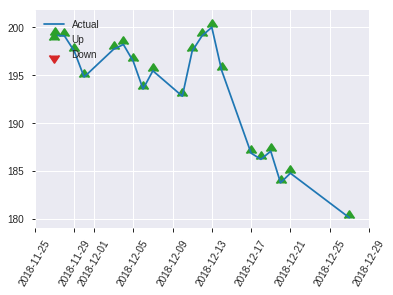


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.2733738627936487
RMSE: 0.5228516642353247
LogLoss: 0.7436246730936049
Mean Per-Class Error: 0.45038709677419364
AUC: 0.5428064516129033
pr_auc: 0.5321167104816201
Gini: 0.08561290322580661
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2763395309448242: 


,0,1,Error,Rate
0,18.0,106.0,0.8548,(106.0/124.0)
1,6.0,119.0,0.048,(6.0/125.0)
Total,24.0,225.0,0.4498,(112.0/249.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2763395,0.6800000,223.0
max f2,0.1723606,0.8344459,247.0
max f0point5,0.2763395,0.5804878,223.0
max accuracy,0.3170514,0.5502008,159.0
max precision,0.4866441,1.0,0.0
max recall,0.1723606,1.0,247.0
max specificity,0.4866441,1.0,0.0
max absolute_mcc,0.2763395,0.1646123,223.0
max min_per_class_accuracy,0.3438661,0.5403226,123.0
max mean_per_class_accuracy,0.3170514,0.5496129,159.0


Gains/Lift Table: Avg response rate: 50.20 %, avg score: 34.58 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0120482,0.4771185,1.992,1.992,1.0,0.4815862,1.0,0.4815862,0.024,0.024,99.2,99.2
,2,0.0200803,0.4733165,0.996,1.5936,0.5,0.4756548,0.8,0.4792137,0.008,0.032,-0.4000000,59.3600000
,3,0.0321285,0.4609089,1.3280000,1.494,0.6666667,0.4692483,0.75,0.4754767,0.016,0.048,32.8000000,49.4
,4,0.0401606,0.4444329,0.0,1.1952000,0.0,0.4506000,0.6,0.4705013,0.0,0.048,-100.0,19.5200000
,5,0.0522088,0.4408882,0.0,0.9193846,0.0,0.4428787,0.4615385,0.4641269,0.0,0.048,-100.0,-8.0615385
,6,0.1004016,0.4146301,1.162,1.03584,0.5833333,0.4267419,0.52,0.4461821,0.056,0.104,16.2000000,3.5840000
,7,0.1526104,0.4068303,0.9193846,0.996,0.4615385,0.4124646,0.5,0.4346472,0.048,0.152,-8.0615385,-0.4000000
,8,0.2008032,0.3985194,1.3280000,1.07568,0.6666667,0.4026811,0.54,0.4269753,0.064,0.216,32.8000000,7.5680000
,9,0.3012048,0.3763586,0.8764800,1.00928,0.44,0.3868513,0.5066667,0.4136007,0.088,0.304,-12.3520000,0.9280000
,10,0.4016064,0.3585890,1.27488,1.07568,0.64,0.3668000,0.54,0.4019005,0.128,0.432,27.488,7.5680000


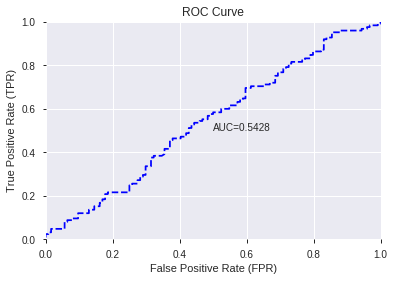

This function is available for GLM models only


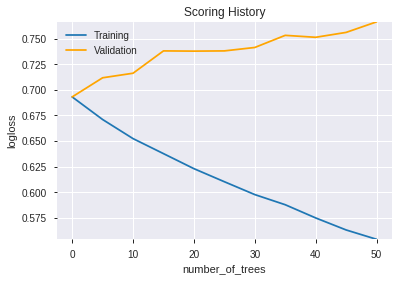

--2019-08-27 22:08:33--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.161.59
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.161.59|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoMode

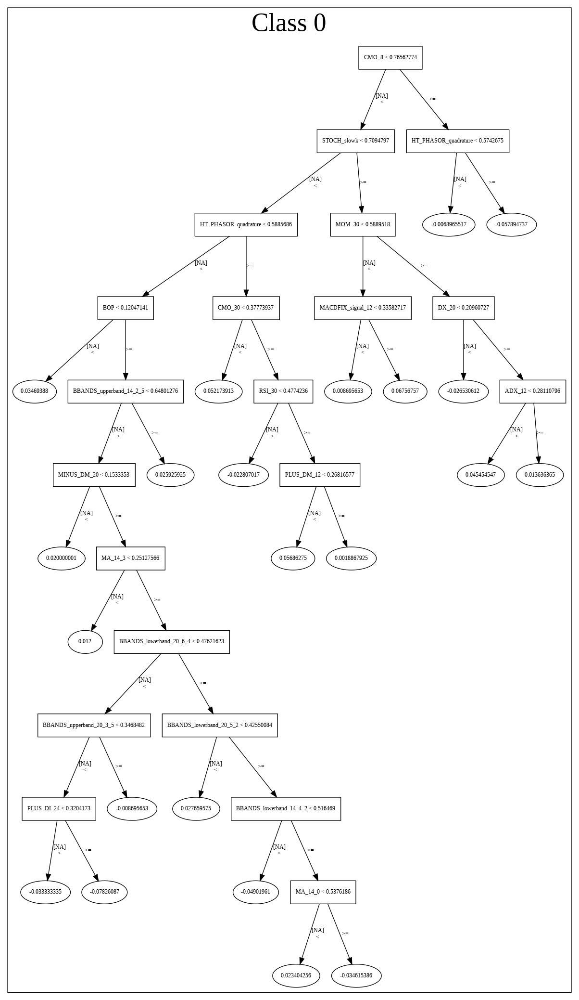

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20190827_220810_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20190827_220810_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_114_sid_8014',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_trainin

['CORREL_12',
 'BETA_14',
 'CORREL_8',
 'STOCHF_fastk',
 'HT_PHASOR_inphase',
 'PLUS_DM_20',
 'ULTOSC',
 'STOCHRSI_fastd',
 'CCI_24',
 'BETA_8',
 'NATR_8',
 'HT_DCPERIOD',
 'MINUS_DI_14',
 'BBANDS_middleband_14_6_2',
 'ADOSC',
 'HT_PHASOR_quadrature',
 'STDDEV_12',
 'STOCH_slowd',
 'CDLBELTHOLD',
 'AROONOSC_24',
 'BBANDS_upperband_20_7_2',
 'ATR_24',
 'BOP',
 'SAR_0.2',
 'CCI_20',
 'DX_14',
 'ROC_8',
 'ATR_14',
 'CCI_12',
 'WILLR_20',
 'MACDEXT_signal',
 'STOCH_slowk',
 'DX_20',
 'MFI_12',
 'MACDFIX_hist_14',
 'MFI_8',
 'ADX_8',
 'STOCHRSI_fastk',
 'BETA_12',
 'DX_8',
 'MINUS_DI_8',
 'MACDFIX_hist_12',
 'LINEARREG_ANGLE_12',
 'ADXR_12',
 'MACDFIX_hist_8',
 'MACDEXT_hist',
 'MINUS_DI_12',
 'MOM_14',
 'ADX_20',
 'WILLR_24',
 'BBANDS_lowerband_14_4_5',
 'MINUS_DI_20',
 'NATR_24',
 'CCI_30',
 'MOM_30',
 'PLUS_DM_14',
 'aroonup_20',
 'ATR_8',
 'BBANDS_lowerband_14_2_4',
 'MAVP_14_4',
 'STDDEV_8',
 'AROONOSC_14',
 'CCI_8',
 'ROC_24',
 'BBANDS_lowerband_30_0_5',
 'LINEARREG_ANGLE_8',
 'ROCR_3

In [54]:
# XGBoost with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="XGBoost",features_list=features_list)

In [55]:
# Experiment Summary
pd.set_option('precision', 3) 

for k in models_summary:
  print(k)
  display(models_summary[k].max())
  print('\n'*3)
  display(models_summary[k].groupby(models_summary[k].index).max())
  print('\n'*3)
  
display(models_summary)

pd.set_option('precision', 6) 

accuracy


DeepLearning    0.578
GLM             0.542
XGBoost         0.586
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.502,0.502,0.586
DLF,0.502,0.502,0.550
Fwe,0.502,0.502,0.586
RFE,0.578,0.542,0.550
XGBF,0.502,0.502,0.550






F1


DeepLearning    0.670
GLM             0.668
XGBoost         0.680
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.668,0.668,0.674
DLF,0.668,0.668,0.674
Fwe,0.668,0.668,0.674
RFE,0.670,0.668,0.680
XGBF,0.668,0.668,0.674






auc


DeepLearning    0.554
GLM             0.531
XGBoost         0.563
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.500,0.500,0.563
DLF,0.500,0.500,0.525
Fwe,0.500,0.500,0.563
RFE,0.554,0.531,0.543
XGBF,0.500,0.500,0.525






logloss


DeepLearning    17.339
GLM             17.339
XGBoost          0.744
dtype: float64

,DeepLearning,GLM,XGBoost
All,17.200,17.339,0.710
DLF,17.339,17.339,0.722
Fwe,17.200,17.339,0.710
RFE,1.757,0.721,0.744
XGBF,17.339,17.339,0.722






mean_per_class_error


DeepLearning    0.50
GLM             0.50
XGBoost         0.45
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.500,0.500,0.414
DLF,0.500,0.500,0.450
Fwe,0.500,0.500,0.414
RFE,0.421,0.457,0.450
XGBF,0.500,0.500,0.450






rmse


DeepLearning    0.709
GLM             0.709
XGBoost         0.523
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.706,0.709,0.508
DLF,0.709,0.709,0.513
Fwe,0.706,0.709,0.508
RFE,0.643,0.513,0.523
XGBF,0.709,0.709,0.513






mse


DeepLearning    0.502
GLM             0.502
XGBoost         0.273
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.498,0.502,0.258
DLF,0.502,0.502,0.264
Fwe,0.498,0.502,0.258
RFE,0.413,0.263,0.273
XGBF,0.502,0.502,0.264


{'F1':       DeepLearning    GLM  XGBoost
 All          0.668    NaN      NaN
 DLF          0.668    NaN      NaN
 DLF            NaN  0.668      NaN
 DLF            NaN    NaN    0.674
 All            NaN  0.668      NaN
 All            NaN    NaN    0.674
 XGBF         0.668    NaN      NaN
 XGBF           NaN  0.668      NaN
 XGBF           NaN    NaN    0.674
 Fwe          0.668    NaN      NaN
 Fwe            NaN  0.668      NaN
 Fwe            NaN    NaN    0.674
 RFE          0.670    NaN      NaN
 RFE            NaN  0.668      NaN
 RFE            NaN    NaN    0.680,
 'accuracy':       DeepLearning    GLM  XGBoost
 All          0.502    NaN      NaN
 DLF          0.502    NaN      NaN
 DLF            NaN  0.502      NaN
 DLF            NaN    NaN    0.550
 All            NaN  0.502      NaN
 All            NaN    NaN    0.586
 XGBF         0.502    NaN      NaN
 XGBF           NaN  0.502      NaN
 XGBF           NaN    NaN    0.550
 Fwe          0.502    NaN      NaN
 Fwe     